In [1]:
import plotly.io as pio
pio.renderers.default = "notebook_connected"


In [2]:
# Install necessary packages (only if not already installed)
!pip install tensorflow pandas numpy matplotlib openpyxl


Defaulting to user installation because normal site-packages is not writeable


In [3]:
!pip install plotly cufflinks chart_studio


Defaulting to user installation because normal site-packages is not writeable


In [4]:
import cufflinks as cf
import chart_studio.plotly as py
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.io as pio
from plotly.offline import init_notebook_mode

# Configure Plotly to work in the Jupyter notebook
pio.renderers.default = "notebook_connected"
init_notebook_mode(connected=False)
cf.go_offline()  # Enable Cufflinks offline mode for use with Pandas


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

In [6]:
df1 = pd.read_excel('DS1.xlsx')
df2 = pd.read_excel('DS2.xlsx')
df3 = pd.read_excel('DS3.xlsx')
df4 = pd.read_excel('DS4.xlsx')

In [7]:
#ds1 info,describe and shape

print(df1.info())
print(df1.describe())
print(df1.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 0 to 43
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   yyyy                  44 non-null     int64  
 1   Sea of Okhotsk        44 non-null     float64
 2   Bering Sea            44 non-null     float64
 3   Hudson Bay            44 non-null     float64
 4   Baffin Bay            44 non-null     float64
 5   Greenland Sea         44 non-null     float64
 6   Barent Sea            44 non-null     float64
 7   Kara Sea              44 non-null     float64
 8   Laptev Sea            44 non-null     float64
 9   East Siberian Sea     44 non-null     float64
 10  Chukchi Sea           44 non-null     float64
 11  Beaufort Sea          44 non-null     float64
 12  Canadian Archipelago  44 non-null     float64
 13   Central Arctic       44 non-null     float64
 14  All Regions           44 non-null     float64
dtypes: float64(14), int64(1)


In [8]:
#ds2 info,describe and shape
print(df2.info())
print(df2.describe())
print(df2.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 0 to 43
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   yyyy                  44 non-null     int64  
 1   Sea of Okhotsk        44 non-null     float64
 2   Bering Sea            44 non-null     float64
 3   Hudson Bay            44 non-null     float64
 4   Baffin Bay            44 non-null     float64
 5   Greenland Sea         44 non-null     float64
 6   Barents Sea           44 non-null     float64
 7   Kara Sea              44 non-null     float64
 8   Laptev Sea            44 non-null     float64
 9   East Siberian Sea     44 non-null     float64
 10  Chukchi Sea           44 non-null     float64
 11  Beaufort Sea          44 non-null     float64
 12  Canadian Archipelago  44 non-null     float64
 13  Central Arctic        44 non-null     float64
 14  All Regions           44 non-null     float64
dtypes: float64(14), int64(1)


In [9]:
#ds3 info,describe and shape
print(df3.info())
print(df3.describe())
print(df3.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 0 to 43
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   yyyy                  44 non-null     int64  
 1   Sea of Okhotsk        44 non-null     float64
 2   Bering Sea            44 non-null     float64
 3   Hudson Bay            44 non-null     float64
 4   Baffin Bay            44 non-null     float64
 5   Greenland Sea         44 non-null     float64
 6   Barents Sea           44 non-null     float64
 7   Kara Sea              44 non-null     float64
 8   Laptev Sea            44 non-null     float64
 9   East Siberian Sea     44 non-null     float64
 10  Chukchi Sea           44 non-null     float64
 11  Beaufort Sea          44 non-null     float64
 12  Canadian Archipelago  44 non-null     float64
 13  Central Arctic        44 non-null     float64
 14  All Regions           44 non-null     float64
dtypes: float64(14), int64(1)


In [10]:
#ds4 info,describe and shape
print(df4.info())
print(df4.describe())
print(df4.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 0 to 43
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   yyyy                  44 non-null     int64  
 1   Sea of Oktosk         44 non-null     float64
 2   Bering Sea            44 non-null     float64
 3   Hudson Bay            44 non-null     float64
 4   Baffin Bay            44 non-null     float64
 5   Greenland Sea         44 non-null     float64
 6   Barent Sea            44 non-null     float64
 7   Kara Sea              44 non-null     float64
 8   Laptev Sea            44 non-null     float64
 9   East Siberian Sea     44 non-null     float64
 10  Chukchi Sea           44 non-null     float64
 11  Beaufort Sea          44 non-null     float64
 12  Canadian Archipelago  44 non-null     float64
 13  Central Arctic        44 non-null     float64
 14  All Regions           44 non-null     float64
dtypes: float64(14), int64(1)


# TIME SERIES ANALYSIS

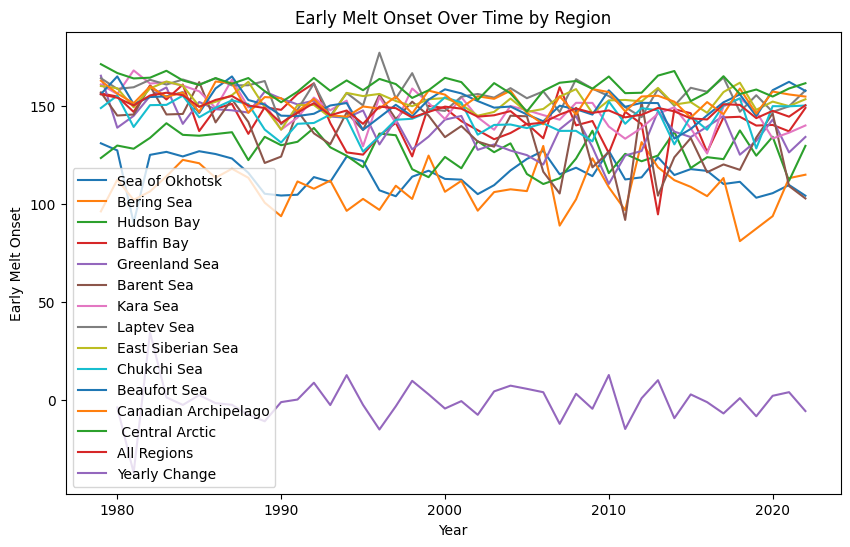

In [42]:
import matplotlib.pyplot as plt

# Create a figure and axis object
fig, ax = plt.subplots(figsize=(10, 6))

# Loop through each column (starting from the second column) and plot it
for column in df1.columns[1:]:
    ax.plot(df1['yyyy'], df1[column], label=f'{column}')

# Add labels and title
ax.set_xlabel("Year")
ax.set_ylabel("Early Melt Onset")
ax.set_title("Early Melt Onset Over Time by Region")

# Add a legend
ax.legend()

# Display the plot
plt.show()


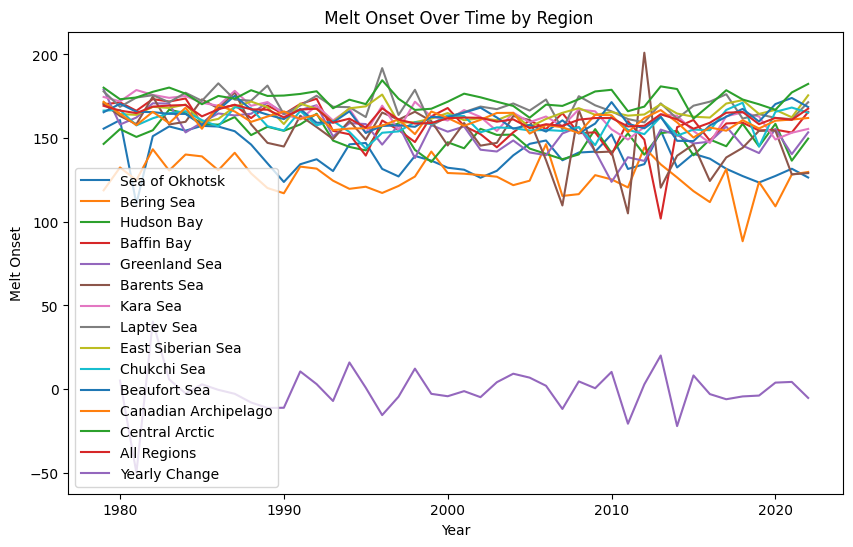

In [46]:
import matplotlib.pyplot as plt

# Create a figure and axis object
fig, ax = plt.subplots(figsize=(10, 6))

# Loop through each column (starting from the second column) and plot it
for column in df2.columns[1:]:
    ax.plot(df1['yyyy'], df2[column], label=f'{column}')

# Add labels and title
ax.set_xlabel("Year")
ax.set_ylabel("Melt Onset")
ax.set_title(" Melt Onset Over Time by Region")

# Add a legend
ax.legend()

# Display the plot
plt.show()


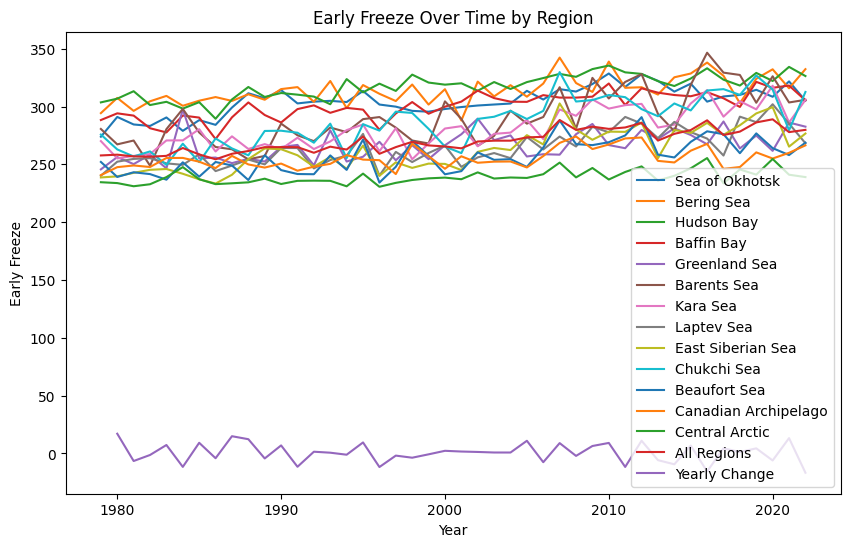

In [44]:
import matplotlib.pyplot as plt

# Create a figure and axis object
fig, ax = plt.subplots(figsize=(10, 6))

# Loop through each column (starting from the second column) and plot it
for column in df3.columns[1:]:
    ax.plot(df3['yyyy'], df3[column], label=f'{column}')

# Add labels and title
ax.set_xlabel("Year")
ax.set_ylabel("Early Freeze")
ax.set_title("Early Freeze Over Time by Region")

# Add a legend
ax.legend()

# Display the plot
plt.show()


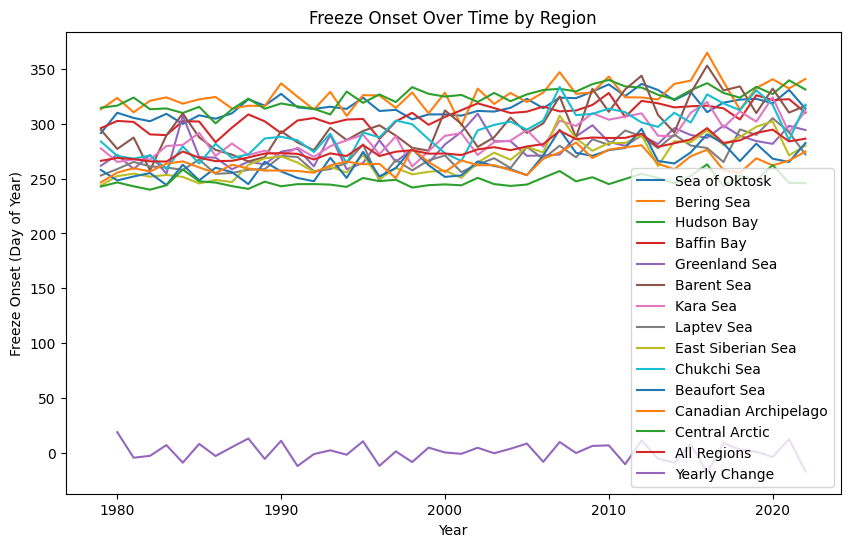

In [45]:
import matplotlib.pyplot as plt

# Create a figure and axis object
fig, ax = plt.subplots(figsize=(10, 6))

# Loop through each column (starting from the second column) and plot it
for column in df4.columns[1:]:
    ax.plot(df4['yyyy'], df4[column], label=f'{column}')

# Add labels and title
ax.set_xlabel("Year")
ax.set_ylabel("Freeze Onset (Day of Year)")
ax.set_title("Freeze Onset Over Time by Region")

# Add a legend
ax.legend()

# Display the plot
plt.show()


In [15]:
#Yearly Melt Onset Change: Calculate the difference between melt onset days year over year for each region to understand the rate of change (average/mean difference)
df_diff1 = df1.diff().mean()
df_diff1

yyyy                    1.000000
Sea of Okhotsk         -0.620930
Bering Sea              0.434628
Hudson Bay              0.143791
Baffin Bay             -0.171907
Greenland Sea          -0.725093
Barent Sea             -1.255860
Kara Sea               -0.486558
Laptev Sea             -0.145186
East Siberian Sea      -0.156465
Chukchi Sea             0.029698
Beaufort Sea            0.038000
Canadian Archipelago   -0.187953
 Central Arctic        -0.225698
All Regions            -0.130628
dtype: float64

In [16]:
#Yearly Melt Onset Change: Calculate the difference between melt onset days year over year for each region to understand the rate of change (average/mean difference)
df_diff2 = df2.diff().mean()
df_diff2

yyyy                    1.000000
Sea of Okhotsk         -0.678558
Bering Sea              0.255140
Hudson Bay              0.074140
Baffin Bay             -0.106023
Greenland Sea          -0.593465
Barents Sea            -0.962837
Kara Sea               -0.443721
Laptev Sea             -0.150209
East Siberian Sea       0.092791
Chukchi Sea            -0.028465
Beaufort Sea            0.071977
Canadian Archipelago   -0.221488
Central Arctic          0.052419
All Regions            -0.039349
dtype: float64

In [17]:
#Yearly Melt Onset Change: Calculate the difference between melt onset days year over year for each region to understand the rate of change (average/mean difference)
df_diff3 = df3.diff().mean()
df_diff3

yyyy                    1.000000
Sea of Okhotsk          0.725907
Bering Sea              0.884279
Hudson Bay              0.529814
Baffin Bay              0.396302
Greenland Sea           0.858674
Barents Sea             0.585744
Kara Sea                0.827186
Laptev Sea              0.651488
East Siberian Sea       0.883070
Chukchi Sea             0.856000
Beaufort Sea            0.387349
Canadian Archipelago    0.599279
Central Arctic          0.103116
All Regions             0.514372
dtype: float64

In [18]:
#Yearly Melt Onset Change: Calculate the difference between melt onset days year over year for each region to understand the rate of change (average/mean difference)
df_diff4 = df4.diff().mean()
df_diff4

yyyy                    1.000000
Sea of Oktosk           0.518581
Bering Sea              0.644000
Hudson Bay              0.386814
Baffin Bay              0.326558
Greenland Sea           0.758767
Barent Sea              0.510581
Kara Sea                0.791814
Laptev Sea              0.448767
East Siberian Sea       0.845372
Chukchi Sea             0.783628
Beaufort Sea            0.570953
Canadian Archipelago    0.652581
Central Arctic          0.071953
All Regions             0.469209
dtype: float64

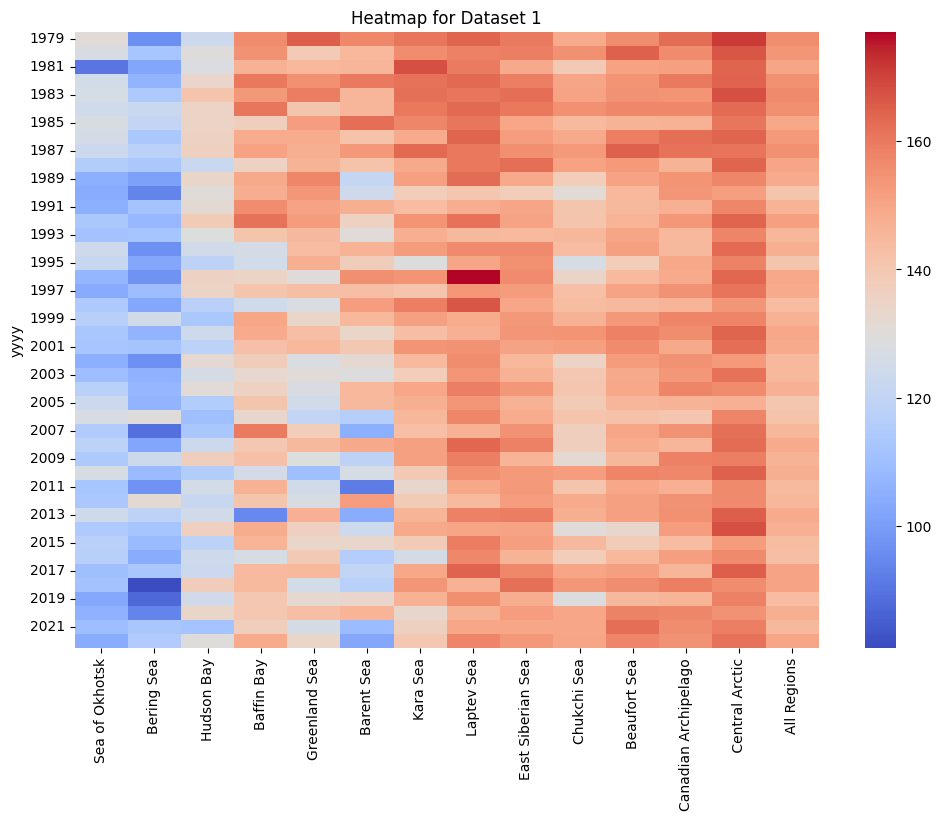

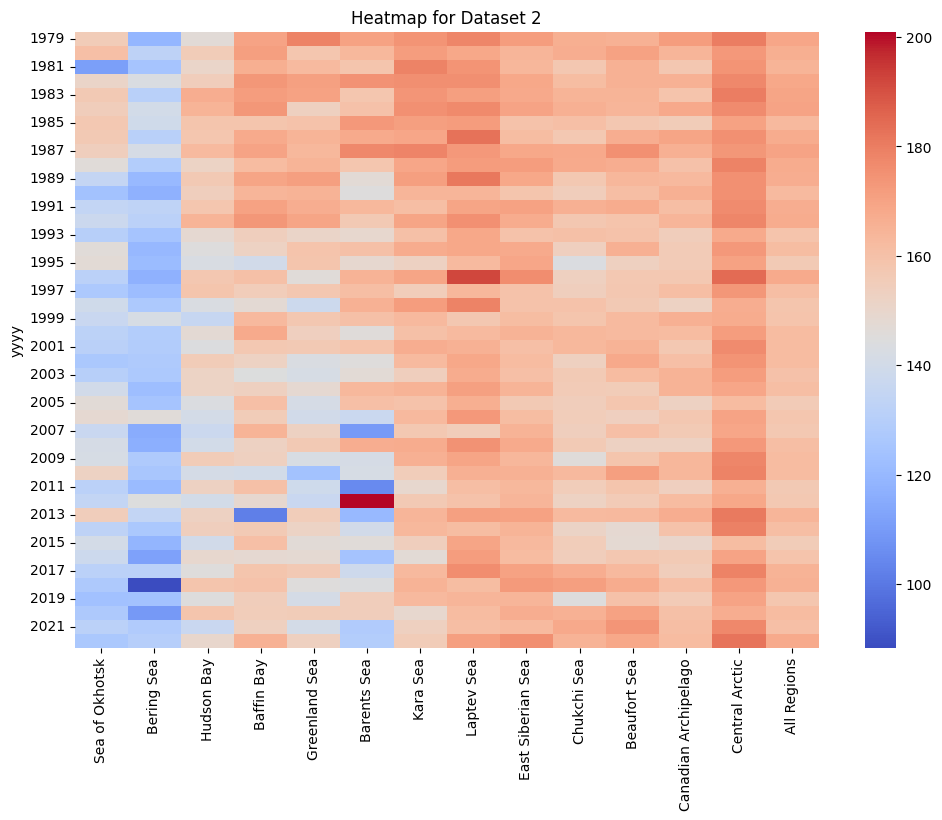

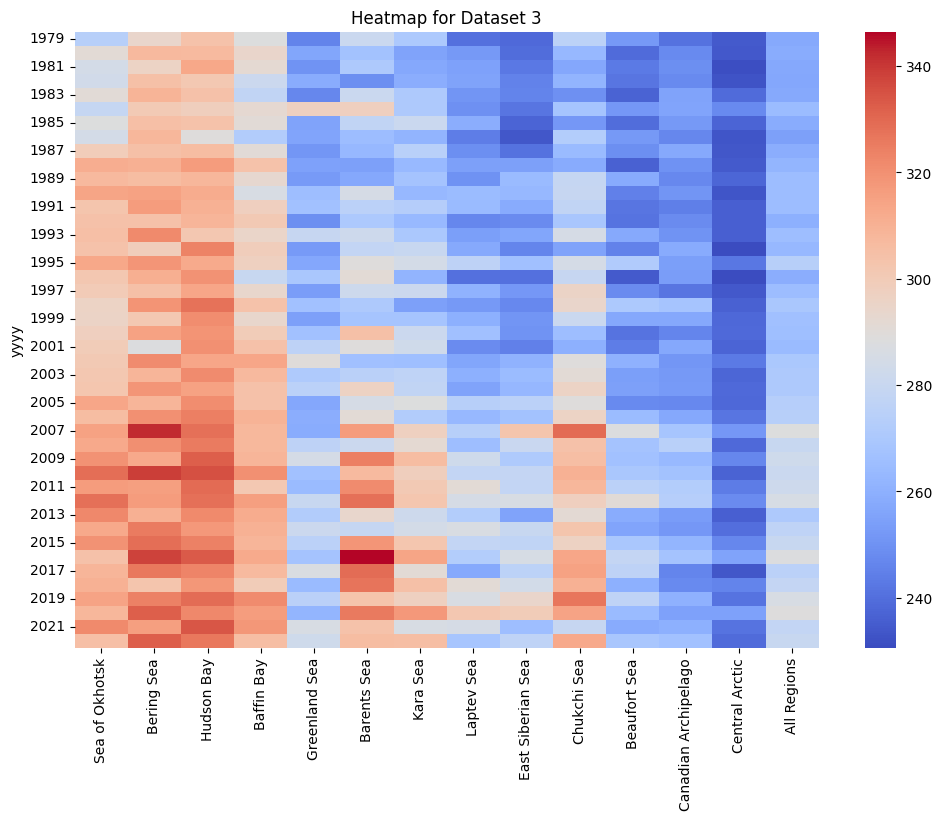

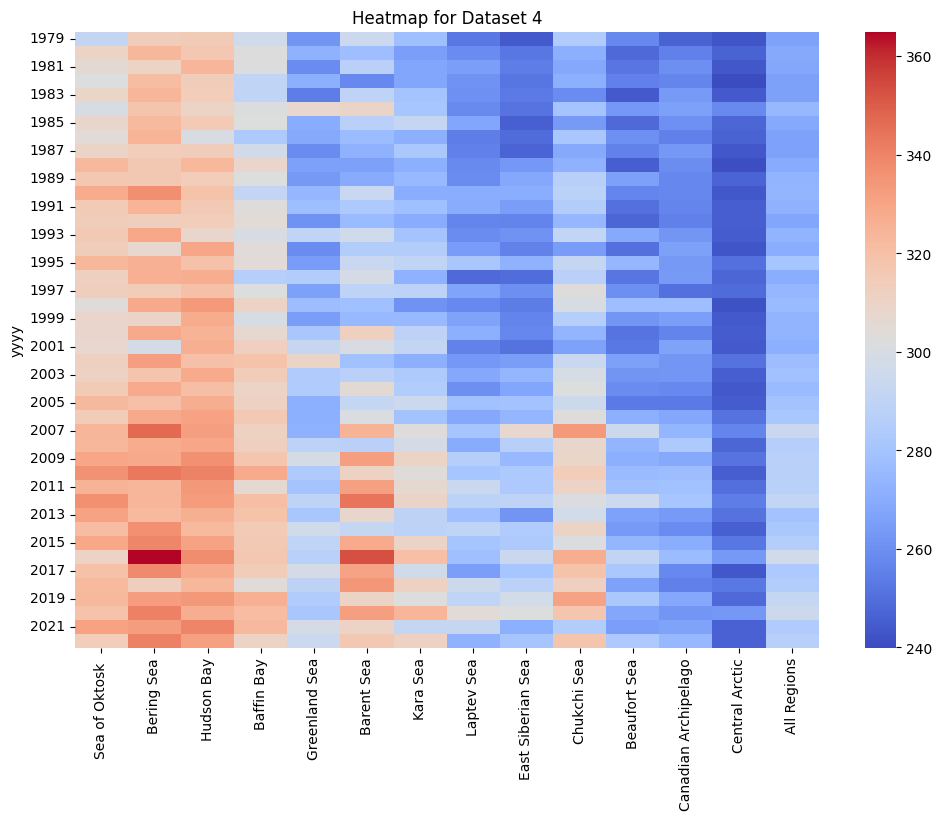

In [19]:
#heatmap for all the four datasets
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Heatmap for Dataset 1 (ds1)
plt.figure(figsize=(12, 8))
sns.heatmap(df1.set_index('yyyy'), cmap='coolwarm', annot=False)
plt.title('Heatmap for Dataset 1')
plt.show()

# 2. Heatmap for Dataset 2 (ds2)
plt.figure(figsize=(12, 8))
sns.heatmap(df2.set_index('yyyy'), cmap='coolwarm', annot=False)
plt.title('Heatmap for Dataset 2')
plt.show()

# 3. Heatmap for Dataset 3 (ds3)
plt.figure(figsize=(12, 8))
sns.heatmap(df3.set_index('yyyy'), cmap='coolwarm', annot=False)
plt.title('Heatmap for Dataset 3')
plt.show()

# 4. Heatmap for Dataset 4 (ds4)
plt.figure(figsize=(12, 8))
sns.heatmap(df4.set_index('yyyy'), cmap='coolwarm', annot=False)
plt.title('Heatmap for Dataset 4')
plt.show()


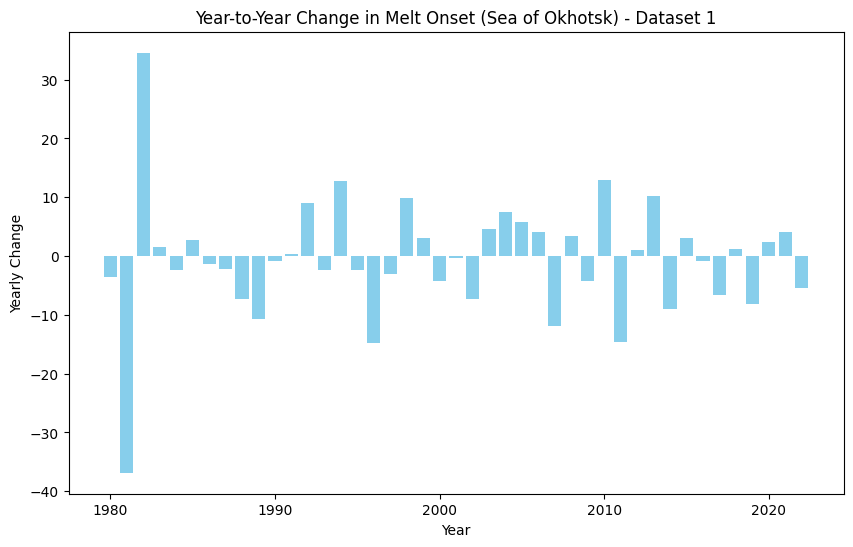

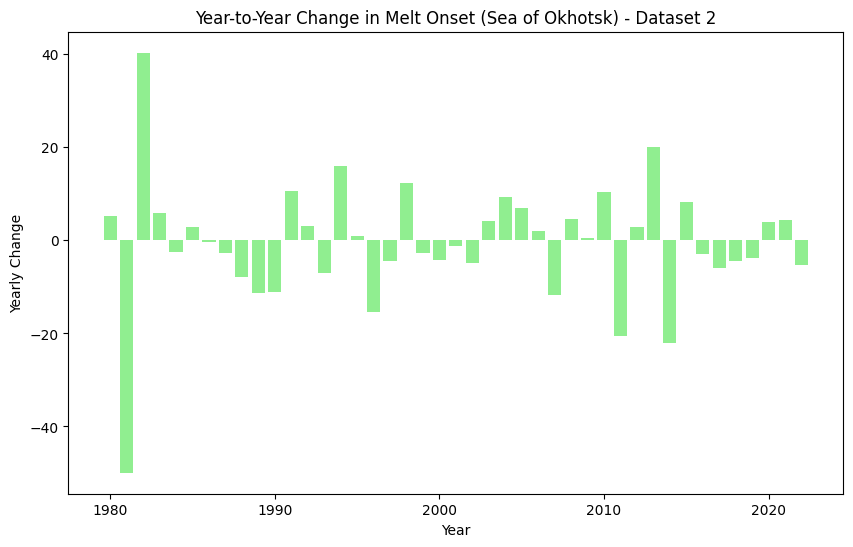

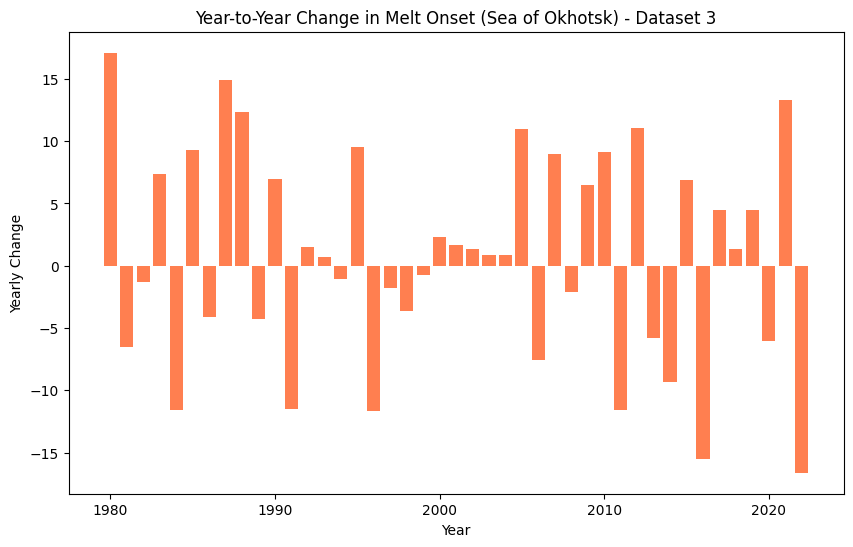

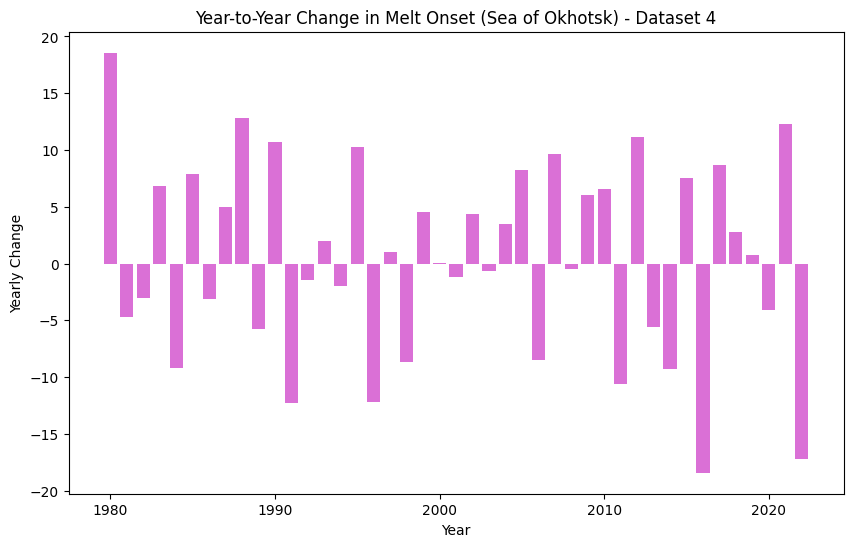

In [20]:
import matplotlib.pyplot as plt

# 1. Dataset 1: Calculate yearly change for a specific region
df1['Yearly Change'] = df1[df1.columns[1]].diff()  # Assuming column 1 is the region you want to analyze

# Bar plot for yearly changes in Dataset 1
plt.figure(figsize=(10, 6))
plt.bar(df1['yyyy'], df1['Yearly Change'], color='skyblue')
plt.xlabel('Year')
plt.ylabel('Yearly Change')
plt.title('Year-to-Year Change in Melt Onset (Sea of Okhotsk) - Dataset 1')
plt.show()

# 2. Dataset 2: Calculate yearly change for a specific region
df2['Yearly Change'] = df2[df2.columns[1]].diff()

# Bar plot for yearly changes in Dataset 2
plt.figure(figsize=(10, 6))
plt.bar(df2['yyyy'], df2['Yearly Change'], color='lightgreen')
plt.xlabel('Year')
plt.ylabel('Yearly Change')
plt.title('Year-to-Year Change in Melt Onset (Sea of Okhotsk) - Dataset 2')
plt.show()

# 3. Dataset 3: Calculate yearly change for a specific region
df3['Yearly Change'] = df3[df3.columns[1]].diff()

# Bar plot for yearly changes in Dataset 3
plt.figure(figsize=(10, 6))
plt.bar(df3['yyyy'], df3['Yearly Change'], color='coral')
plt.xlabel('Year')
plt.ylabel('Yearly Change')
plt.title('Year-to-Year Change in Melt Onset (Sea of Okhotsk) - Dataset 3')
plt.show()

# 4. Dataset 4: Calculate yearly change for a specific region
df4['Yearly Change'] = df4[df4.columns[1]].diff()

# Bar plot for yearly changes in Dataset 4
plt.figure(figsize=(10, 6))
plt.bar(df4['yyyy'], df4['Yearly Change'], color='orchid')
plt.xlabel('Year')
plt.ylabel('Yearly Change')
plt.title('Year-to-Year Change in Melt Onset (Sea of Okhotsk) - Dataset 4')
plt.show()


In [21]:
# 1. Load the datasets
ds1 = pd.read_excel('DS1.xlsx')
ds2 = pd.read_excel('DS2.xlsx')
ds3 = pd.read_excel('DS3.xlsx')
ds4 = pd.read_excel('DS4.xlsx')


In [22]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

/home/jovyan/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.



Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.0886 - val_loss: 0.0538
Epoch 2/100
1/1 [==============================] - 0s 23ms/step - loss: 0.0557 - val_loss: 0.0298
Epoch 3/100
1/1 [==============================] - 0s 22ms/step - loss: 0.0355 - val_loss: 0.0117
Epoch 4/100
1/1 [==============================] - 0s 22ms/step - loss: 0.0156 - val_loss: 0.0015
Epoch 5/100
1/1 [==============================] - 0s 20ms/step - loss: 0.0036 - val_loss: 0.0014
Epoch 6/100
1/1 [==============================] - 0s 23ms/step - loss: 0.0025 - val_loss: 0.0092
Epoch 7/100
1/1 [==============================] - 0s 22ms/step - loss: 0.0104 - val_loss: 0.0134
Epoch 8/100
1/1 [==============================] - 0s 20ms/step - loss: 0.0152 - val_loss: 0.0107
Epoch 9/100
1/1 [==============================] - 0s 21ms/step - loss: 0.0079 - val_loss: 0.0065
Epoch 10/100
1/1 [==============================] - 0s 20ms/step - loss: 0.0123 - val_loss: 0.0023
Epoch 11/100
1/1 [===

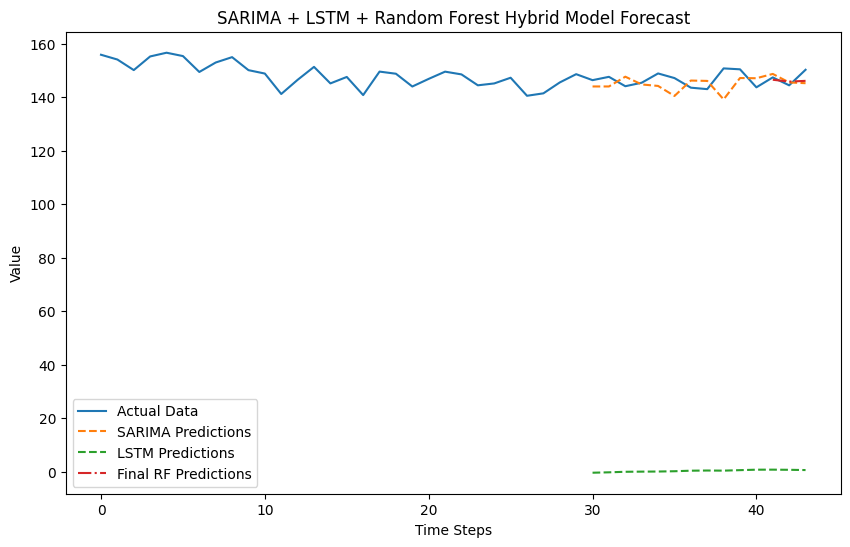

In [23]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt



# Merge the datasets with suffixes to avoid column name conflicts
data = ds1.merge(ds2, on='yyyy', suffixes=('_ds1', '_ds2')) \
          .merge(ds3, on='yyyy', suffixes=('', '_ds3')) \
          .merge(ds4, on='yyyy', suffixes=('', '_ds4'))

# Drop the "yyyy" column and select the target variable (for this example, "All Regions_ds1")
target = data['All Regions_ds1'].values

# 2. Fit a SARIMA Model
sarima_order = (1, 1, 1)
seasonal_order = (0, 1, 1, 12)  # Example orders; should be tuned
sarima_model = SARIMAX(target, order=sarima_order, seasonal_order=seasonal_order)
sarima_results = sarima_model.fit(disp=False)

# SARIMA predictions and residuals
sarima_predictions = sarima_results.predict(start=0, end=len(target)-1)
residuals = target - sarima_predictions

# 3. Train an LSTM on the residuals
scaler = MinMaxScaler(feature_range=(0, 1))
residuals_scaled = scaler.fit_transform(residuals.reshape(-1, 1))

def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

sequence_length = 30  # Choose an appropriate sequence length
X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)

# Reshape for LSTM input (samples, time steps, features)
X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

# Build and train the LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(50, return_sequences=False))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(1))

lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_lstm, y_lstm, test_size=0.2, random_state=42)

# Train the LSTM model
lstm_model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val), verbose=1)

# LSTM predictions (on the entire dataset)
lstm_predictions = lstm_model.predict(X_lstm)
lstm_predictions_rescaled = scaler.inverse_transform(lstm_predictions)

# 4. Train a Random Forest model using the original features, SARIMA predictions, and LSTM predictions
combined_features = np.column_stack((data.iloc[sequence_length:].drop(columns=['yyyy']).values,
                                     sarima_predictions[sequence_length:],
                                     lstm_predictions_rescaled.flatten()))

# Train-test split for Random Forest
X_rf_train, X_rf_test, y_rf_train, y_rf_test = train_test_split(combined_features, target[sequence_length:], test_size=0.2, random_state=42)

# Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_rf_train, y_rf_train)

# Make final predictions with the Random Forest model
rf_predictions = rf_model.predict(X_rf_test)

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(range(len(target)), target, label='Actual Data')
plt.plot(range(sequence_length, len(sarima_predictions)), sarima_predictions[sequence_length:], label='SARIMA Predictions', linestyle='--')
plt.plot(range(sequence_length, len(lstm_predictions_rescaled) + sequence_length), lstm_predictions_rescaled, label='LSTM Predictions', linestyle='--')
plt.plot(range(sequence_length + len(y_rf_train), len(target)), rf_predictions, label='Final RF Predictions', linestyle='-.')
plt.legend()
plt.title('SARIMA + LSTM + Random Forest Hybrid Model Forecast')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.show()


/home/jovyan/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.



Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 0.0983 - val_loss: 0.0696
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0657 - val_loss: 0.0466
Epoch 3/100
1/1 [==============================] - 0s 21ms/step - loss: 0.0483 - val_loss: 0.0269
Epoch 4/100
1/1 [==============================] - 0s 22ms/step - loss: 0.0247 - val_loss: 0.0115
Epoch 5/100
1/1 [==============================] - 0s 21ms/step - loss: 0.0146 - val_loss: 0.0019
Epoch 6/100
1/1 [==============================] - 0s 22ms/step - loss: 0.0019 - val_loss: 7.3108e-04
Epoch 7/100
1/1 [==============================] - 0s 21ms/step - loss: 0.0024 - val_loss: 0.0067
Epoch 8/100
1/1 [==============================] - 0s 21ms/step - loss: 0.0111 - val_loss: 0.0109
Epoch 9/100
1/1 [==============================] - 0s 20ms/step - loss: 0.0151 - val_loss: 0.0098
Epoch 10/100
1/1 [==============================] - 0s 20ms/step - loss: 0.0134 - val_loss: 0.0060
Epoch 11/100
1/1 

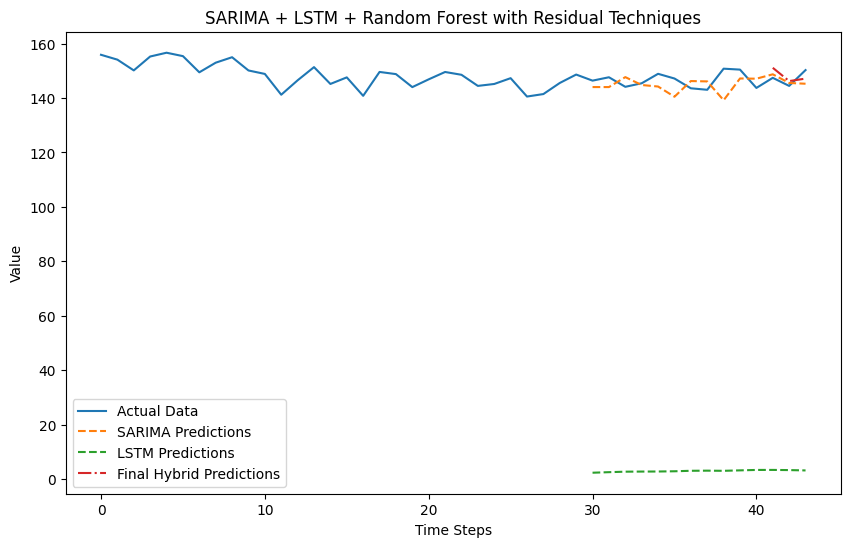

In [24]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


# Merge the datasets with suffixes to avoid column name conflicts
data = ds1.merge(ds2, on='yyyy', suffixes=('_ds1', '_ds2')) \
          .merge(ds3, on='yyyy', suffixes=('', '_ds3')) \
          .merge(ds4, on='yyyy', suffixes=('', '_ds4'))

# Drop the "yyyy" column and select the target variable (for this example, "All Regions_ds1")
target = data['All Regions_ds1'].values

# Step 1: Fit SARIMA model
sarima_order = (1, 1, 1)
seasonal_order = (0, 1, 1, 12)  # Example orders; should be tuned
sarima_model = SARIMAX(target, order=sarima_order, seasonal_order=seasonal_order)
sarima_results = sarima_model.fit(disp=False)

# SARIMA predictions and residuals
sarima_predictions = sarima_results.predict(start=0, end=len(target)-1)
residuals_sarima = target - sarima_predictions

# Step 2: Train LSTM on SARIMA residuals
scaler = MinMaxScaler(feature_range=(0, 1))
residuals_scaled = scaler.fit_transform(residuals_sarima.reshape(-1, 1))

def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

sequence_length = 30  # Choose an appropriate sequence length
X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)

# Reshape for LSTM input (samples, time steps, features)
X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

# Build and train the LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(50, return_sequences=False))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(1))

lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_lstm, y_lstm, test_size=0.2, random_state=42)

# Train the LSTM model
lstm_model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val), verbose=1)

# LSTM predictions (on the entire dataset)
lstm_predictions = lstm_model.predict(X_lstm)
lstm_predictions_rescaled = scaler.inverse_transform(lstm_predictions)

# Step 3: Compute residuals from the LSTM model
residuals_lstm = residuals_sarima[sequence_length:] - lstm_predictions_rescaled.flatten()

# Step 4: Train Random Forest on the LSTM residuals
combined_features = np.column_stack((data.iloc[sequence_length:].drop(columns=['yyyy']).values,
                                     sarima_predictions[sequence_length:],
                                     lstm_predictions_rescaled.flatten()))

# Train-test split for Random Forest
X_rf_train, X_rf_test, y_rf_train, y_rf_test = train_test_split(combined_features, residuals_lstm, test_size=0.2, random_state=42)

# Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_rf_train, y_rf_train)

# Make final predictions with the Random Forest model
rf_predictions = rf_model.predict(X_rf_test)

# Add the final residual predictions back to the SARIMA + LSTM predictions
final_predictions = sarima_predictions[sequence_length + len(y_rf_train):] + lstm_predictions_rescaled[len(y_rf_train):].flatten() + rf_predictions

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(range(len(target)), target, label='Actual Data')
plt.plot(range(sequence_length, len(sarima_predictions)), sarima_predictions[sequence_length:], label='SARIMA Predictions', linestyle='--')
plt.plot(range(sequence_length, len(lstm_predictions_rescaled) + sequence_length), lstm_predictions_rescaled, label='LSTM Predictions', linestyle='--')
plt.plot(range(sequence_length + len(y_rf_train), len(target)), final_predictions, label='Final Hybrid Predictions', linestyle='-.')
plt.legend()
plt.title('SARIMA + LSTM + Random Forest with Residual Techniques')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.show()


/home/jovyan/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.



Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.2142 - val_loss: 0.2566
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1657 - val_loss: 0.2176
Epoch 3/100
1/1 [==============================] - 0s 26ms/step - loss: 0.1503 - val_loss: 0.1827
Epoch 4/100
1/1 [==============================] - 0s 23ms/step - loss: 0.1140 - val_loss: 0.1507
Epoch 5/100
1/1 [==============================] - 0s 21ms/step - loss: 0.0915 - val_loss: 0.1206
Epoch 6/100
1/1 [==============================] - 0s 22ms/step - loss: 0.0667 - val_loss: 0.0923
Epoch 7/100
1/1 [==============================] - 0s 23ms/step - loss: 0.0556 - val_loss: 0.0661
Epoch 8/100
1/1 [==============================] - 0s 23ms/step - loss: 0.0440 - val_loss: 0.0431
Epoch 9/100
1/1 [==============================] - 0s 21ms/step - loss: 0.0332 - val_loss: 0.0264
Epoch 10/100
1/1 [==============================] - 0s 24ms/step - loss: 0.0238 - val_loss: 0.0180
Epoch 11/100
1/1 [===

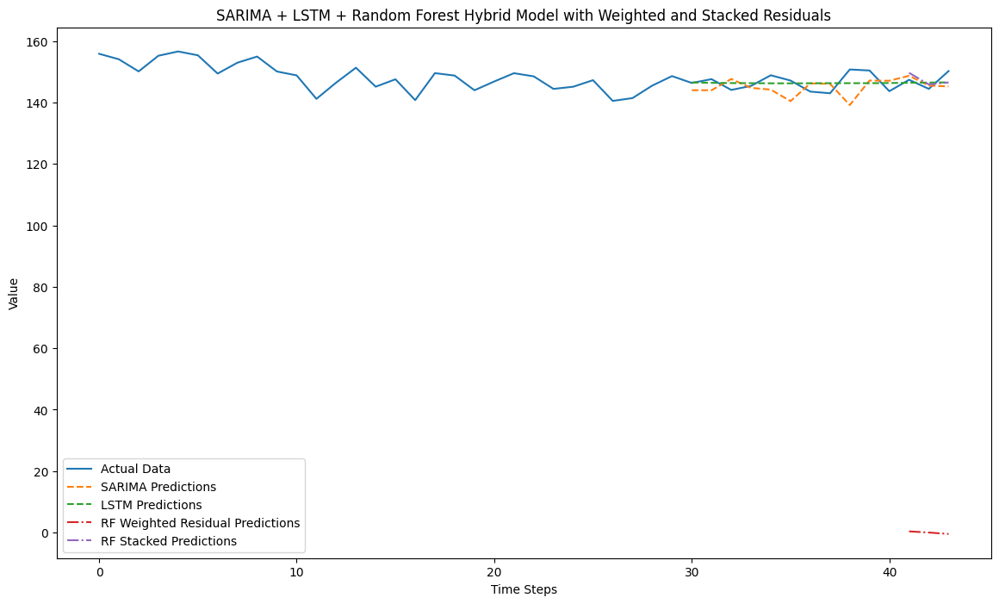

In [25]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error


# Merge the datasets with suffixes to avoid column name conflicts
data = ds1.merge(ds2, on='yyyy', suffixes=('_ds1', '_ds2')) \
          .merge(ds3, on='yyyy', suffixes=('', '_ds3')) \
          .merge(ds4, on='yyyy', suffixes=('', '_ds4'))

# Drop the "yyyy" column and select the target variable (for this example, "All Regions_ds1")
target = data['All Regions_ds1'].values

# Step 1: Fit a SARIMA model
sarima_order = (1, 1, 1)
seasonal_order = (0, 1, 1, 12)  # Example orders; should be tuned
sarima_model = SARIMAX(target, order=sarima_order, seasonal_order=seasonal_order)
sarima_results = sarima_model.fit(disp=False)

# SARIMA predictions and residuals
sarima_predictions = sarima_results.predict(start=0, end=len(target)-1)
residuals_sarima = target - sarima_predictions

# Step 2: Train LSTM on the original data
scaler = MinMaxScaler(feature_range=(0, 1))
data_scaled = scaler.fit_transform(target.reshape(-1, 1))

def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

sequence_length = 30  # Choose an appropriate sequence length
X_lstm, y_lstm = create_sequences(data_scaled, sequence_length)

# Reshape for LSTM input (samples, time steps, features)
X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

# Build and train the LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(50, return_sequences=False))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(1))

lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_lstm, y_lstm, test_size=0.2, random_state=42)

# Train the LSTM model
lstm_model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val), verbose=1)

# LSTM predictions (on the entire dataset)
lstm_predictions = lstm_model.predict(X_lstm)
lstm_predictions_rescaled = scaler.inverse_transform(lstm_predictions)

# Step 3: Compute residuals from the LSTM predictions
residuals_lstm = target[sequence_length:] - lstm_predictions_rescaled.flatten()

# Step 4A: Weighted Average Residuals
# Calculate MAE for SARIMA and LSTM
mae_sarima = mean_absolute_error(target[sequence_length:], sarima_predictions[sequence_length:])
mae_lstm = mean_absolute_error(target[sequence_length:], lstm_predictions_rescaled.flatten())

# Calculate weights based on inverse MAE
weight_sarima = 1 / mae_sarima
weight_lstm = 1 / mae_lstm
total_weight = weight_sarima + weight_lstm

# Normalize weights
weight_sarima /= total_weight
weight_lstm /= total_weight

# Compute weighted average of residuals
weighted_residuals = weight_sarima * residuals_sarima[sequence_length:] + weight_lstm * residuals_lstm

# Step 4B: Stacking Approach
# Use SARIMA and LSTM residuals as separate features
stacked_features = np.column_stack((residuals_sarima[sequence_length:], residuals_lstm))

# Step 5: Train Random Forest using both approaches (weighted residuals and stacked features)
# Random Forest for Weighted Residuals
X_rf_train, X_rf_test, y_rf_train, y_rf_test = train_test_split(data.iloc[sequence_length:].drop(columns=['yyyy']).values,
                                                                weighted_residuals, test_size=0.2, random_state=42)
rf_model_weighted = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_weighted.fit(X_rf_train, y_rf_train)
rf_weighted_predictions = rf_model_weighted.predict(X_rf_test)

# Random Forest for Stacked Features
X_rf_train_stack, X_rf_test_stack, y_rf_train_stack, y_rf_test_stack = train_test_split(stacked_features,
                                                                                        target[sequence_length:], test_size=0.2, random_state=42)
rf_model_stacked = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_stacked.fit(X_rf_train_stack, y_rf_train_stack)
rf_stacked_predictions = rf_model_stacked.predict(X_rf_test_stack)

# Plotting the results
plt.figure(figsize=(14, 8))
plt.plot(range(len(target)), target, label='Actual Data')
plt.plot(range(sequence_length, len(sarima_predictions)), sarima_predictions[sequence_length:], label='SARIMA Predictions', linestyle='--')
plt.plot(range(sequence_length, len(lstm_predictions_rescaled) + sequence_length), lstm_predictions_rescaled, label='LSTM Predictions', linestyle='--')
plt.plot(range(sequence_length + len(y_rf_train), len(target)), rf_weighted_predictions, label='RF Weighted Residual Predictions', linestyle='-.')
plt.plot(range(sequence_length + len(y_rf_train_stack), len(target)), rf_stacked_predictions, label='RF Stacked Predictions', linestyle='-.')
plt.legend()
plt.title('SARIMA + LSTM + Random Forest Hybrid Model with Weighted and Stacked Residuals')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.show()


/home/jovyan/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.



Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 0.0780 - val_loss: 0.0510
Epoch 2/100
1/1 [==============================] - 0s 22ms/step - loss: 0.0501 - val_loss: 0.0295
Epoch 3/100
1/1 [==============================] - 0s 21ms/step - loss: 0.0318 - val_loss: 0.0123
Epoch 4/100
1/1 [==============================] - 0s 22ms/step - loss: 0.0173 - val_loss: 0.0018
Epoch 5/100
1/1 [==============================] - 0s 21ms/step - loss: 0.0044 - val_loss: 0.0013
Epoch 6/100
1/1 [==============================] - 0s 21ms/step - loss: 0.0048 - val_loss: 0.0079
Epoch 7/100
1/1 [==============================] - 0s 23ms/step - loss: 0.0114 - val_loss: 0.0108
Epoch 8/100
1/1 [==============================] - 0s 22ms/step - loss: 0.0094 - val_loss: 0.0091
Epoch 9/100
1/1 [==============================] - 0s 22ms/step - loss: 0.0129 - val_loss: 0.0050
Epoch 10/100
1/1 [==============================] - 0s 23ms/step - loss: 0.0075 - val_loss: 0.0016
Epoch 11/100
1/1 [===

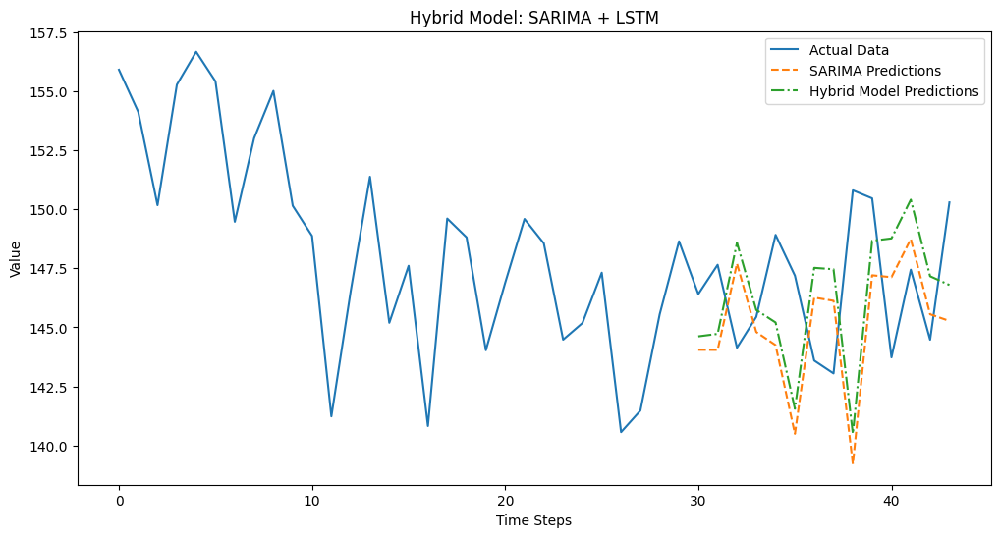

In [26]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

# Step 1: Fit a SARIMA model
sarima_order = (1, 1, 1)
seasonal_order = (0, 1, 1, 12)  # Example orders; adjust based on the data
sarima_model = SARIMAX(target, order=sarima_order, seasonal_order=seasonal_order)
sarima_results = sarima_model.fit(disp=False)

# SARIMA predictions
sarima_predictions = sarima_results.predict(start=0, end=len(target)-1)
residuals = target - sarima_predictions

# Step 2: Scale the residuals for LSTM training
scaler = MinMaxScaler(feature_range=(0, 1))
residuals_scaled = scaler.fit_transform(residuals.reshape(-1, 1))

def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

sequence_length = 30  # You can adjust this
X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)

# Reshape for LSTM input
X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

# Step 3: Build and train the LSTM model on residuals
lstm_model = Sequential()
lstm_model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(50, return_sequences=False))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(1))

lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# Train-test split for LSTM
X_train, X_val, y_train, y_val = train_test_split(X_lstm, y_lstm, test_size=0.2, random_state=42)

# Train the LSTM model
history = lstm_model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val), verbose=1)

# LSTM predictions on residuals
lstm_residual_predictions = lstm_model.predict(X_lstm)
lstm_residual_predictions_rescaled = scaler.inverse_transform(lstm_residual_predictions)

# Step 4: Combine SARIMA and LSTM predictions
final_predictions = sarima_predictions[sequence_length:] + lstm_residual_predictions_rescaled.flatten()

# Plotting the results
plt.figure(figsize=(12, 6))
plt.plot(target, label='Actual Data')
plt.plot(range(sequence_length, len(sarima_predictions)), sarima_predictions[sequence_length:], label='SARIMA Predictions', linestyle='--')
plt.plot(range(sequence_length, len(final_predictions) + sequence_length), final_predictions, label='Hybrid Model Predictions', linestyle='-.')
plt.legend()
plt.title('Hybrid Model: SARIMA + LSTM')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.show()


Columns in the merged dataset:
Index(['yyyy', 'Sea of Okhotsk_x', 'Bering Sea_x', 'Hudson Bay_x',
       'Baffin Bay_x', 'Greenland Sea_x', 'Barent Sea', 'Kara Sea_x',
       'Laptev Sea_x', 'East Siberian Sea_x', 'Chukchi Sea_x',
       'Beaufort Sea_x', 'Canadian Archipelago_x', ' Central Arctic',
       'All Regions_x', 'Sea of Okhotsk_y', 'Bering Sea_y', 'Hudson Bay_y',
       'Baffin Bay_y', 'Greenland Sea_y', 'Barents Sea', 'Kara Sea_y',
       'Laptev Sea_y', 'East Siberian Sea_y', 'Chukchi Sea_y',
       'Beaufort Sea_y', 'Canadian Archipelago_y', 'Central Arctic',
       'All Regions_y'],
      dtype='object')
Best SARIMA Parameters: (0, 1, 1, 0, 0, 0)
Best AIC: 225.21843534031404
Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.0015 - val_loss: 6.2153e-04
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 5.3351e-04 - val_loss: 5.4266e-05
Epoch 3/100
1/1 [==============================] - 0s 20ms/step - loss: 1.5613e-04 - val_loss: 

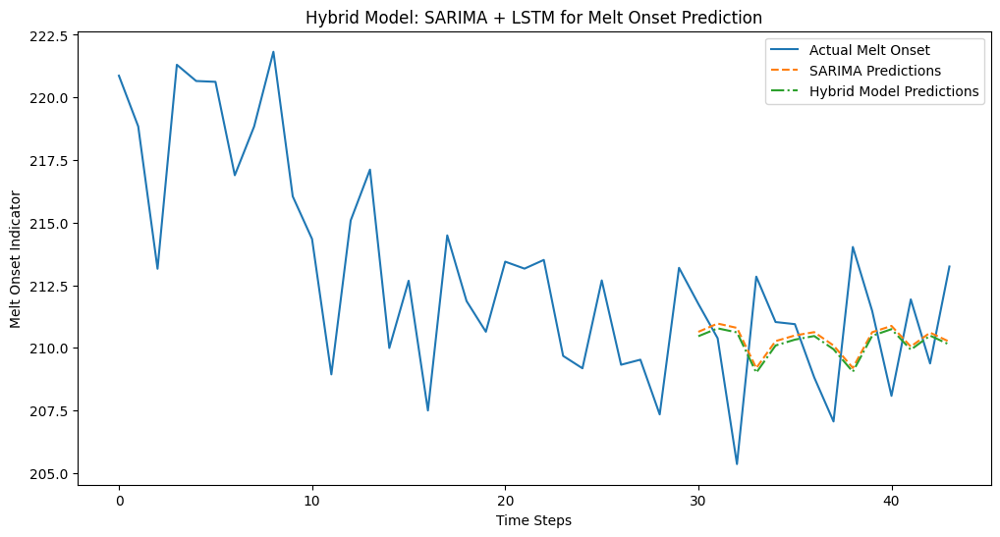

In [27]:
import numpy as np
import pandas as pd
import itertools
import warnings
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Suppress warnings to keep the output clean
warnings.filterwarnings("ignore")

# Step 2: Merge the datasets based on a common column (e.g., 'yyyy' for the year)
# Assuming 'yyyy' is the common column in both datasets
data = ds1.merge(ds2, on='yyyy')

# Step 3: Aggregate data from relevant regions to create a time series
# Print the column names of the merged dataset to identify the region-based columns
print("Columns in the merged dataset:")
print(data.columns)
# Update this list with the correct region-based column names based on the printed output
regions = list(data.columns)  # Replace with actual column names

# Aggregate data from the relevant regions to create a time series
data['Melt_Onset'] = data[regions].mean(axis=1)


# Calculate the mean across these regions
data['Melt_Onset'] = data[regions].mean(axis=1)

# Extract the target time series for melt onset prediction
target = data['Melt_Onset'].values

# Step 4: Grid Search for SARIMA Hyperparameter Tuning
p = d = q = range(0, 2)  # Non-seasonal parameters
P = D = Q = range(0, 1)  # Seasonal parameters
m = 12  # Assuming yearly seasonality

# Generate all combinations of p, d, q and P, D, Q
parameter_combinations = list(itertools.product(p, d, q, P, D, Q))

# Track the best model
best_aic = float("inf")
best_params = None
best_model = None

# Perform grid search
for params in parameter_combinations:
    try:
        # Fit SARIMA model
        sarima_model = SARIMAX(target,
                               order=(params[0], params[1], params[2]),
                               seasonal_order=(params[3], params[4], params[5], m))
        sarima_results = sarima_model.fit(disp=False)

        # Check if current model is better (lower AIC)
        if sarima_results.aic < best_aic:
            best_aic = sarima_results.aic
            best_params = params
            best_model = sarima_results
    except Exception as e:
        continue  # Skip combinations that fail

# Display the best parameters and corresponding AIC
print(f"Best SARIMA Parameters: {best_params}")
print(f"Best AIC: {best_aic}")

# Step 5: Fit the Best SARIMA Model
best_sarima_model = SARIMAX(target,
                            order=(best_params[0], best_params[1], best_params[2]),
                            seasonal_order=(best_params[3], best_params[4], best_params[5], m))
best_sarima_results = best_sarima_model.fit(disp=False)

# SARIMA predictions
sarima_predictions = best_sarima_results.predict(start=0, end=len(target)-1)
residuals = target - sarima_predictions

# Step 6: Train the LSTM Model on the Residuals
scaler = MinMaxScaler(feature_range=(0, 1))
residuals_scaled = scaler.fit_transform(residuals.reshape(-1, 1))

def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

sequence_length = 30  # Adjust this based on your data
X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)

# Reshape for LSTM input
X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

# Build and train the LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(50, return_sequences=False))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(1))

lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# Train-test split for LSTM
X_train, X_val, y_train, y_val = train_test_split(X_lstm, y_lstm, test_size=0.2, random_state=42)

# Train the LSTM model
history = lstm_model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val), verbose=1)

# LSTM predictions on residuals
lstm_residual_predictions = lstm_model.predict(X_lstm)
lstm_residual_predictions_rescaled = scaler.inverse_transform(lstm_residual_predictions)

# Step 7: Combine SARIMA and LSTM predictions for final prediction
final_predictions = sarima_predictions[sequence_length:] + lstm_residual_predictions_rescaled.flatten()

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(target, label='Actual Melt Onset')
plt.plot(range(sequence_length, len(sarima_predictions)), sarima_predictions[sequence_length:], label='SARIMA Predictions', linestyle='--')
plt.plot(range(sequence_length, len(final_predictions) + sequence_length), final_predictions, label='Hybrid Model Predictions', linestyle='-.')
plt.legend()
plt.title('Hybrid Model: SARIMA + LSTM for Melt Onset Prediction')
plt.xlabel('Time Steps')
plt.ylabel('Melt Onset Indicator')
plt.show()


Columns in the merged dataset:
Index(['yyyy', 'Sea of Okhotsk_x', 'Bering Sea_x', 'Hudson Bay_x',
       'Baffin Bay_x', 'Greenland Sea_x', 'Barent Sea', 'Kara Sea_x',
       'Laptev Sea_x', 'East Siberian Sea_x', 'Chukchi Sea_x',
       'Beaufort Sea_x', 'Canadian Archipelago_x', ' Central Arctic',
       'All Regions_x', 'Sea of Okhotsk_y', 'Bering Sea_y', 'Hudson Bay_y',
       'Baffin Bay_y', 'Greenland Sea_y', 'Barents Sea', 'Kara Sea_y',
       'Laptev Sea_y', 'East Siberian Sea_y', 'Chukchi Sea_y',
       'Beaufort Sea_y', 'Canadian Archipelago_y', 'Central Arctic',
       'All Regions_y'],
      dtype='object')
Best SARIMA Parameters: (0, 1, 1, 0, 0, 0)
Best AIC: 225.21843534031404
Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 0.0012 - val_loss: 3.5567e-04
Epoch 2/100
1/1 [==============================] - 0s 23ms/step - loss: 3.6011e-04 - val_loss: 3.6584e-06
Epoch 3/100
1/1 [==============================] - 0s 22ms/step - loss: 2.4178e-04 - val_loss: 

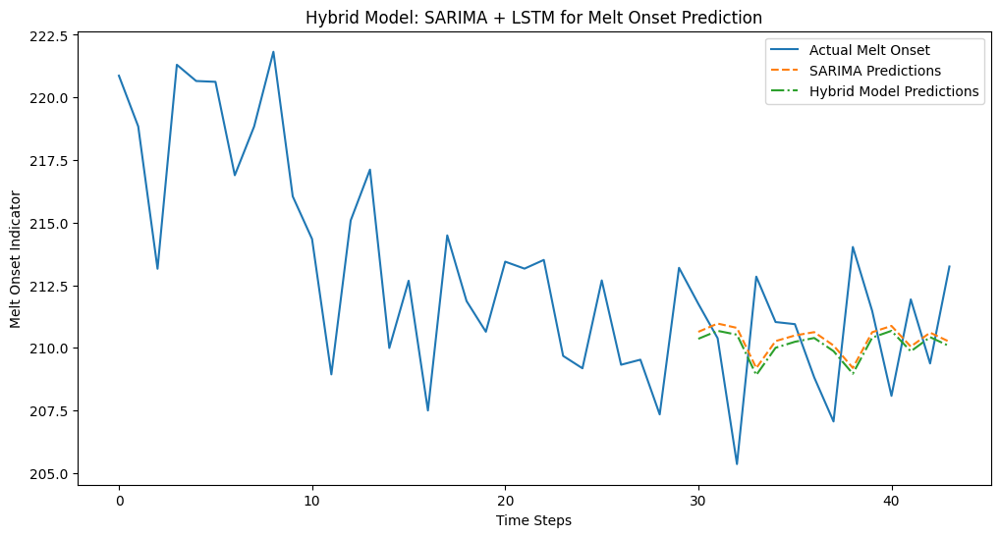

In [28]:
import numpy as np
import pandas as pd
import itertools
import warnings
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Suppress warnings to keep the output clean
warnings.filterwarnings("ignore")



# Step 2: Merge the datasets based on a common column (e.g., 'yyyy' for the year)
# Assuming 'yyyy' is the common column in both datasets
data = ds1.merge(ds2, on='yyyy')

# Step 3: Aggregate data from relevant regions to create a time series
# Print the column names of the merged dataset to identify the region-based columns
print("Columns in the merged dataset:")
print(data.columns)
# Update this list with the correct region-based column names based on the printed output
regions = list(data.columns)  # Replace with actual column names

# Aggregate data from the relevant regions to create a time series
data['Melt_Onset'] = data[regions].mean(axis=1)


# Calculate the mean across these regions
data['Melt_Onset'] = data[regions].mean(axis=1)

# Extract the target time series for melt onset prediction
target = data['Melt_Onset'].values

# Step 4: Grid Search for SARIMA Hyperparameter Tuning
p = d = q = range(0, 2)  # Non-seasonal parameters
P = D = Q = range(0, 1)  # Seasonal parameters
m = 12  # Assuming yearly seasonality

# Generate all combinations of p, d, q and P, D, Q
parameter_combinations = list(itertools.product(p, d, q, P, D, Q))

# Track the best model
best_aic = float("inf")
best_params = None
best_model = None

# Perform grid search
for params in parameter_combinations:
    try:
        # Fit SARIMA model
        sarima_model = SARIMAX(target,
                               order=(params[0], params[1], params[2]),
                               seasonal_order=(params[3], params[4], params[5], m))
        sarima_results = sarima_model.fit(disp=False)

        # Check if current model is better (lower AIC)
        if sarima_results.aic < best_aic:
            best_aic = sarima_results.aic
            best_params = params
            best_model = sarima_results
    except Exception as e:
        continue  # Skip combinations that fail

# Display the best parameters and corresponding AIC
print(f"Best SARIMA Parameters: {best_params}")
print(f"Best AIC: {best_aic}")

# Step 5: Fit the Best SARIMA Model
best_sarima_model = SARIMAX(target,
                            order=(best_params[0], best_params[1], best_params[2]),
                            seasonal_order=(best_params[3], best_params[4], best_params[5], m))
best_sarima_results = best_sarima_model.fit(disp=False)

# SARIMA predictions
sarima_predictions = best_sarima_results.predict(start=0, end=len(target)-1)
residuals = target - sarima_predictions

# Step 6: Train the LSTM Model on the Residuals
scaler = MinMaxScaler(feature_range=(0, 1))
residuals_scaled = scaler.fit_transform(residuals.reshape(-1, 1))

def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

sequence_length = 30  # Adjust this based on your data
X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)

# Reshape for LSTM input
X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

# Build and train the LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(50, return_sequences=False))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(1))

lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# Train-test split for LSTM
X_train, X_val, y_train, y_val = train_test_split(X_lstm, y_lstm, test_size=0.2, random_state=42)

# Train the LSTM model
history = lstm_model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val), verbose=1)

# LSTM predictions on residuals
lstm_residual_predictions = lstm_model.predict(X_lstm)
lstm_residual_predictions_rescaled = scaler.inverse_transform(lstm_residual_predictions)

# Step 7: Combine SARIMA and LSTM predictions for final prediction
final_predictions = sarima_predictions[sequence_length:] + lstm_residual_predictions_rescaled.flatten()

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(target, label='Actual Melt Onset')
plt.plot(range(sequence_length, len(sarima_predictions)), sarima_predictions[sequence_length:], label='SARIMA Predictions', linestyle='--')
plt.plot(range(sequence_length, len(final_predictions) + sequence_length), final_predictions, label='Hybrid Model Predictions', linestyle='-.')
plt.legend()
plt.title('Hybrid Model: SARIMA + LSTM for Melt Onset Prediction')
plt.xlabel('Time Steps')
plt.ylabel('Melt Onset Indicator')
plt.show()



Columns in the merged dataset:
Index(['yyyy', 'Sea of Okhotsk', 'Bering Sea_x', 'Hudson Bay_x',
       'Baffin Bay_x', 'Greenland Sea_x', 'Barents Sea', 'Kara Sea_x',
       'Laptev Sea_x', 'East Siberian Sea_x', 'Chukchi Sea_x',
       'Beaufort Sea_x', 'Canadian Archipelago_x', 'Central Arctic_x',
       'All Regions_x', 'Sea of Oktosk ', 'Bering Sea_y', 'Hudson Bay_y',
       'Baffin Bay_y', 'Greenland Sea_y', 'Barent Sea', 'Kara Sea_y',
       'Laptev Sea_y', 'East Siberian Sea_y', 'Chukchi Sea_y',
       'Beaufort Sea_y', 'Canadian Archipelago_y', 'Central Arctic_y',
       'All Regions_y'],
      dtype='object')
Best SARIMA Parameters: (0, 1, 1, 0, 0, 0)
Best AIC: 263.6769065173724
Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 0.0011 - val_loss: 4.5561e-04
Epoch 2/100
1/1 [==============================] - 0s 27ms/step - loss: 5.3055e-04 - val_loss: 1.1276e-04
Epoch 3/100
1/1 [==============================] - 0s 23ms/step - loss: 2.2380e-04 - val_loss: 2.

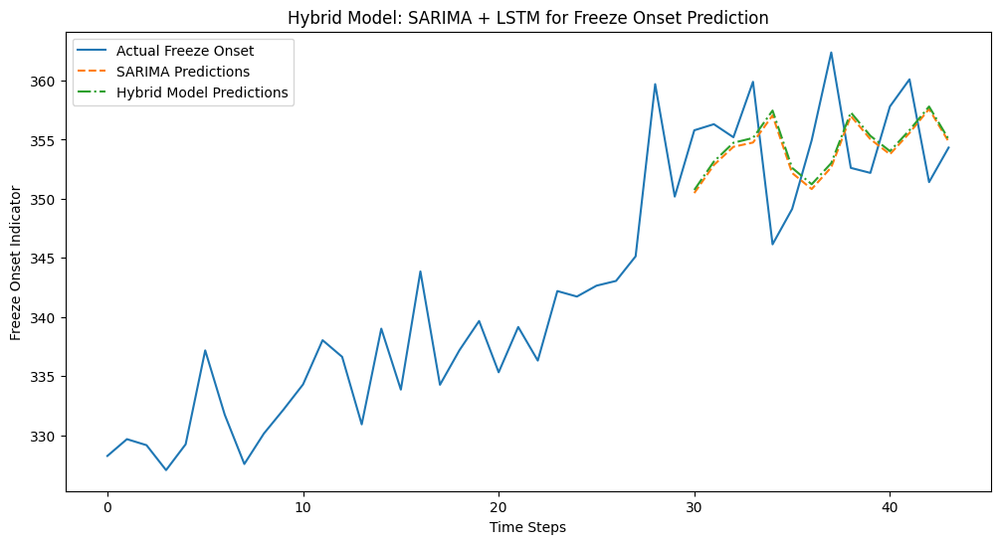

In [29]:
import numpy as np
import pandas as pd
import itertools
import warnings
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Suppress warnings to keep the output clean
warnings.filterwarnings("ignore")

# Step 2: Merge the datasets based on a common column (e.g., 'yyyy' for the year)
# Assuming 'yyyy' is the common column in both datasets
data = ds3.merge(ds4, on='yyyy')

# Step 3: Aggregate data from relevant regions to create a time series for freeze onset
print("Columns in the merged dataset:")
print(data.columns)
# Update this list with the correct region-based column names based on the printed output
regions = list(data.columns)  # Replace with actual column names

# Calculate the mean across these regions
data['Freeze_Onset'] = data[regions].mean(axis=1)

# Extract the target time series for freeze onset prediction
target = data['Freeze_Onset'].values

# Step 4: Grid Search for SARIMA Hyperparameter Tuning
p = d = q = range(0, 2)  # Non-seasonal parameters
P = D = Q = range(0, 1)  # Seasonal parameters
m = 12  # Assuming yearly seasonality

# Generate all combinations of p, d, q and P, D, Q
parameter_combinations = list(itertools.product(p, d, q, P, D, Q))

# Track the best model
best_aic = float("inf")
best_params = None
best_model = None

# Perform grid search
for params in parameter_combinations:
    try:
        # Fit SARIMA model
        sarima_model = SARIMAX(target,
                               order=(params[0], params[1], params[2]),
                               seasonal_order=(params[3], params[4], params[5], m))
        sarima_results = sarima_model.fit(disp=False)

        # Check if current model is better (lower AIC)
        if sarima_results.aic < best_aic:
            best_aic = sarima_results.aic
            best_params = params
            best_model = sarima_results
    except Exception as e:
        continue  # Skip combinations that fail

# Display the best parameters and corresponding AIC
print(f"Best SARIMA Parameters: {best_params}")
print(f"Best AIC: {best_aic}")

# Step 5: Fit the Best SARIMA Model
best_sarima_model = SARIMAX(target,
                            order=(best_params[0], best_params[1], best_params[2]),
                            seasonal_order=(best_params[3], best_params[4], best_params[5], m))
best_sarima_results = best_sarima_model.fit(disp=False)

# SARIMA predictions
sarima_predictions = best_sarima_results.predict(start=0, end=len(target)-1)
residuals = target - sarima_predictions

# Step 6: Train the LSTM Model on the Residuals
scaler = MinMaxScaler(feature_range=(0, 1))
residuals_scaled = scaler.fit_transform(residuals.reshape(-1, 1))

def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

sequence_length = 30  # Adjust this based on your data
X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)

# Reshape for LSTM input
X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

# Build and train the LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(50, return_sequences=False))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(1))

lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# Train-test split for LSTM
X_train, X_val, y_train, y_val = train_test_split(X_lstm, y_lstm, test_size=0.2, random_state=42)

# Train the LSTM model
history = lstm_model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val), verbose=1)

# LSTM predictions on residuals
lstm_residual_predictions = lstm_model.predict(X_lstm)
lstm_residual_predictions_rescaled = scaler.inverse_transform(lstm_residual_predictions)

# Step 7: Combine SARIMA and LSTM predictions for final prediction
final_predictions = sarima_predictions[sequence_length:] + lstm_residual_predictions_rescaled.flatten()

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(target, label='Actual Freeze Onset')
plt.plot(range(sequence_length, len(sarima_predictions)), sarima_predictions[sequence_length:], label='SARIMA Predictions', linestyle='--')
plt.plot(range(sequence_length, len(final_predictions) + sequence_length), final_predictions, label='Hybrid Model Predictions', linestyle='-.')
plt.legend()
plt.title('Hybrid Model: SARIMA + LSTM for Freeze Onset Prediction')
plt.xlabel('Time Steps')
plt.ylabel('Freeze Onset Indicator')
plt.show()


Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1395
Epoch 2/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0961
Epoch 3/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0733
Epoch 4/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0509
Epoch 5/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0327
Epoch 6/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0154
Epoch 7/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0059
Epoch 8/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0044
Epoch 9/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0150
Epoch 10/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0161
Epoch 11/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0198
Epoch 12/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0209
Epoch 13/50
1/1 [==============================] - 0s 12ms/step

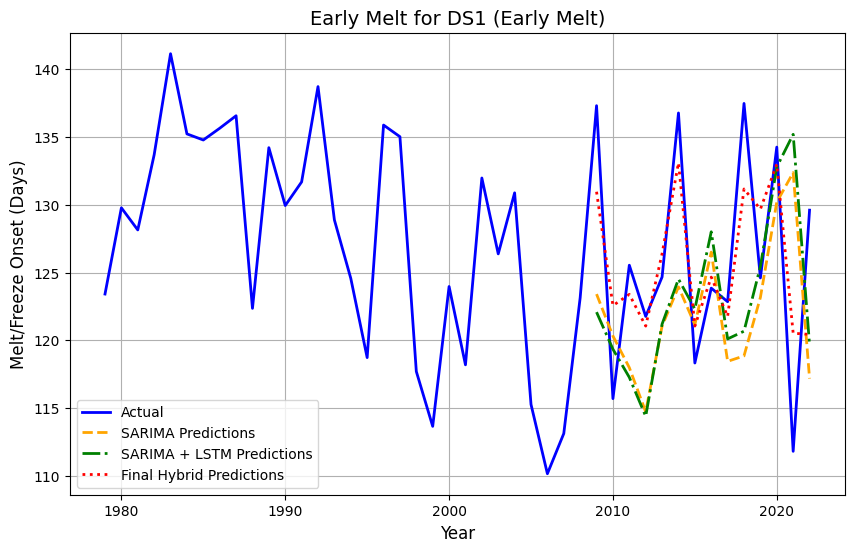

Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.0909
Epoch 2/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0661
Epoch 3/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0449
Epoch 4/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0253
Epoch 5/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0125
Epoch 6/50
1/1 [==============================] - 0s 9ms/step - loss: 0.0054
Epoch 7/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0060
Epoch 8/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0116
Epoch 9/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0148
Epoch 10/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0100
Epoch 11/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0097
Epoch 12/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0044
Epoch 13/50
1/1 [==============================] - 0s 9ms/step -

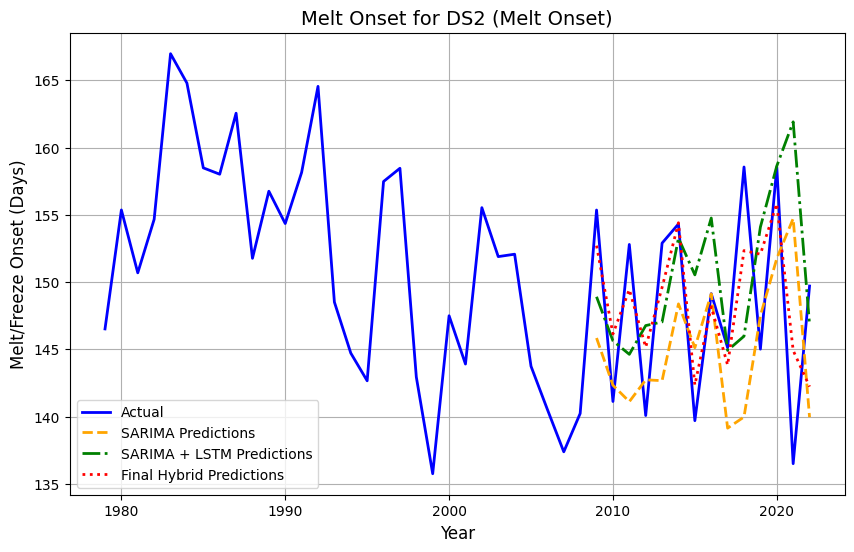

Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.0892
Epoch 2/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0599
Epoch 3/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0332
Epoch 4/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0179
Epoch 5/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0053
Epoch 6/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0033
Epoch 7/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0153
Epoch 8/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0129
Epoch 9/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0151
Epoch 10/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0120
Epoch 11/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0029
Epoch 12/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0018
Epoch 13/50
1/1 [==============================] - 0s 12ms/step

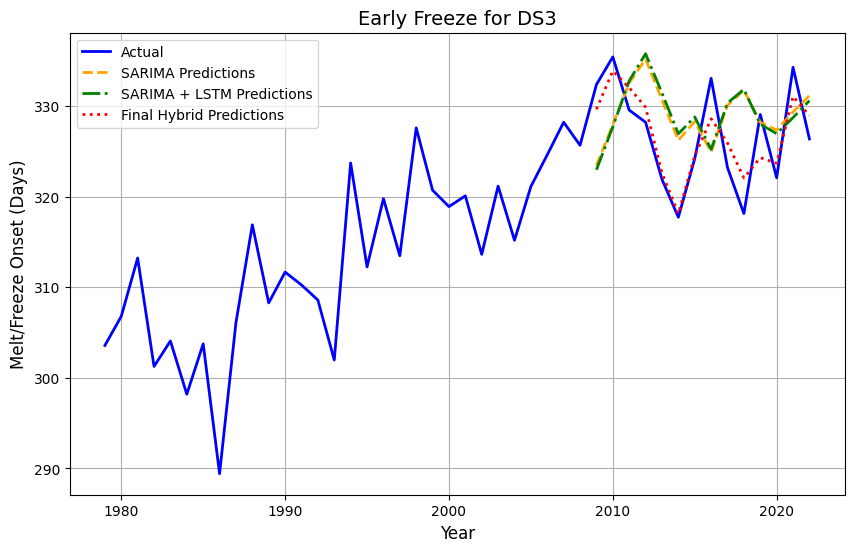

Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.0992
Epoch 2/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0739
Epoch 3/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0478
Epoch 4/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0282
Epoch 5/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0091
Epoch 6/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0021
Epoch 7/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0064
Epoch 8/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0110
Epoch 9/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0120
Epoch 10/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0121
Epoch 11/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0093
Epoch 12/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0038
Epoch 13/50
1/1 [==============================] - 0s 10ms/step

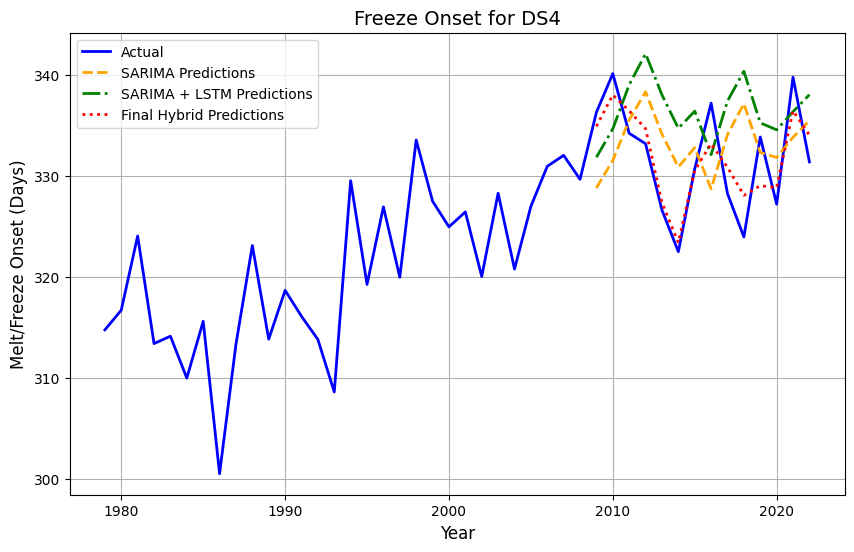

In [47]:
import matplotlib.pyplot as plt

# Function to create plots using Matplotlib
def plot_forecast_with_matplotlib(years, target, sarima_predictions, combined_predictions, final_predictions, sequence_length, title):
    plt.figure(figsize=(10, 6))

    # Plot actual data
    plt.plot(years, target, label='Actual', color='blue', linewidth=2)

    # SARIMA Predictions
    plt.plot(years[sequence_length:], sarima_predictions[sequence_length:], label='SARIMA Predictions', 
             color='orange', linestyle='--', linewidth=2)

    # Combined SARIMA + LSTM Predictions
    plt.plot(years[sequence_length:], combined_predictions, label='SARIMA + LSTM Predictions', 
             color='green', linestyle='-.', linewidth=2)

    # Final Hybrid Predictions (SARIMA + LSTM + Random Forest)
    plt.plot(years[sequence_length:], final_predictions, label='Final Hybrid Predictions', 
             color='red', linestyle=':', linewidth=2)

    # Set plot title and labels
    plt.title(title, fontsize=14)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Melt/Freeze Onset (Days)', fontsize=12)

    # Add legend
    plt.legend(loc='best')

    # Display the plot
    plt.grid(True)
    plt.show()

# Hybrid model function with error metrics and Matplotlib
def hybrid_model_with_error_metrics(file_path, region_column, title):
    # Load and preprocess data
    target, years = load_and_preprocess(file_path, region_column)

    # Step 1: Fit SARIMA model
    sarima_model = SARIMAX(target, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    sarima_results = sarima_model.fit(disp=False)

    # SARIMA predictions
    sarima_predictions = sarima_results.predict(start=0, end=len(target)-1)
    residuals = target - sarima_predictions

    # Step 2: LSTM model for residuals
    scaler = MinMaxScaler(feature_range=(0, 1))
    residuals_scaled = scaler.fit_transform(residuals.reshape(-1, 1))

    sequence_length = 30
    X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)
    X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

    # Train fine-tuned LSTM model
    lstm_model = fine_tune_lstm(X_lstm, y_lstm)

    # LSTM predictions
    lstm_residual_predictions = lstm_model.predict(X_lstm)
    lstm_residual_predictions_rescaled = scaler.inverse_transform(lstm_residual_predictions)

    # Combined SARIMA + LSTM predictions
    combined_predictions = sarima_predictions[sequence_length:] + lstm_residual_predictions_rescaled.flatten()

    # Step 3: Random Forest on residuals of combined model
    final_residuals = target[sequence_length:] - combined_predictions
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(np.arange(len(final_residuals)).reshape(-1, 1), final_residuals)
    rf_residuals = rf_model.predict(np.arange(len(final_residuals)).reshape(-1, 1))

    # Final predictions: SARIMA + LSTM + Random Forest
    final_predictions = combined_predictions + rf_residuals

    # Calculate error metrics for the final predictions
    mae, rmse, mape = calculate_error_metrics(target[sequence_length:], final_predictions)

    # Print error metrics
    print(f'Error Metrics for {title}:')
    print(f'MAE: {mae:.4f}')
    print(f'RMSE: {rmse:.4f}')
    print(f'MAPE: {mape:.2f}%')

    # Plotting results using Matplotlib
    plot_forecast_with_matplotlib(years, target, sarima_predictions, combined_predictions, final_predictions, sequence_length, title)

# Running the hybrid model with error metrics for each dataset
hybrid_model_with_error_metrics('DS1.xlsx', 'Hudson Bay', 'Early Melt for DS1 (Early Melt)')
hybrid_model_with_error_metrics('DS2.xlsx', 'Hudson Bay', 'Melt Onset for DS2 (Melt Onset)')
hybrid_model_with_error_metrics('DS3.xlsx', 'Hudson Bay', 'Early Freeze for DS3')
hybrid_model_with_error_metrics('DS4.xlsx', 'Hudson Bay', 'Freeze Onset for DS4')



Processing Early Melt Onset
Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1628
Epoch 2/50
1/1 [==============================] - 0s 11ms/step - loss: 0.1338
Epoch 3/50
1/1 [==============================] - 0s 10ms/step - loss: 0.1083
Epoch 4/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0836
Epoch 5/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0614
Epoch 6/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0434
Epoch 7/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0256
Epoch 8/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0165
Epoch 9/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0088
Epoch 10/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0030
Epoch 11/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0061
Epoch 12/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0111
Epoch 13/50
1/1 [=================

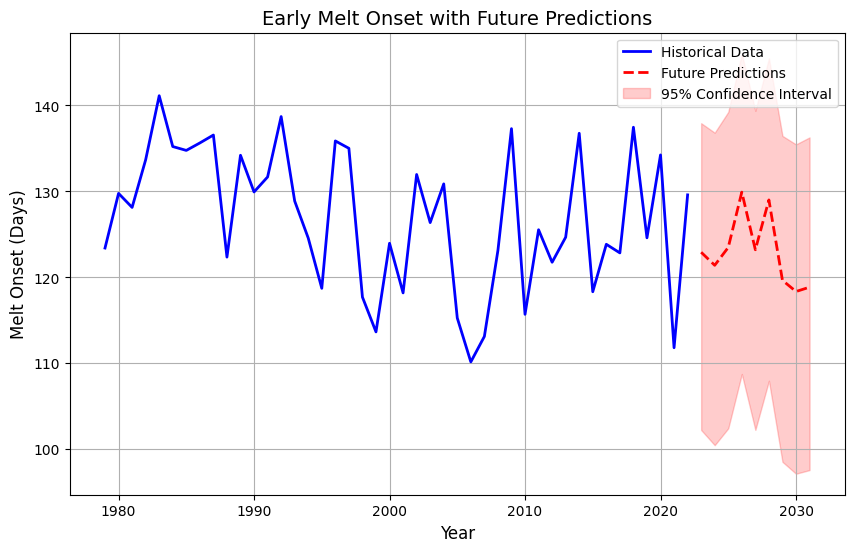


Validation Metrics for Early Melt Onset:
MAE: 8.3170
RMSE: 9.6847
MAPE: 6.41%
Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1341
Epoch 2/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0932
Epoch 3/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0725
Epoch 4/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0430
Epoch 5/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0226
Epoch 6/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0098
Epoch 7/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0052
Epoch 8/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0067
Epoch 9/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0175
Epoch 10/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0255
Epoch 11/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0207
Epoch 12/50
1/1 [==============================] - 0s 12ms/step

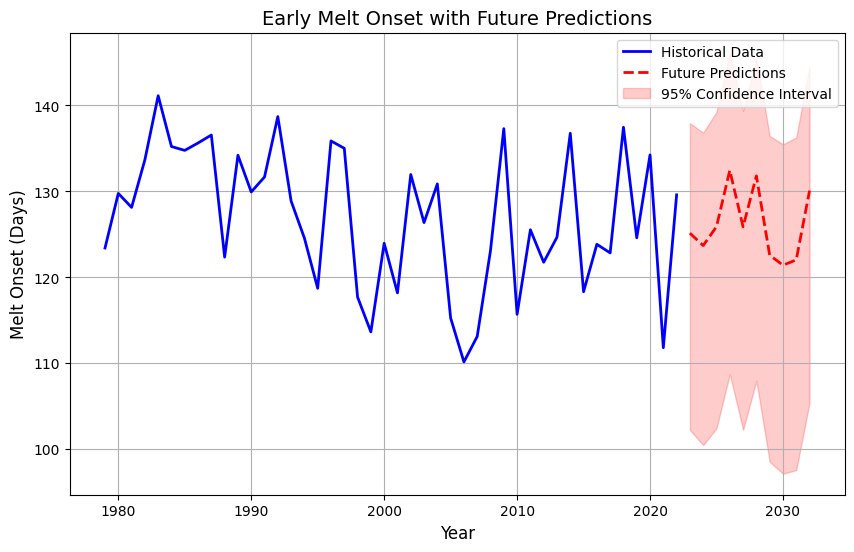


Future Predictions for Early Melt Onset:
Year 2023: 125.14 (95% CI: [102.25, 137.93])
Year 2024: 123.71 (95% CI: [100.49, 136.83])
Year 2025: 125.90 (95% CI: [102.45, 139.24])
Year 2026: 132.45 (95% CI: [108.77, 146.01])
Year 2027: 125.88 (95% CI: [102.26, 139.37])
Year 2028: 131.80 (95% CI: [107.98, 145.49])
Year 2029: 122.59 (95% CI: [98.55, 136.46])
Year 2030: 121.42 (95% CI: [97.17, 135.47])
Year 2031: 122.04 (95% CI: [97.59, 136.28])
Year 2032: 130.09 (95% CI: [105.44, 144.51])

Processing Melt Onset
Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1203
Epoch 2/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0914
Epoch 3/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0692
Epoch 4/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0473
Epoch 5/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0288
Epoch 6/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0125
Epoch 7/50
1/1 [======

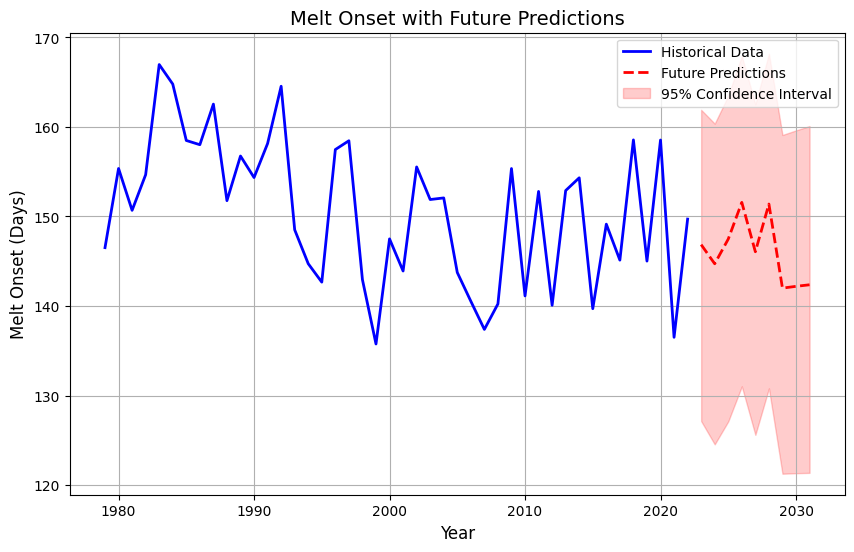


Validation Metrics for Melt Onset:
MAE: 7.6708
RMSE: 8.7050
MAPE: 5.09%
Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1122
Epoch 2/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0828
Epoch 3/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0562
Epoch 4/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0414
Epoch 5/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0220
Epoch 6/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0082
Epoch 7/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0034
Epoch 8/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0041
Epoch 9/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0164
Epoch 10/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0251
Epoch 11/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0200
Epoch 12/50
1/1 [==============================] - 0s 11ms/step - los

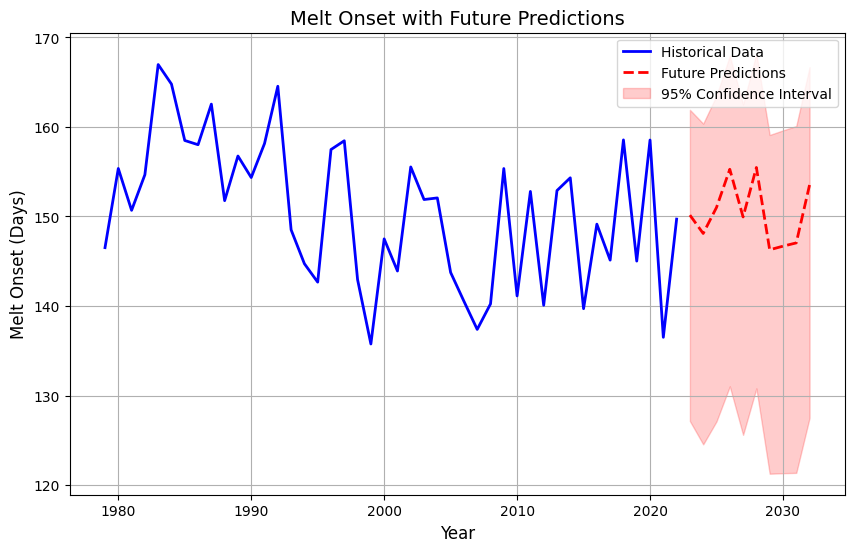


Future Predictions for Melt Onset:
Year 2023: 150.15 (95% CI: [127.14, 161.91])
Year 2024: 148.10 (95% CI: [124.54, 160.37])
Year 2025: 151.01 (95% CI: [127.11, 163.50])
Year 2026: 155.27 (95% CI: [131.02, 167.94])
Year 2027: 149.95 (95% CI: [125.60, 162.52])
Year 2028: 155.48 (95% CI: [130.80, 168.18])
Year 2029: 146.28 (95% CI: [121.26, 159.11])
Year 2030: 146.68 (95% CI: [121.32, 159.62])
Year 2031: 147.05 (95% CI: [121.36, 160.10])
Year 2032: 153.52 (95% CI: [127.50, 166.68])

Processing Early Freeze DS3
Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1361
Epoch 2/50
1/1 [==============================] - 0s 23ms/step - loss: 0.1139
Epoch 3/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0830
Epoch 4/50
1/1 [==============================] - 0s 27ms/step - loss: 0.0569
Epoch 5/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0320
Epoch 6/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0164
Epoch 7/50
1/1 [===

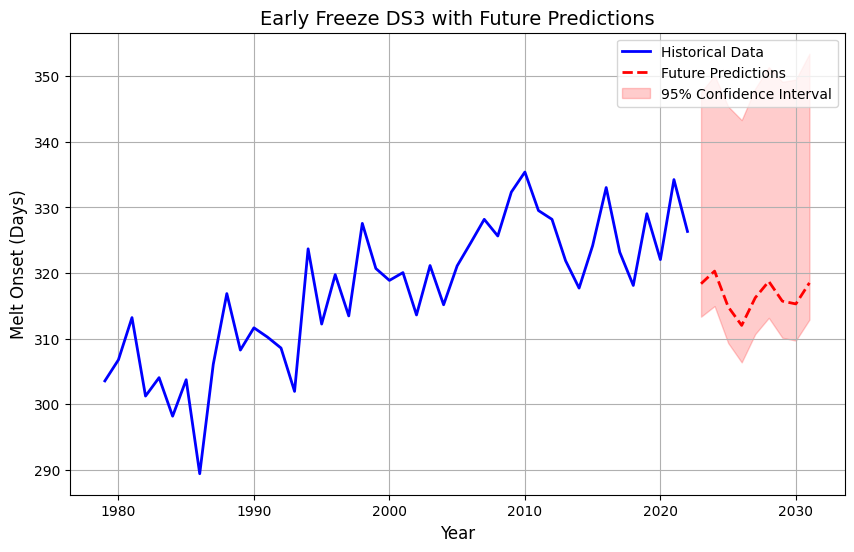


Validation Metrics for Early Freeze DS3:
MAE: 8.8001
RMSE: 10.7550
MAPE: 2.68%
Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1404
Epoch 2/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1135
Epoch 3/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0916
Epoch 4/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0702
Epoch 5/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0443
Epoch 6/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0276
Epoch 7/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0123
Epoch 8/50
1/1 [==============================] - 0s 24ms/step - loss: 0.0081
Epoch 9/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0017
Epoch 10/50
1/1 [==============================] - 0s 40ms/step - loss: 0.0042
Epoch 11/50
1/1 [==============================] - 0s 43ms/step - loss: 0.0108
Epoch 12/50
1/1 [==============================] - 0s 35ms/ste

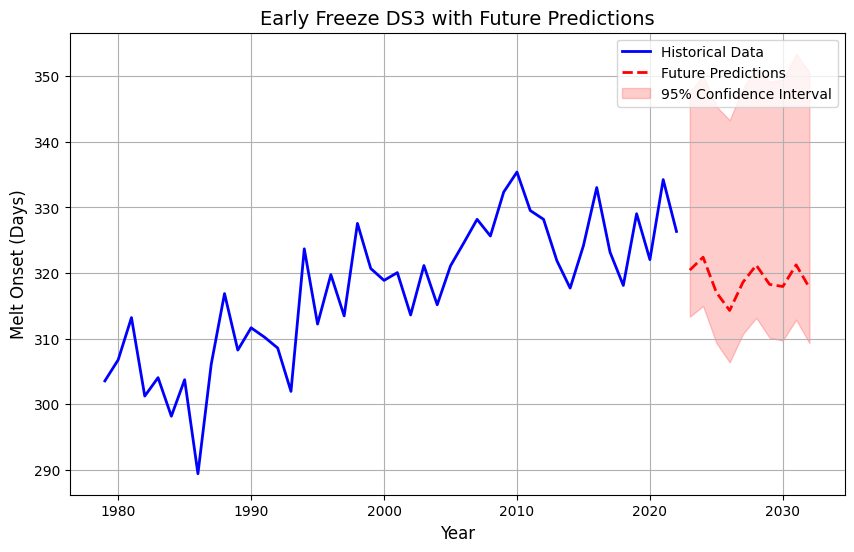


Future Predictions for Early Freeze DS3:
Year 2023: 320.46 (95% CI: [313.35, 347.57])
Year 2024: 322.42 (95% CI: [314.97, 350.13])
Year 2025: 317.05 (95% CI: [309.35, 345.40])
Year 2026: 314.30 (95% CI: [306.39, 343.32])
Year 2027: 318.61 (95% CI: [310.71, 348.13])
Year 2028: 321.20 (95% CI: [313.17, 351.40])
Year 2029: 318.28 (95% CI: [310.14, 349.16])
Year 2030: 317.95 (95% CI: [309.71, 349.49])
Year 2031: 321.25 (95% CI: [312.90, 353.44])
Year 2032: 317.77 (95% CI: [309.32, 350.60])

Processing Freeze Onset DS4
Epoch 1/50
1/1 [==============================] - 4s 4s/step - loss: 0.1046
Epoch 2/50
1/1 [==============================] - 0s 60ms/step - loss: 0.0759
Epoch 3/50
1/1 [==============================] - 0s 27ms/step - loss: 0.0564
Epoch 4/50
1/1 [==============================] - 0s 52ms/step - loss: 0.0332
Epoch 5/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0156
Epoch 6/50
1/1 [==============================] - 0s 33ms/step - loss: 0.0048
Epoch 7/50
1/

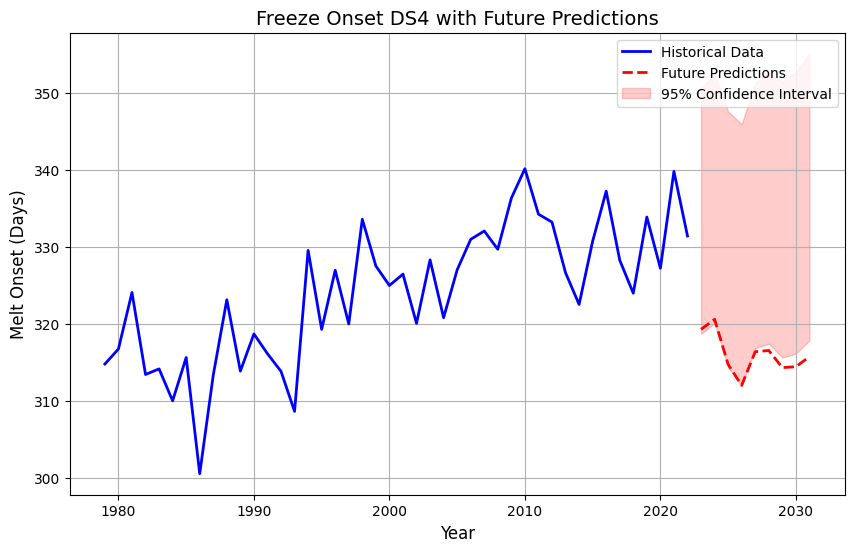


Validation Metrics for Freeze Onset DS4:
MAE: 14.5565
RMSE: 15.9779
MAPE: 4.37%
Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1183
Epoch 2/50
1/1 [==============================] - 0s 26ms/step - loss: 0.0896
Epoch 3/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0661
Epoch 4/50
1/1 [==============================] - 0s 29ms/step - loss: 0.0404
Epoch 5/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0210
Epoch 6/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0080
Epoch 7/50
1/1 [==============================] - 0s 30ms/step - loss: 0.0021
Epoch 8/50
1/1 [==============================] - 0s 36ms/step - loss: 0.0049
Epoch 9/50
1/1 [==============================] - 0s 41ms/step - loss: 0.0093
Epoch 10/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0215
Epoch 11/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0186
Epoch 12/50
1/1 [==============================] - 0s 20ms/st

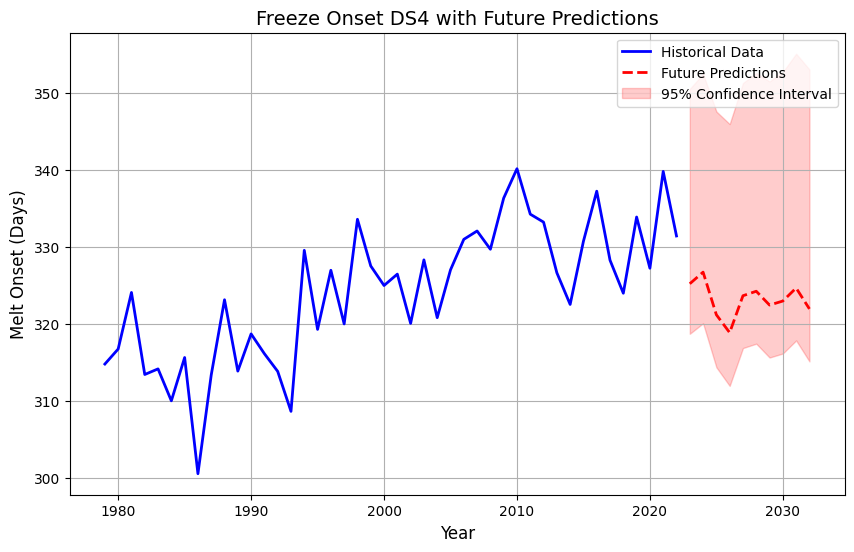


Future Predictions for Freeze Onset DS4:
Year 2023: 325.19 (95% CI: [318.69, 350.49])
Year 2024: 326.70 (95% CI: [320.06, 352.44])
Year 2025: 321.16 (95% CI: [314.34, 347.56])
Year 2026: 318.84 (95% CI: [311.92, 345.93])
Year 2027: 323.63 (95% CI: [316.84, 351.25])
Year 2028: 324.22 (95% CI: [317.41, 352.55])
Year 2029: 322.42 (95% CI: [315.61, 351.46])
Year 2030: 322.95 (95% CI: [316.13, 352.69])
Year 2031: 324.64 (95% CI: [317.82, 355.06])
Year 2032: 321.93 (95% CI: [315.10, 353.02])


In [50]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Load and preprocess data
def load_and_preprocess(file_path, region_column):
    data = pd.read_excel(file_path)
    target = data[region_column].values
    years = data['yyyy'].values
    return target, years

# Function to create sequences for LSTM model
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

# Function to fine-tune LSTM model
def fine_tune_lstm(X_lstm, y_lstm):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_lstm, y_lstm, epochs=50, batch_size=32, verbose=1)
    return model

# Function to calculate error metrics
def calculate_error_metrics(true_values, predicted_values):
    mae = np.mean(np.abs(true_values - predicted_values))
    rmse = np.sqrt(np.mean((true_values - predicted_values)**2))
    mape = np.mean(np.abs((true_values - predicted_values) / true_values)) * 100
    return mae, rmse, mape

# Function to plot results using Matplotlib
def plot_forecast_with_matplotlib(years, target, future_years, future_predictions, conf_int, title):
    plt.figure(figsize=(10, 6))

    # Plot historical data
    plt.plot(years, target, label='Historical Data', color='blue', linewidth=2)

    # Plot future predictions
    plt.plot(future_years, future_predictions, label='Future Predictions', color='red', linestyle='--', linewidth=2)

    # Plot confidence intervals
    plt.fill_between(future_years, conf_int[:, 0], conf_int[:, 1], color='red', alpha=0.2, label='95% Confidence Interval')

    # Add titles and labels
    plt.title(title, fontsize=14)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Melt Onset (Days)', fontsize=12)

    # Add a legend
    plt.legend()

    # Show the plot
    plt.grid(True)
    plt.show()

# Function to combine SARIMA, LSTM, and Random Forest models with Matplotlib plotting
def hybrid_model_with_future_predictions(file_path, region_column, title, forecast_horizon=30):
    # Load and preprocess data
    target, years = load_and_preprocess(file_path, region_column)

    # Step 1: SARIMA model
    sarima_model = SARIMAX(target, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    sarima_results = sarima_model.fit(disp=False)

    # Get SARIMA predictions for historical and future periods
    sarima_predictions = sarima_results.predict(start=0, end=len(target)-1)
    sarima_future = sarima_results.forecast(steps=forecast_horizon)

    # Calculate residuals for historical data
    residuals = target - sarima_predictions

    # Step 2: LSTM model for residuals
    scaler = MinMaxScaler(feature_range=(0, 1))
    residuals_scaled = scaler.fit_transform(residuals.reshape(-1, 1))

    sequence_length = 30
    X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)
    X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

    # Train LSTM model
    lstm_model = fine_tune_lstm(X_lstm, y_lstm)

    # Prepare last sequence for future predictions
    last_sequence = residuals_scaled[-sequence_length:]
    future_residuals = []

    # Generate future residuals using LSTM
    current_sequence = last_sequence.reshape(1, sequence_length, 1)
    for _ in range(forecast_horizon):
        next_residual = lstm_model.predict(current_sequence)
        future_residuals.append(next_residual[0, 0])
        current_sequence = np.roll(current_sequence, -1)
        current_sequence[0, -1, 0] = next_residual

    future_residuals = np.array(future_residuals).reshape(-1, 1)
    future_residuals = scaler.inverse_transform(future_residuals)

    # Step 3: Random Forest for final adjustments
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    historical_time = np.arange(len(target)).reshape(-1, 1)
    rf_model.fit(historical_time, target - sarima_predictions)

    # Generate future dates for plotting
    future_years = np.arange(years[-1] + 1, years[-1] + forecast_horizon + 1)

    # Combine predictions for future values
    future_predictions = (sarima_future +
                         future_residuals.flatten() +
                         rf_model.predict(np.arange(len(target), len(target) + forecast_horizon).reshape(-1, 1)))

    # Confidence intervals from SARIMA
    conf_int = sarima_results.get_forecast(forecast_horizon).conf_int()

    # Plotting results using Matplotlib
    plot_forecast_with_matplotlib(years, target, future_years, future_predictions, conf_int, f'{title} with Future Predictions')

    return future_predictions, future_years, conf_int

# Function to evaluate model performance on historical data
def evaluate_prediction_accuracy(file_path, region_column, title):
    target, years = load_and_preprocess(file_path, region_column)

    # Use 80% of data for training
    train_size = int(len(target) * 0.8)
    train_data = target[:train_size]
    test_data = target[train_size:]
    test_years = years[train_size:]

    # Make predictions using the hybrid model
    predictions, _, _ = hybrid_model_with_future_predictions(file_path, region_column, title, forecast_horizon=len(test_data))

    # Calculate error metrics
    mae, rmse, mape = calculate_error_metrics(test_data, predictions[:len(test_data)])

    print(f'\nValidation Metrics for {title}:')
    print(f'MAE: {mae:.4f}')
    print(f'RMSE: {rmse:.4f}')
    print(f'MAPE: {mape:.2f}%')

# Example usage
forecast_horizon = 10  # Number of years to forecast
for file_path, title in [
    ('DS1.xlsx', 'Early Melt Onset'),
    ('DS2.xlsx', 'Melt Onset'),
    ('DS3.xlsx', 'Early Freeze DS3'),
    ('DS4.xlsx', 'Freeze Onset DS4')
]:
    print(f"\nProcessing {title}")
    # Evaluate model accuracy
    evaluate_prediction_accuracy(file_path, 'Hudson Bay', title)
    # Generate future predictions
    future_predictions, future_years, confidence_intervals = hybrid_model_with_future_predictions(
        file_path, 'Hudson Bay', title, forecast_horizon)
    print(f"\nFuture Predictions for {title}:")
    for year, pred, ci_lower, ci_upper in zip(
    future_years, future_predictions,
    confidence_intervals[:, 0], confidence_intervals[:, 1]
):
      print(f"Year {year}: {pred:.2f} (95% CI: [{ci_lower:.2f}, {ci_upper:.2f}])")



Processing Early Melt Onset
Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1190
Epoch 2/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0937
Epoch 3/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0724
Epoch 4/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0473
Epoch 5/50
1/1 [==============================] - 0s 9ms/step - loss: 0.0332
Epoch 6/50
1/1 [==============================] - 0s 9ms/step - loss: 0.0170
Epoch 7/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0083
Epoch 8/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0019
Epoch 9/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0077
Epoch 10/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0188
Epoch 11/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0198
Epoch 12/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0139
Epoch 13/50
1/1 [===================

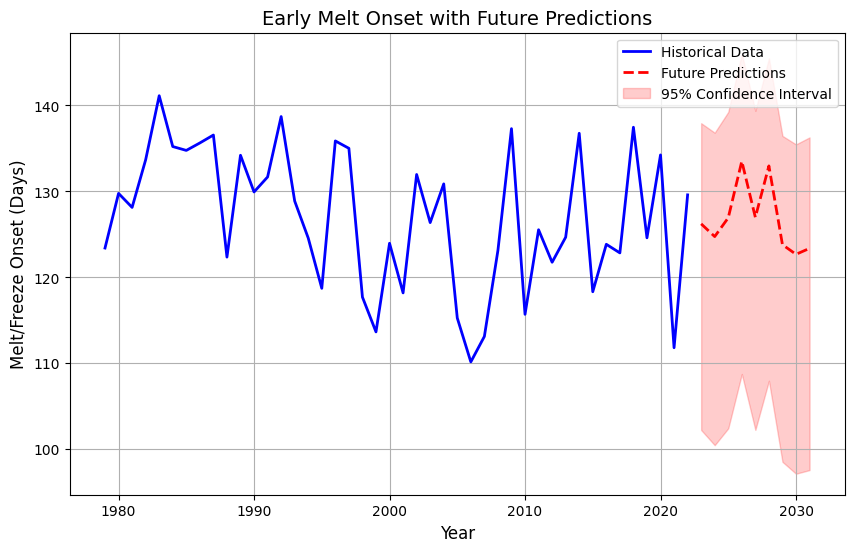


Validation Metrics for Early Melt Onset:
MAE: 8.5632
RMSE: 8.9495
MAPE: 6.77%
Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1063
Epoch 2/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0832
Epoch 3/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0600
Epoch 4/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0381
Epoch 5/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0255
Epoch 6/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0102
Epoch 7/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0060
Epoch 8/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0082
Epoch 9/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0187
Epoch 10/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0205
Epoch 11/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0145
Epoch 12/50
1/1 [==============================] - 0s 10ms/step

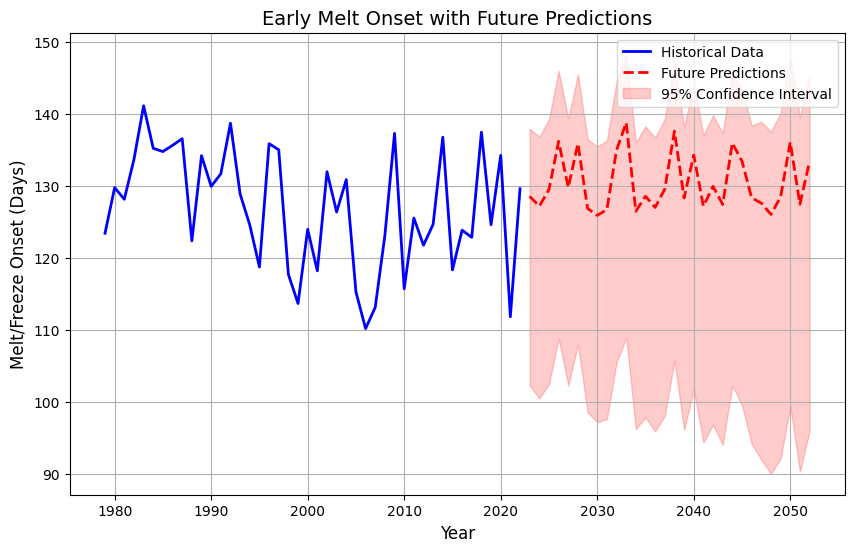


Future Predictions for Early Melt Onset:
Year 2023: 128.55 (95% CI: [102.25, 137.93])
Year 2024: 127.18 (95% CI: [100.49, 136.83])
Year 2025: 129.48 (95% CI: [102.45, 139.24])
Year 2026: 136.19 (95% CI: [108.77, 146.01])
Year 2027: 129.78 (95% CI: [102.26, 139.37])
Year 2028: 135.89 (95% CI: [107.98, 145.49])
Year 2029: 126.87 (95% CI: [98.55, 136.46])
Year 2030: 125.90 (95% CI: [97.17, 135.47])
Year 2031: 126.71 (95% CI: [97.59, 136.28])
Year 2032: 134.96 (95% CI: [105.44, 144.51])
Year 2033: 138.80 (95% CI: [108.90, 148.36])
Year 2034: 126.47 (95% CI: [96.20, 136.05])
Year 2035: 128.56 (95% CI: [97.82, 138.25])
Year 2036: 127.01 (95% CI: [95.88, 136.71])
Year 2037: 129.56 (95% CI: [98.05, 139.28])
Year 2038: 137.61 (95% CI: [105.73, 147.37])
Year 2039: 128.32 (95% CI: [96.09, 138.13])
Year 2040: 134.27 (95% CI: [101.75, 144.12])
Year 2041: 127.18 (95% CI: [94.35, 137.03])
Year 2042: 129.93 (95% CI: [96.83, 139.82])
Year 2043: 127.42 (95% CI: [94.03, 137.34])
Year 2044: 135.96 (95% C

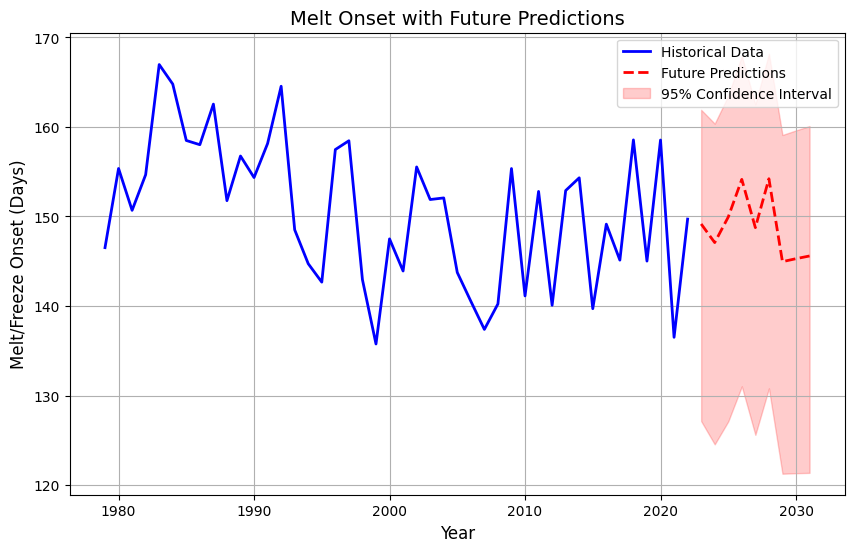


Validation Metrics for Melt Onset:
MAE: 7.5385
RMSE: 8.3165
MAPE: 5.07%
Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1209
Epoch 2/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0941
Epoch 3/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0749
Epoch 4/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0544
Epoch 5/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0327
Epoch 6/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0193
Epoch 7/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0083
Epoch 8/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0021
Epoch 9/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0083
Epoch 10/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0188
Epoch 11/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0140
Epoch 12/50
1/1 [==============================] - 0s 11ms/step - los

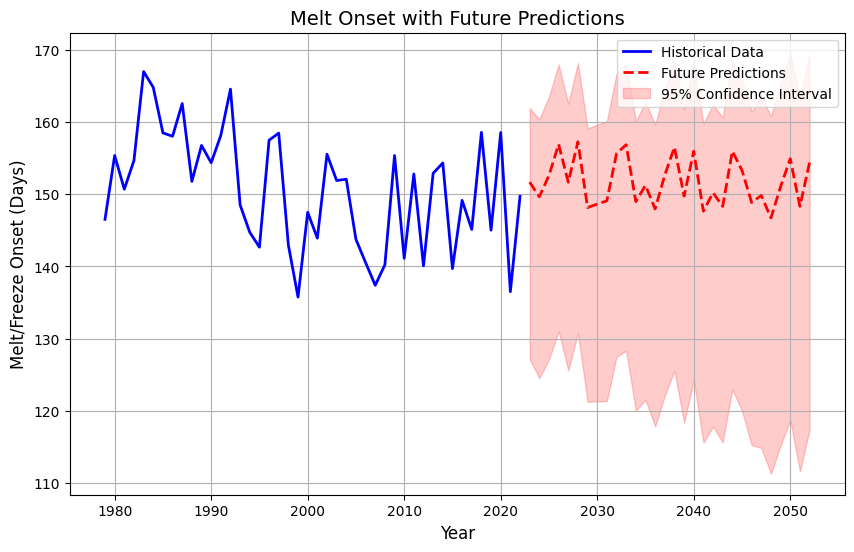


Future Predictions for Melt Onset:
Year 2023: 151.67 (95% CI: [127.14, 161.91])
Year 2024: 149.64 (95% CI: [124.54, 160.37])
Year 2025: 152.59 (95% CI: [127.11, 163.50])
Year 2026: 156.91 (95% CI: [131.02, 167.94])
Year 2027: 151.65 (95% CI: [125.60, 162.52])
Year 2028: 157.26 (95% CI: [130.80, 168.18])
Year 2029: 148.15 (95% CI: [121.26, 159.11])
Year 2030: 148.63 (95% CI: [121.32, 159.62])
Year 2031: 149.08 (95% CI: [121.36, 160.10])
Year 2032: 155.63 (95% CI: [127.50, 166.68])
Year 2033: 156.85 (95% CI: [128.32, 167.94])
Year 2034: 148.97 (95% CI: [120.05, 160.10])
Year 2035: 151.22 (95% CI: [121.54, 162.77])
Year 2036: 147.96 (95% CI: [117.84, 159.62])
Year 2037: 152.64 (95% CI: [122.09, 164.40])
Year 2038: 156.52 (95% CI: [125.55, 168.40])
Year 2039: 149.73 (95% CI: [118.37, 161.72])
Year 2040: 155.95 (95% CI: [124.25, 168.01])
Year 2041: 147.64 (95% CI: [115.61, 159.78])
Year 2042: 150.20 (95% CI: [117.84, 162.43])
Year 2043: 148.31 (95% CI: [115.64, 160.63])
Year 2044: 155.95 (

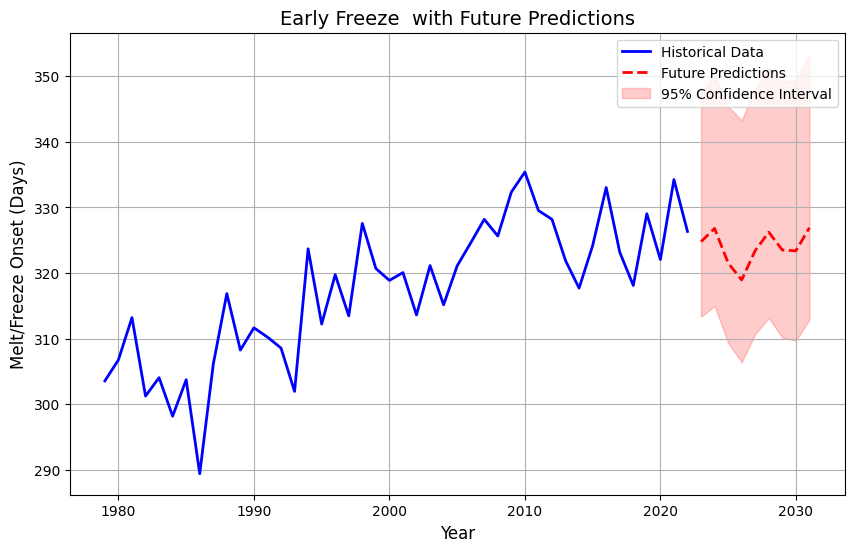


Validation Metrics for Early Freeze :
MAE: 5.1595
RMSE: 6.3550
MAPE: 1.58%
Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1337
Epoch 2/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1084
Epoch 3/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0840
Epoch 4/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0544
Epoch 5/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0313
Epoch 6/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0179
Epoch 7/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0060
Epoch 8/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0012
Epoch 9/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0085
Epoch 10/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0159
Epoch 11/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0150
Epoch 12/50
1/1 [==============================] - 0s 13ms/step - 

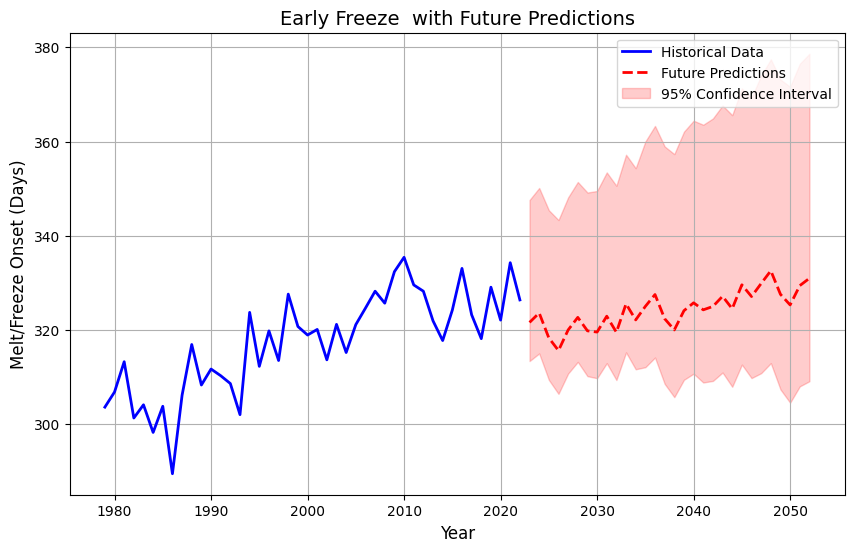


Future Predictions for Early Freeze :
Year 2023: 321.56 (95% CI: [313.35, 347.57])
Year 2024: 323.58 (95% CI: [314.97, 350.13])
Year 2025: 318.27 (95% CI: [309.35, 345.40])
Year 2026: 315.59 (95% CI: [306.39, 343.32])
Year 2027: 319.97 (95% CI: [310.71, 348.13])
Year 2028: 322.64 (95% CI: [313.17, 351.40])
Year 2029: 319.78 (95% CI: [310.14, 349.16])
Year 2030: 319.52 (95% CI: [309.71, 349.49])
Year 2031: 322.89 (95% CI: [312.90, 353.44])
Year 2032: 319.47 (95% CI: [309.32, 350.60])
Year 2033: 325.51 (95% CI: [315.19, 357.20])
Year 2034: 322.10 (95% CI: [311.61, 354.33])
Year 2035: 324.97 (95% CI: [312.05, 359.99])
Year 2036: 327.49 (95% CI: [314.10, 363.31])
Year 2037: 322.35 (95% CI: [308.51, 358.95])
Year 2038: 319.97 (95% CI: [305.68, 357.32])
Year 2039: 324.06 (95% CI: [309.37, 362.09])
Year 2040: 325.73 (95% CI: [310.67, 364.42])
Year 2041: 324.24 (95% CI: [308.80, 363.56])
Year 2042: 324.96 (95% CI: [309.13, 364.90])
Year 2043: 327.12 (95% CI: [310.91, 367.66])
Year 2044: 324.4

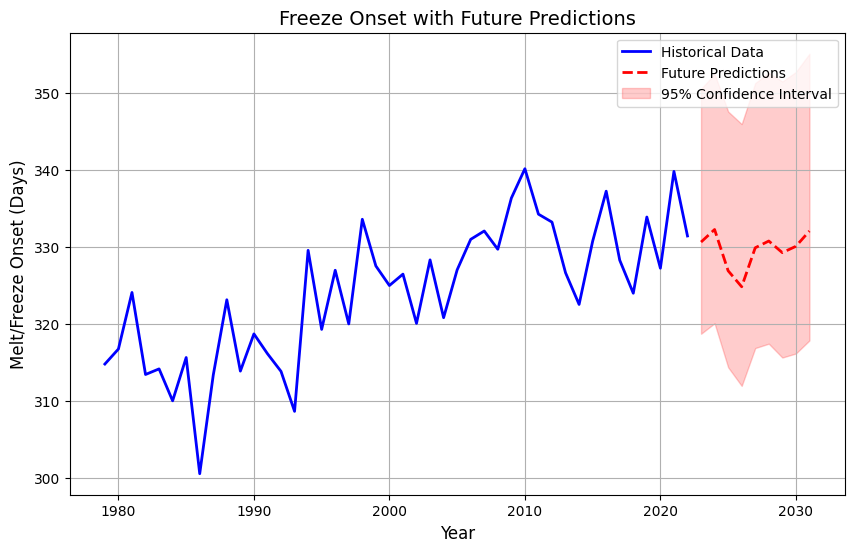


Validation Metrics for Freeze Onset:
MAE: 4.9805
RMSE: 6.0582
MAPE: 1.50%
Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.1272
Epoch 2/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0960
Epoch 3/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0639
Epoch 4/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0426
Epoch 5/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0235
Epoch 6/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0090
Epoch 7/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0022
Epoch 8/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0078
Epoch 9/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0139
Epoch 10/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0175
Epoch 11/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0146
Epoch 12/50
1/1 [==============================] - 0s 12ms/step - l

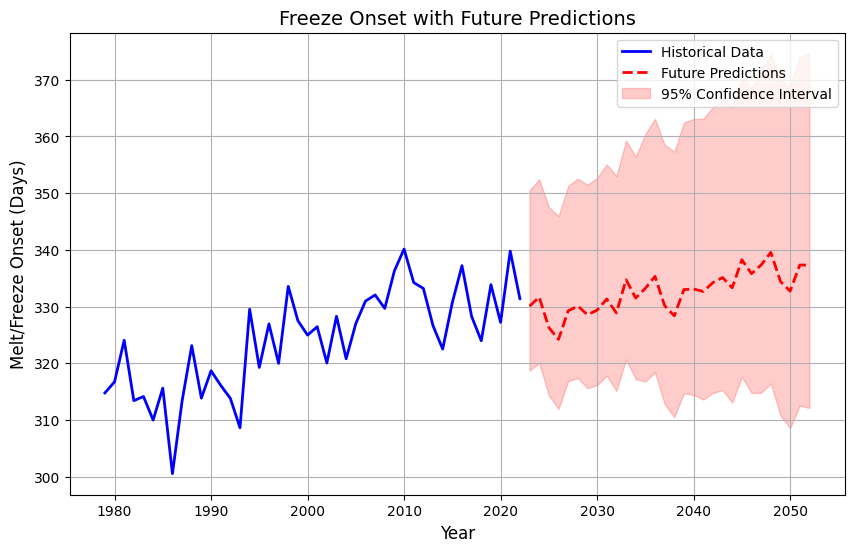


Future Predictions for Freeze Onset:
Year 2023: 330.06 (95% CI: [318.69, 350.49])
Year 2024: 331.67 (95% CI: [320.06, 352.44])
Year 2025: 326.30 (95% CI: [314.34, 347.56])
Year 2026: 324.20 (95% CI: [311.92, 345.93])
Year 2027: 329.24 (95% CI: [316.84, 351.25])
Year 2028: 330.09 (95% CI: [317.41, 352.55])
Year 2029: 328.56 (95% CI: [315.61, 351.46])
Year 2030: 329.36 (95% CI: [316.13, 352.69])
Year 2031: 331.32 (95% CI: [317.82, 355.06])
Year 2032: 328.87 (95% CI: [315.10, 353.02])
Year 2033: 334.72 (95% CI: [320.69, 359.26])
Year 2034: 331.50 (95% CI: [317.21, 356.43])
Year 2035: 333.22 (95% CI: [316.78, 360.43])
Year 2036: 335.32 (95% CI: [318.44, 363.10])
Year 2037: 330.15 (95% CI: [312.77, 358.52])
Year 2038: 328.36 (95% CI: [310.52, 357.31])
Year 2039: 333.00 (95% CI: [314.73, 362.46])
Year 2040: 333.09 (95% CI: [314.42, 363.06])
Year 2041: 332.66 (95% CI: [313.60, 363.12])
Year 2042: 334.23 (95% CI: [314.77, 365.17])
Year 2043: 335.11 (95% CI: [315.26, 366.52])
Year 2044: 333.30

In [52]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Load and preprocess data
def load_and_preprocess(file_path, region_column):
    data = pd.read_excel(file_path)
    target = data[region_column].values
    years = data['yyyy'].values
    return target, years

# Function to create sequences for LSTM model
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

# Function to fine-tune LSTM model
def fine_tune_lstm(X_lstm, y_lstm):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_lstm, y_lstm, epochs=50, batch_size=32, verbose=1)
    return model

# Function to calculate error metrics
def calculate_error_metrics(true_values, predicted_values):
    mae = np.mean(np.abs(true_values - predicted_values))
    rmse = np.sqrt(np.mean((true_values - predicted_values)**2))
    mape = np.mean(np.abs((true_values - predicted_values) / true_values)) * 100
    return mae, rmse, mape

# Function to plot results using Matplotlib
def plot_forecast_with_matplotlib(years, target, future_years, future_predictions, conf_int, title):
    plt.figure(figsize=(10, 6))

    # Plot historical data
    plt.plot(years, target, label='Historical Data', color='blue', linewidth=2)

    # Plot future predictions
    plt.plot(future_years, future_predictions, label='Future Predictions', color='red', linestyle='--', linewidth=2)

    # Plot confidence intervals
    plt.fill_between(future_years, conf_int[:, 0], conf_int[:, 1], color='red', alpha=0.2, label='95% Confidence Interval')

    # Add titles and labels
    plt.title(title, fontsize=14)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Melt/Freeze Onset (Days)', fontsize=12)

    # Add a legend
    plt.legend()

    # Show the plot
    plt.grid(True)
    plt.show()

# Function to combine SARIMA, LSTM, and Random Forest models with Matplotlib plotting
def hybrid_model_with_future_predictions(file_path, region_column, title, forecast_horizon=30):
    # Load and preprocess data
    target, years = load_and_preprocess(file_path, region_column)

    # Step 1: SARIMA model
    sarima_model = SARIMAX(target, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    sarima_results = sarima_model.fit(disp=False)

    # Get SARIMA predictions for historical and future periods
    sarima_predictions = sarima_results.predict(start=0, end=len(target)-1)
    sarima_future = sarima_results.forecast(steps=forecast_horizon)

    # Calculate residuals for historical data
    residuals = target - sarima_predictions

    # Step 2: LSTM model for residuals
    scaler = MinMaxScaler(feature_range=(0, 1))
    residuals_scaled = scaler.fit_transform(residuals.reshape(-1, 1))

    sequence_length = 30
    X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)
    X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

    # Train LSTM model
    lstm_model = fine_tune_lstm(X_lstm, y_lstm)

    # Prepare last sequence for future predictions
    last_sequence = residuals_scaled[-sequence_length:]
    future_residuals = []

    # Generate future residuals using LSTM
    current_sequence = last_sequence.reshape(1, sequence_length, 1)
    for _ in range(forecast_horizon):
        next_residual = lstm_model.predict(current_sequence)
        future_residuals.append(next_residual[0, 0])
        current_sequence = np.roll(current_sequence, -1)
        current_sequence[0, -1, 0] = next_residual

    future_residuals = np.array(future_residuals).reshape(-1, 1)
    future_residuals = scaler.inverse_transform(future_residuals)

    # Step 3: Random Forest for final adjustments
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    historical_time = np.arange(len(target)).reshape(-1, 1)
    rf_model.fit(historical_time, target - sarima_predictions)

    # Generate future dates for plotting
    future_years = np.arange(years[-1] + 1, years[-1] + forecast_horizon + 1)

    # Combine predictions for future values
    future_predictions = (sarima_future +
                         future_residuals.flatten() +
                         rf_model.predict(np.arange(len(target), len(target) + forecast_horizon).reshape(-1, 1)))

    # Confidence intervals from SARIMA
    conf_int = sarima_results.get_forecast(forecast_horizon).conf_int()

    # Plotting results using Matplotlib
    plot_forecast_with_matplotlib(years, target, future_years, future_predictions, conf_int, f'{title} with Future Predictions')

    return future_predictions, future_years, conf_int

# Function to evaluate model performance on historical data
def evaluate_prediction_accuracy(file_path, region_column, title):
    target, years = load_and_preprocess(file_path, region_column)

    # Use 80% of data for training
    train_size = int(len(target) * 0.8)
    train_data = target[:train_size]
    test_data = target[train_size:]
    test_years = years[train_size:]

    # Make predictions using the hybrid model
    predictions, _, _ = hybrid_model_with_future_predictions(file_path, region_column, title, forecast_horizon=len(test_data))

    # Calculate error metrics
    mae, rmse, mape = calculate_error_metrics(test_data, predictions[:len(test_data)])

    print(f'\nValidation Metrics for {title}:')
    print(f'MAE: {mae:.4f}')
    print(f'RMSE: {rmse:.4f}')
    print(f'MAPE: {mape:.2f}%')

# Example usage
forecast_horizon = 30  # Number of years to forecast
for file_path, title in [
    ('DS1.xlsx', 'Early Melt Onset'),
    ('DS2.xlsx', 'Melt Onset'),
    ('DS3.xlsx', 'Early Freeze '),
    ('DS4.xlsx', 'Freeze Onset')
]:
    print(f"\nProcessing {title}")
    # Evaluate model accuracy
    evaluate_prediction_accuracy(file_path, 'Hudson Bay', title)
    # Generate future predictions
    future_predictions, future_years, confidence_intervals = hybrid_model_with_future_predictions(
        file_path, 'Hudson Bay', title, forecast_horizon)
    print(f"\nFuture Predictions for {title}:")
    for year, pred, ci_lower, ci_upper in zip(
    future_years, future_predictions,
    confidence_intervals[:, 0], confidence_intervals[:, 1]
):
      print(f"Year {year}: {pred:.2f} (95% CI: [{ci_lower:.2f}, {ci_upper:.2f}])")


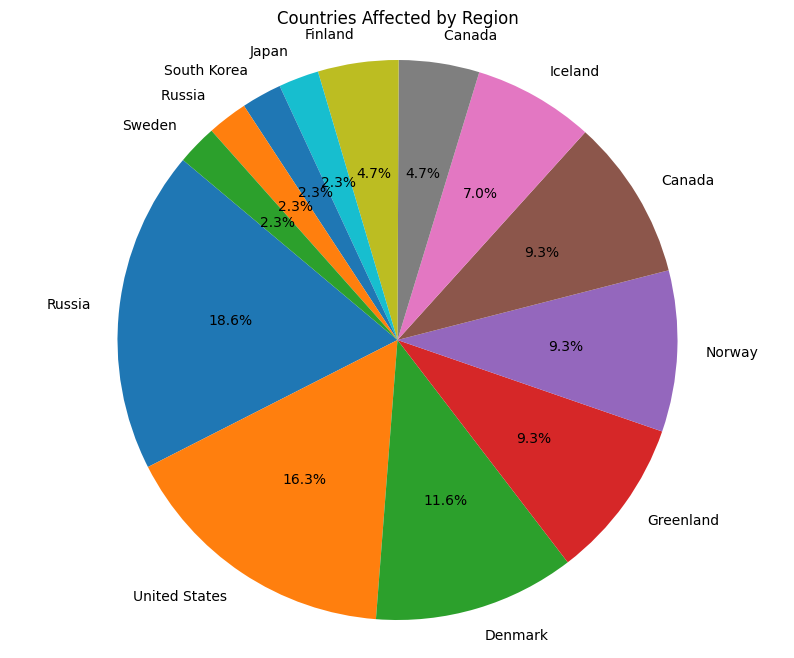

In [53]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset (ensure the file path is correct)
file_path = 'Countries affected.xlsx'
df = pd.read_excel(file_path)

# Stack the data so that each region becomes a column, and the country is under 'Country'
stacked_df = df.melt(var_name='Region', value_name='Country').dropna()

# Count occurrences of each country to know how many times each country is listed
country_counts = stacked_df['Country'].value_counts()

# Create a pie chart using Matplotlib
plt.figure(figsize=(10, 8))
plt.pie(country_counts.values, labels=country_counts.index, autopct='%1.1f%%', startangle=140)

# Set title for the plot
plt.title('Countries Affected by Region')

# Equal aspect ratio ensures that pie is drawn as a circle.
plt.axis('equal')  

# Display the pie chart
plt.show()


In [62]:
!pip install ipywidgets==7.5.1





Defaulting to user installation because normal site-packages is not writeable
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.6.5
    Uninstalling ipywidgets-7.6.5:
      Successfully uninstalled ipywidgets-7.6.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipympl 0.8.8 requires ipywidgets<8,>=7.6.0, but you have ipywidgets 7.5.1 which is incompatible.


1/1 [==============================] - 0s 10ms/step


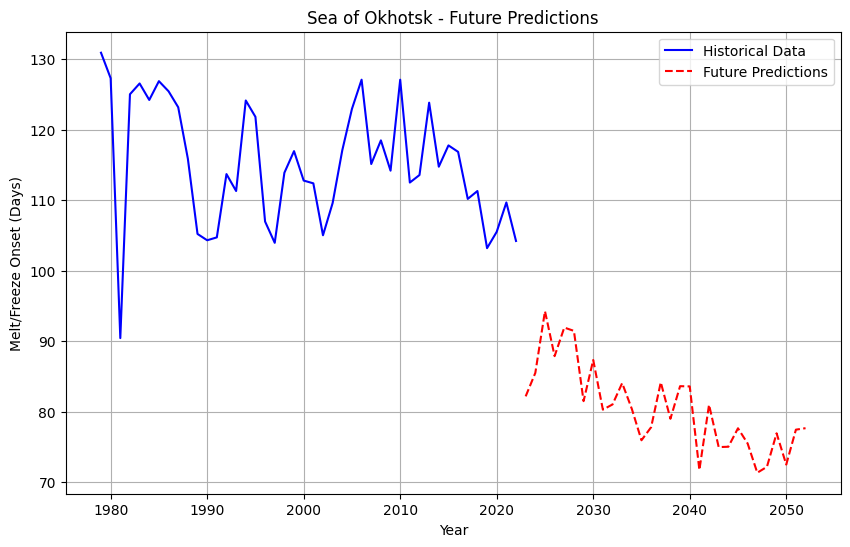

1/1 [==============================] - 0s 11ms/step


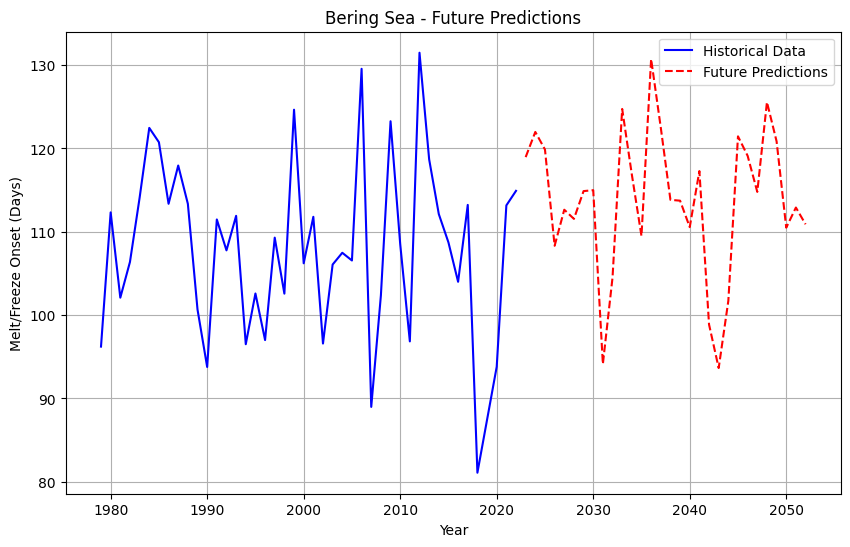

1/1 [==============================] - 0s 10ms/step


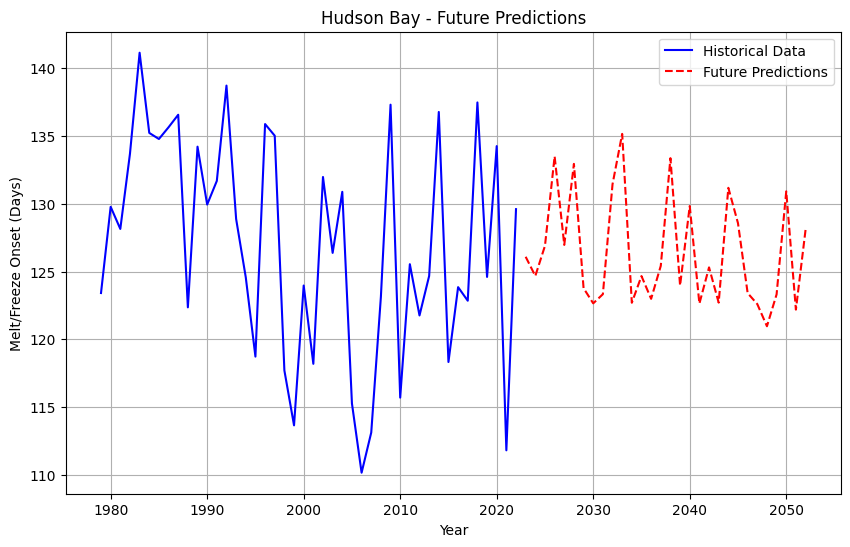

1/1 [==============================] - 0s 12ms/step


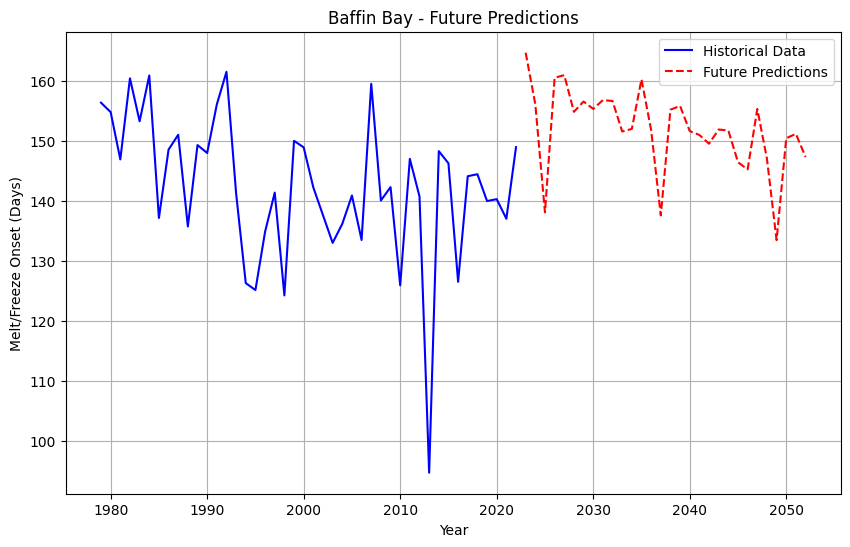

1/1 [==============================] - 0s 11ms/step


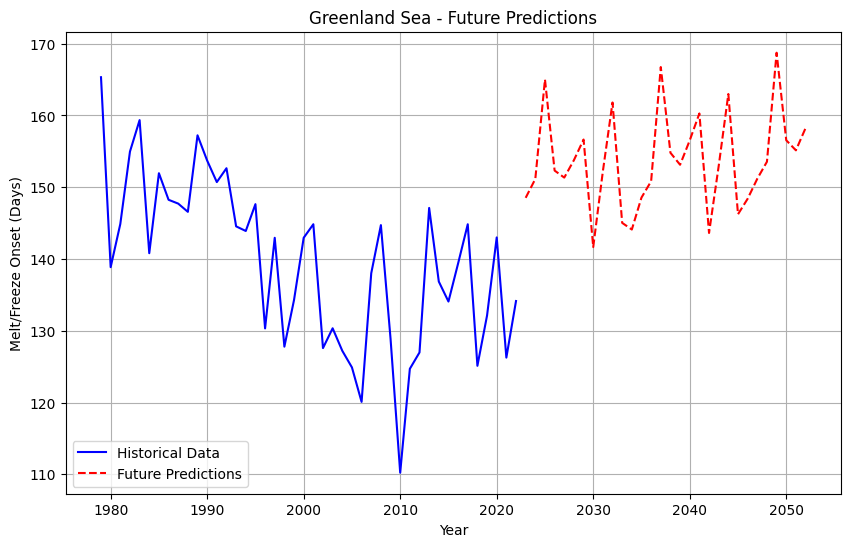

1/1 [==============================] - 0s 10ms/step


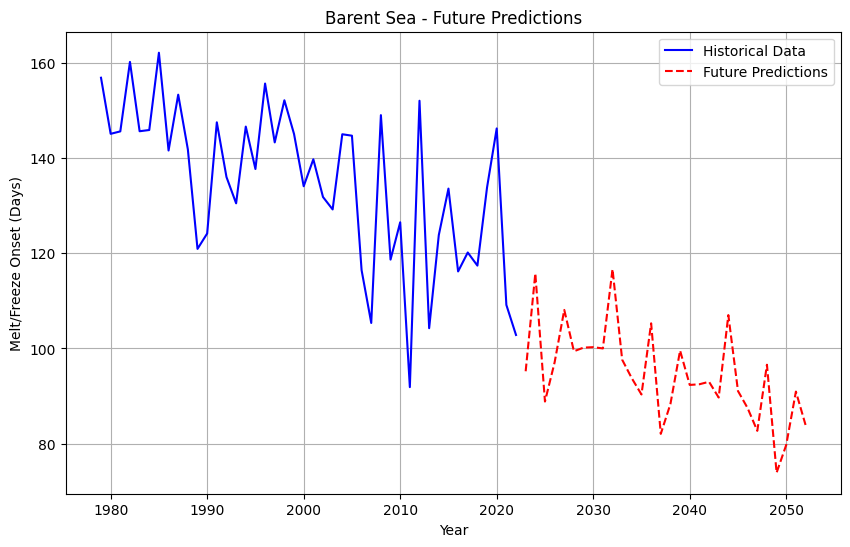

1/1 [==============================] - 0s 10ms/step


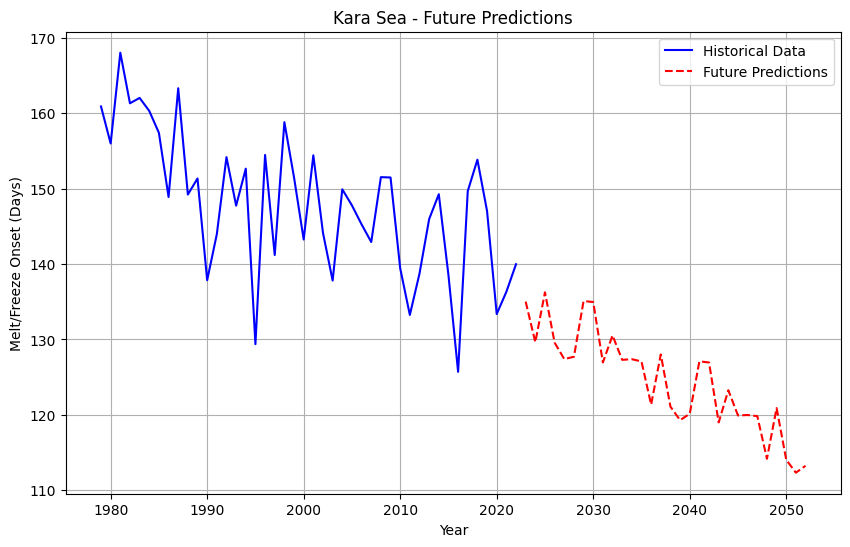

1/1 [==============================] - 0s 11ms/step


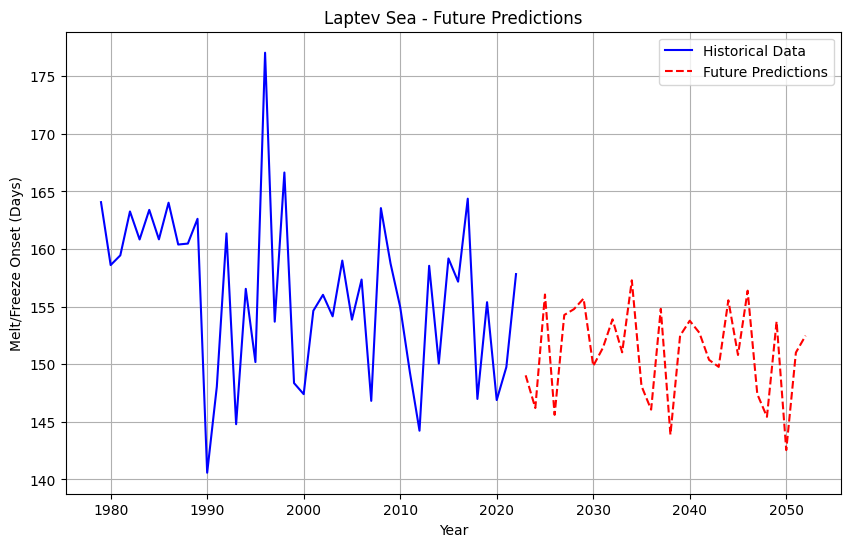

1/1 [==============================] - 0s 11ms/step


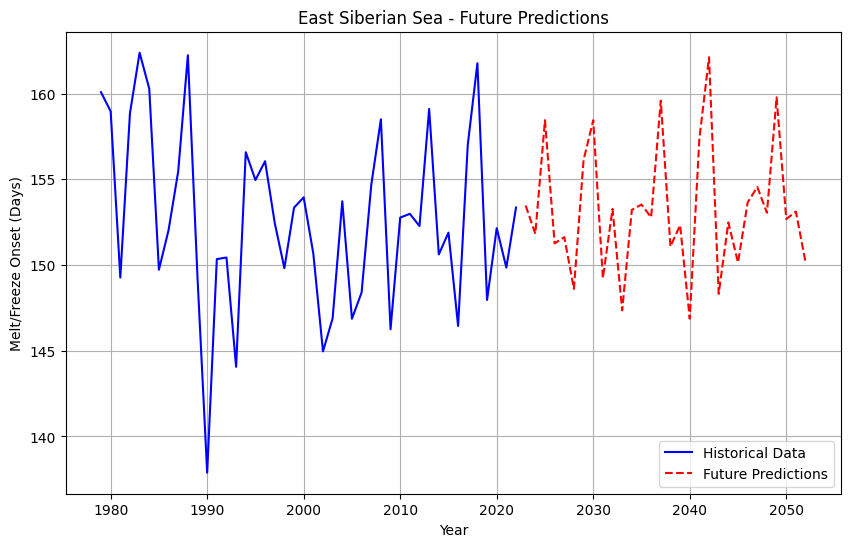

1/1 [==============================] - 0s 10ms/step


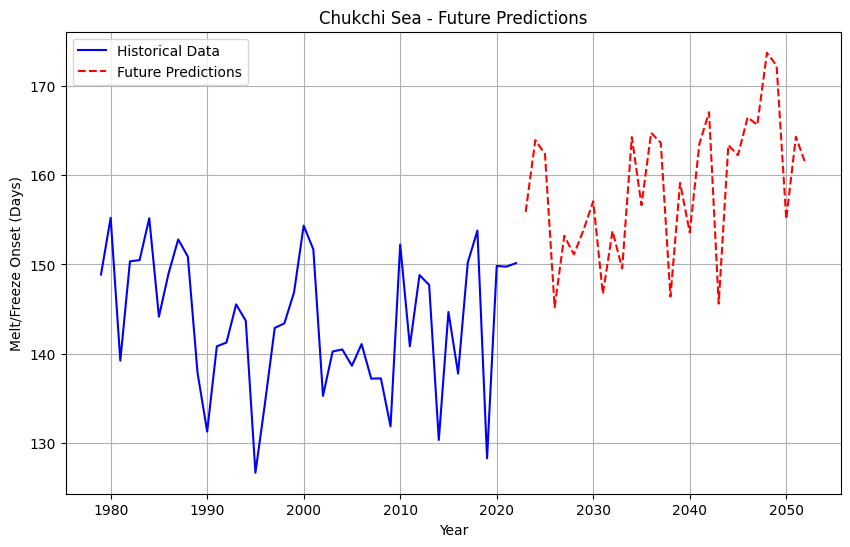

1/1 [==============================] - 0s 10ms/step


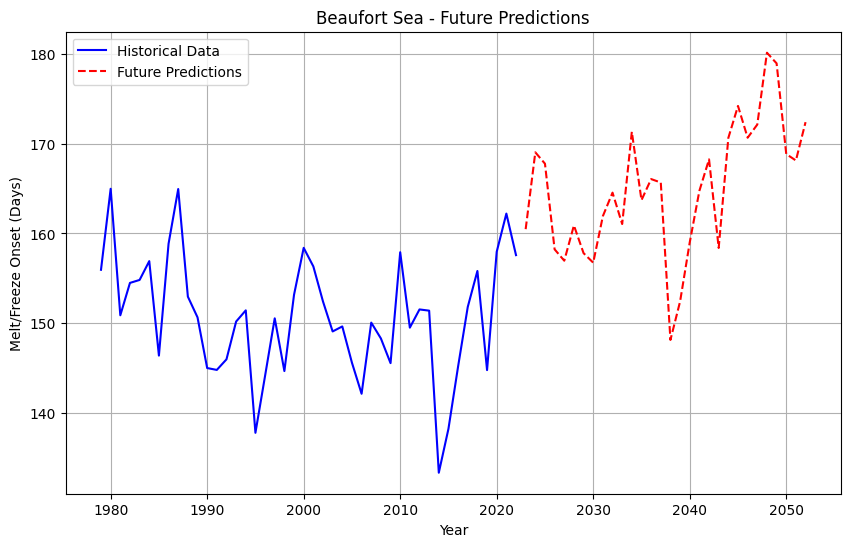

1/1 [==============================] - 0s 10ms/step


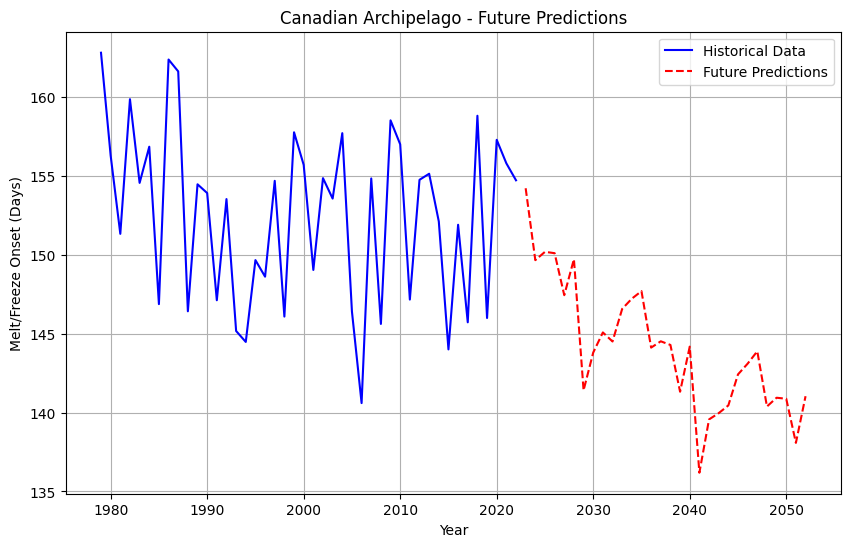

1/1 [==============================] - 0s 10ms/step


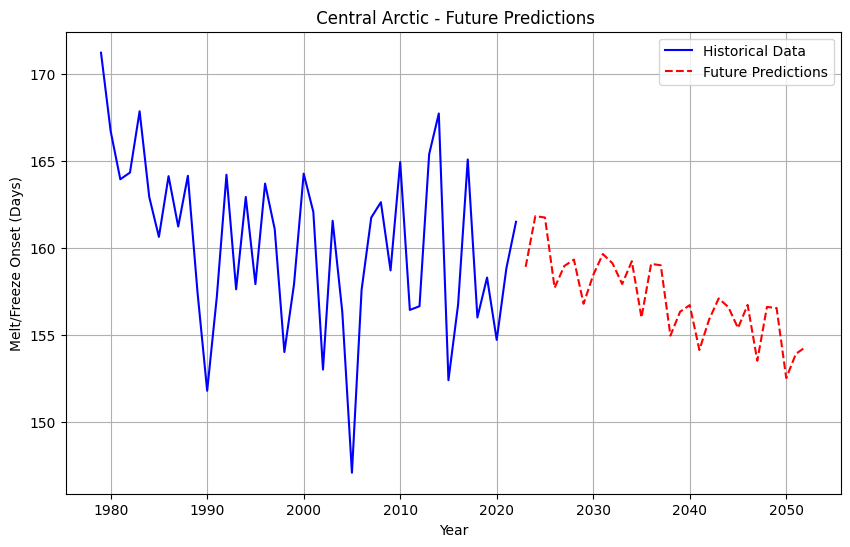

1/1 [==============================] - 0s 31ms/step


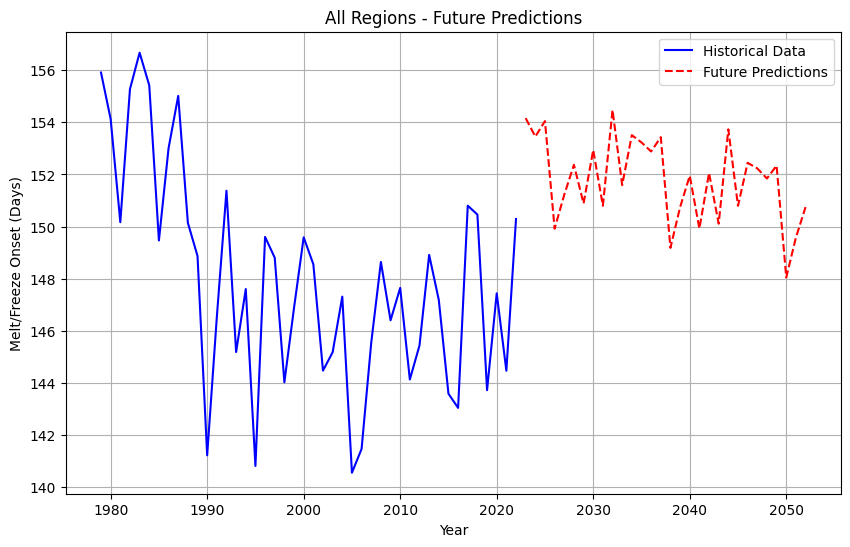

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Load and preprocess data
def load_and_preprocess(file_path, region_column):
    data = pd.read_excel(file_path)
    data[region_column] = pd.to_numeric(data[region_column], errors='coerce')
    data = data.dropna(subset=[region_column])
    
    if data.empty:
        return None, None
    target = data[region_column].values
    years = data['yyyy'].values
    return target, years

# Function to create sequences for LSTM model
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

# Function to fine-tune LSTM model
def fine_tune_lstm(X_lstm, y_lstm):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_lstm, y_lstm, epochs=50, batch_size=32, verbose=0)
    return model

# Function to apply SARIMA + LSTM + Random Forest hybrid model
def hybrid_model_with_future_predictions(file_path, region_column, forecast_horizon=30):
    target, years = load_and_preprocess(file_path, region_column)
    
    if target is None or years is None:
        print(f"Skipping {region_column} as no data available.")
        return None, None, None, None
    
    # SARIMA model
    sarima_model = SARIMAX(target, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    sarima_results = sarima_model.fit(disp=False)
    
    # Get SARIMA predictions for historical and future periods
    sarima_predictions = sarima_results.predict(start=0, end=len(target)-1)
    sarima_future = sarima_results.forecast(steps=forecast_horizon)

    # Calculate residuals for LSTM model
    residuals = target - sarima_predictions
    scaler = MinMaxScaler(feature_range=(0, 1))
    residuals_scaled = scaler.fit_transform(residuals.reshape(-1, 1))

    sequence_length = 30
    X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)
    X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

    # Train LSTM model
    lstm_model = fine_tune_lstm(X_lstm, y_lstm)

    # Prepare the last sequence for future predictions
    last_sequence = residuals_scaled[-sequence_length:]
    future_residuals = []

    # Generate future residuals using LSTM
    current_sequence = last_sequence.reshape(1, sequence_length, 1)
    for _ in range(forecast_horizon):
        next_residual = lstm_model.predict(current_sequence)
        future_residuals.append(next_residual[0, 0])
        current_sequence = np.roll(current_sequence, -1)
        current_sequence[0, -1, 0] = next_residual

    future_residuals = np.array(future_residuals).reshape(-1, 1)
    future_residuals = scaler.inverse_transform(future_residuals)

    # Step 3: Random Forest for final adjustments
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    historical_time = np.arange(len(target)).reshape(-1, 1)
    rf_model.fit(historical_time, target - sarima_predictions)

    # Future predictions
    future_years = np.arange(years[-1] + 1, years[-1] + forecast_horizon + 1)
    future_predictions = (sarima_future + future_residuals.flatten() +
                          rf_model.predict(np.arange(len(target), len(target) + forecast_horizon).reshape(-1, 1)))

    return years, target, future_years, future_predictions

# Function to plot the results for each region
def plot_region_predictions(file_path):
    df = pd.read_excel(file_path)
    regions = df.columns.drop('yyyy')  # Exclude the 'yyyy' column

    # Plot for each region in the dataset
    for region_name in regions:
        years, target, future_years, future_predictions = hybrid_model_with_future_predictions(file_path, region_name)
        
        if future_predictions is None:
            continue
        
        plt.figure(figsize=(10, 6))
        plt.plot(years, target, label="Historical Data", color="blue")
        plt.plot(future_years, future_predictions, label="Future Predictions", color="red", linestyle="--")
        
        plt.title(f"{region_name} - Future Predictions")
        plt.xlabel("Year")
        plt.ylabel("Melt/Freeze Onset (Days)")
        plt.legend()
        plt.grid(True)
        plt.show()

# Run the plotting function on all regions
plot_region_predictions('DS1.xlsx')  # Replace with your dataset as needed


1/1 [==============================] - 0s 16ms/step


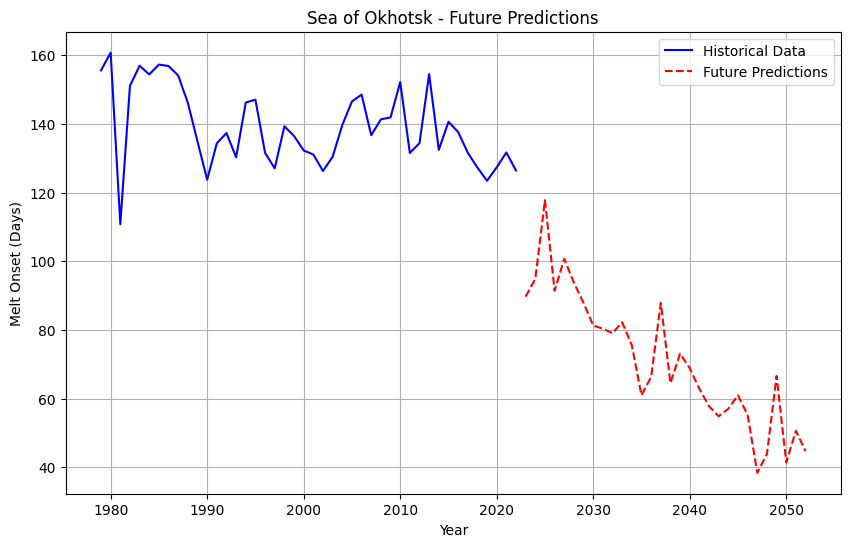

1/1 [==============================] - 0s 10ms/step


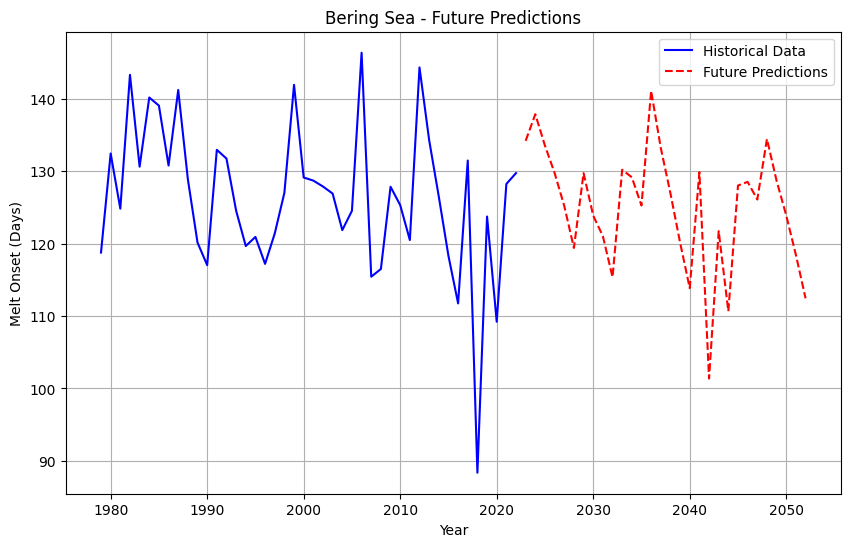

1/1 [==============================] - 0s 11ms/step


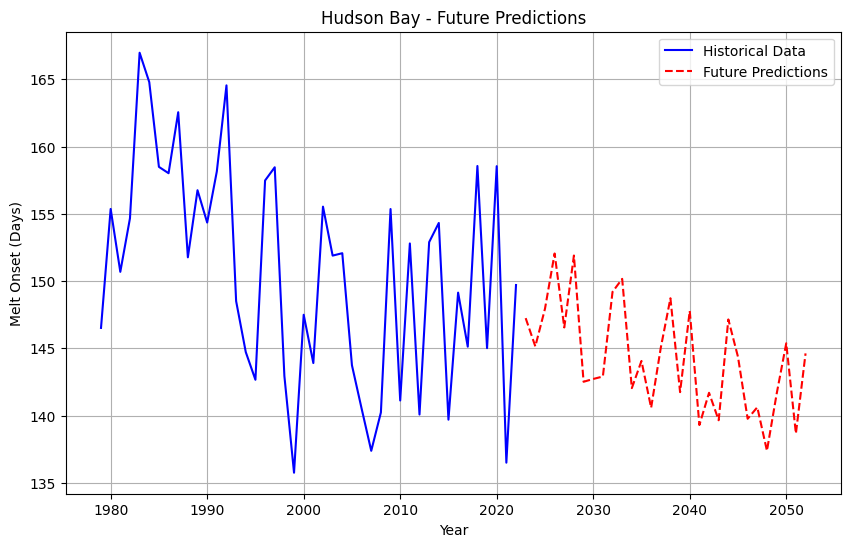

1/1 [==============================] - 0s 12ms/step


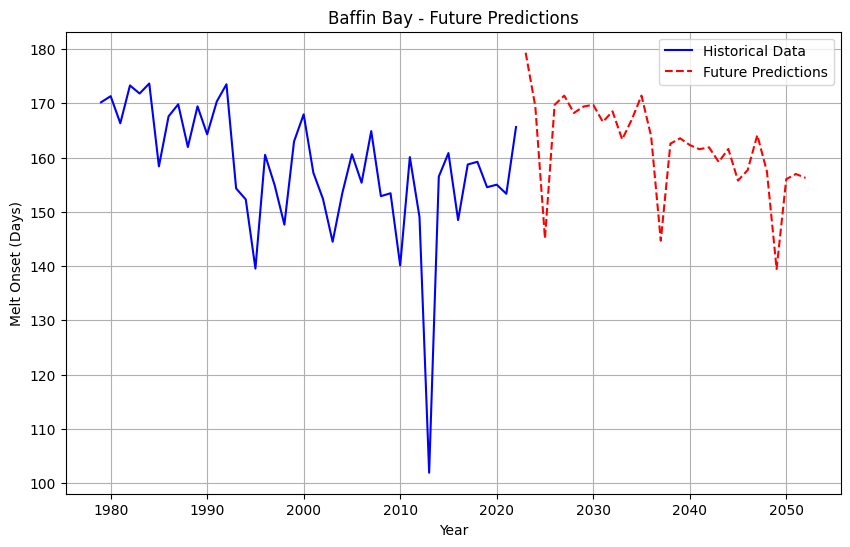

1/1 [==============================] - 0s 11ms/step


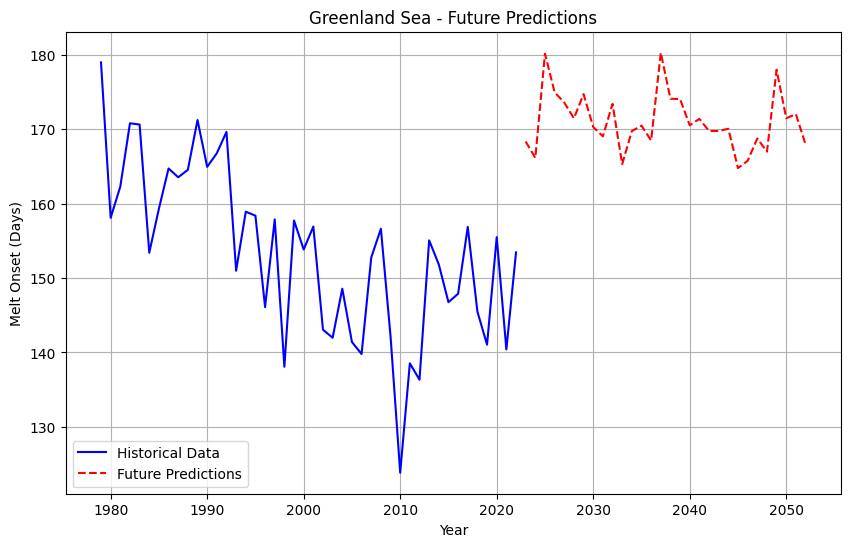

1/1 [==============================] - 0s 11ms/step


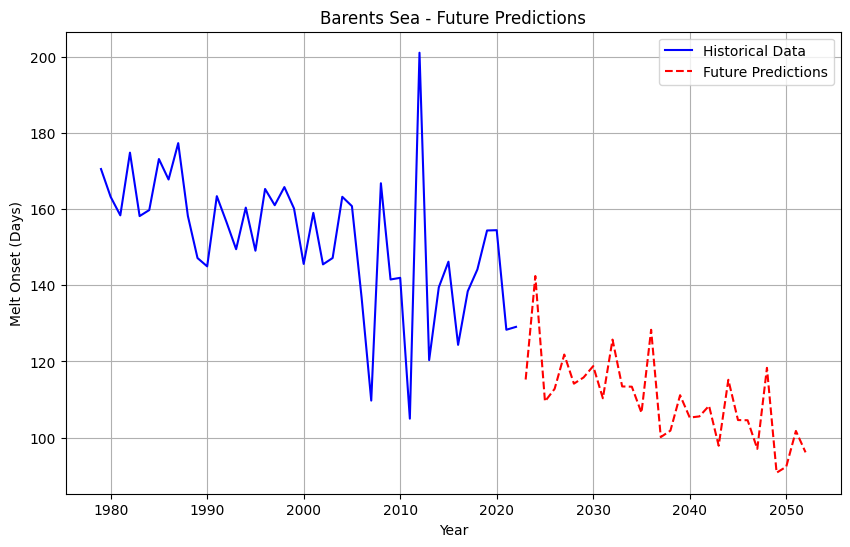

1/1 [==============================] - 0s 10ms/step


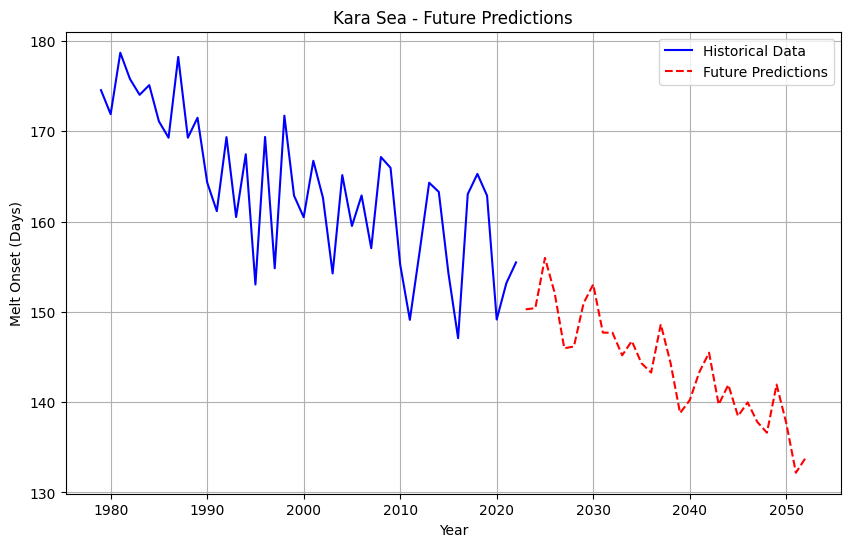

1/1 [==============================] - 0s 11ms/step


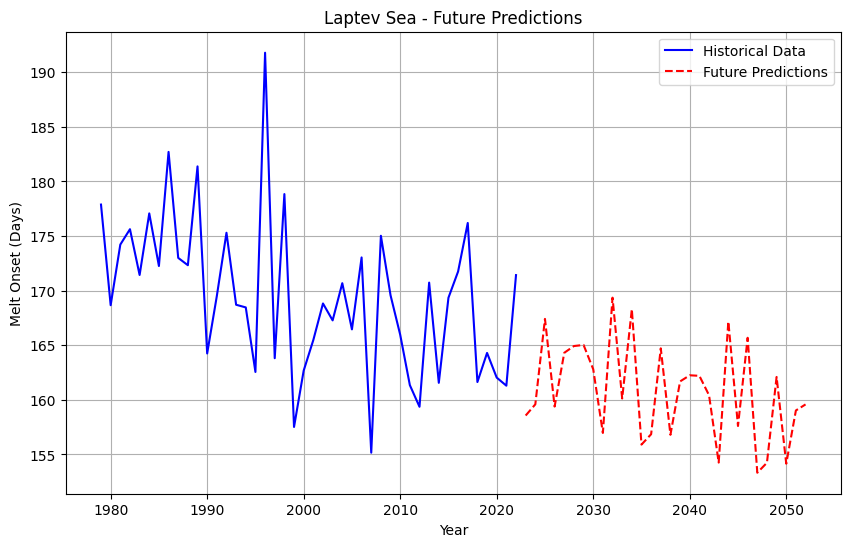

1/1 [==============================] - 0s 10ms/step


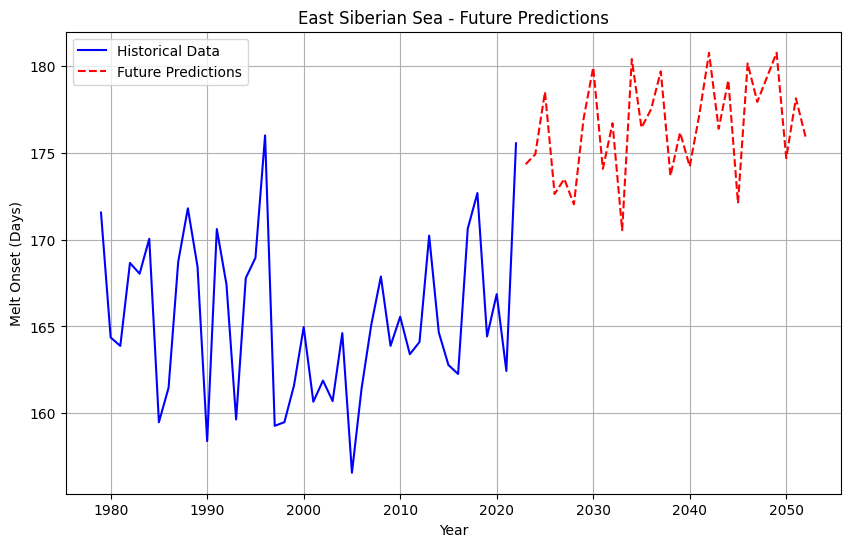

1/1 [==============================] - 0s 10ms/step


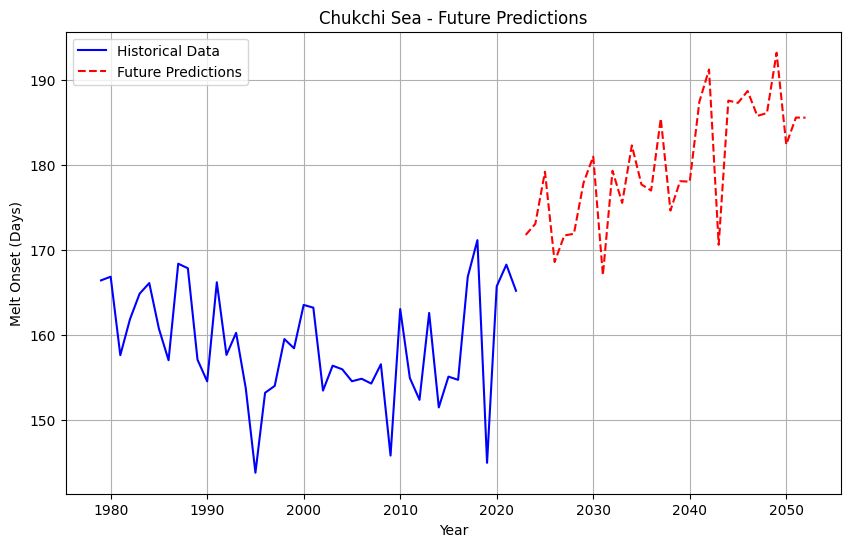

1/1 [==============================] - 0s 18ms/step


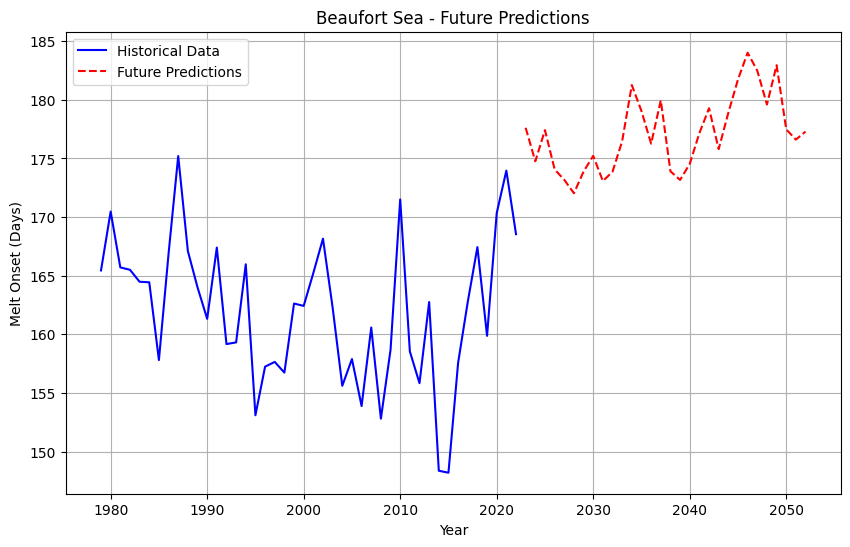

1/1 [==============================] - 0s 12ms/step


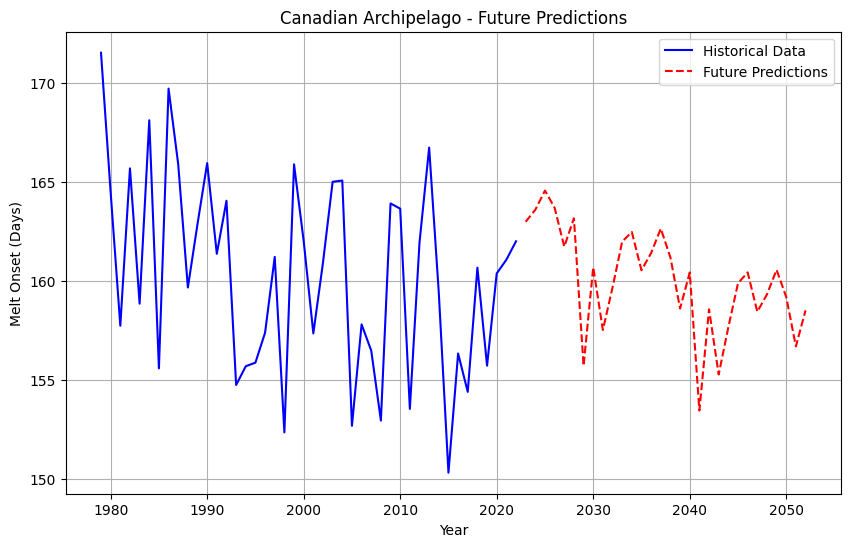

1/1 [==============================] - 0s 11ms/step


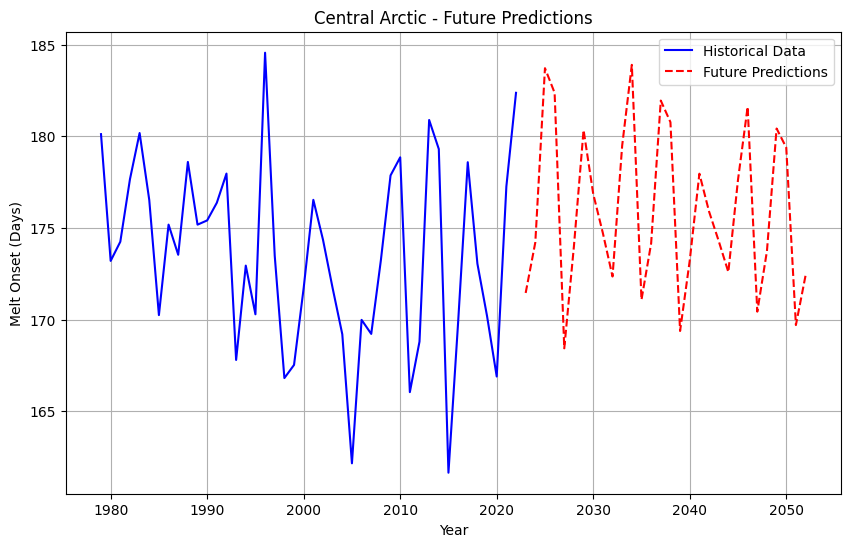

1/1 [==============================] - 0s 10ms/step


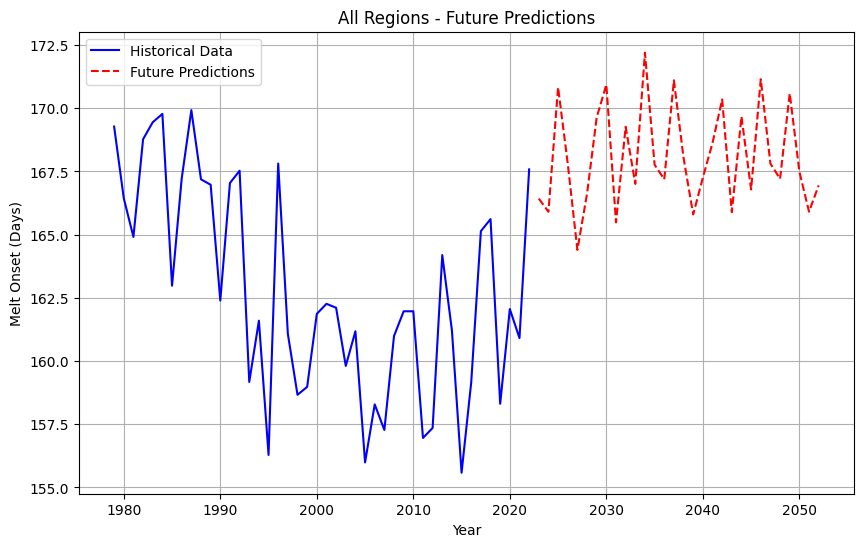

In [67]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Load and preprocess data
def load_and_preprocess(file_path, region_column):
    data = pd.read_excel(file_path)
    
    # Convert the region column to numeric, forcing errors to NaN, then drop NaNs
    data[region_column] = pd.to_numeric(data[region_column], errors='coerce')
    data = data.dropna(subset=[region_column])
    
    # Check if there is data left after cleaning
    if data.empty:
        print(f"No data available for {region_column}")
        return None, None
    
    target = data[region_column].values
    years = data['yyyy'].values
    return target, years

# Function to create sequences for LSTM model
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

# Function to fine-tune LSTM model
def fine_tune_lstm(X_lstm, y_lstm):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_lstm, y_lstm, epochs=50, batch_size=32, verbose=0)
    return model

# Function to combine SARIMA, LSTM, and Random Forest models
def hybrid_model_with_future_predictions(file_path, region_column, forecast_horizon=30):
    target, years = load_and_preprocess(file_path, region_column)
    
    # Check if we have valid data
    if target is None or years is None:
        print(f"Skipping {region_column} as no data available.")
        return None, None, None, None
    
    # SARIMA model
    sarima_model = SARIMAX(target, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    sarima_results = sarima_model.fit(disp=False)

    # Get SARIMA predictions for historical and future periods
    sarima_predictions = sarima_results.predict(start=0, end=len(target)-1)
    sarima_future = sarima_results.forecast(steps=forecast_horizon)

    # Residuals for LSTM
    residuals = target - sarima_predictions
    scaler = MinMaxScaler(feature_range=(0, 1))
    residuals_scaled = scaler.fit_transform(residuals.reshape(-1, 1))

    sequence_length = 30
    X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)
    X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

    # Train LSTM
    lstm_model = fine_tune_lstm(X_lstm, y_lstm)

    # Prepare for future predictions
    last_sequence = residuals_scaled[-sequence_length:]
    future_residuals = []

    current_sequence = last_sequence.reshape(1, sequence_length, 1)
    for _ in range(forecast_horizon):
        next_residual = lstm_model.predict(current_sequence)
        future_residuals.append(next_residual[0, 0])
        current_sequence = np.roll(current_sequence, -1)
        current_sequence[0, -1, 0] = next_residual

    future_residuals = np.array(future_residuals).reshape(-1, 1)
    future_residuals = scaler.inverse_transform(future_residuals)

    # Random Forest for final adjustments
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    historical_time = np.arange(len(target)).reshape(-1, 1)
    rf_model.fit(historical_time, target - sarima_predictions)

    # Future predictions
    future_years = np.arange(years[-1] + 1, years[-1] + forecast_horizon + 1)
    future_predictions = (sarima_future +
                         future_residuals.flatten() +
                         rf_model.predict(np.arange(len(target), len(target) + forecast_horizon).reshape(-1, 1)))

    return years, target, future_years, future_predictions

# Function to plot the results for each region using matplotlib
def plot_region_predictions(file_path):
    df = pd.read_excel(file_path)
    regions = df.columns.drop('yyyy')  # Exclude the 'yyyy' column

    # Plot for each region in the dataset
    for region_name in regions:
        years, target, future_years, future_predictions = hybrid_model_with_future_predictions(file_path, region_name)
        
        if future_predictions is None:
            continue
        
        plt.figure(figsize=(10, 6))
        plt.plot(years, target, label="Historical Data", color="blue")
        plt.plot(future_years, future_predictions, label="Future Predictions", color="red", linestyle="--")
        
        plt.title(f"{region_name} - Future Predictions")
        plt.xlabel("Year")
        plt.ylabel("Melt Onset (Days)")
        plt.legend()
        plt.grid(True)
        plt.show()

# Run the plotting function on all regions for DS2 (Melt Onset)
plot_region_predictions('DS2.xlsx')



1/1 [==============================] - 0s 10ms/step


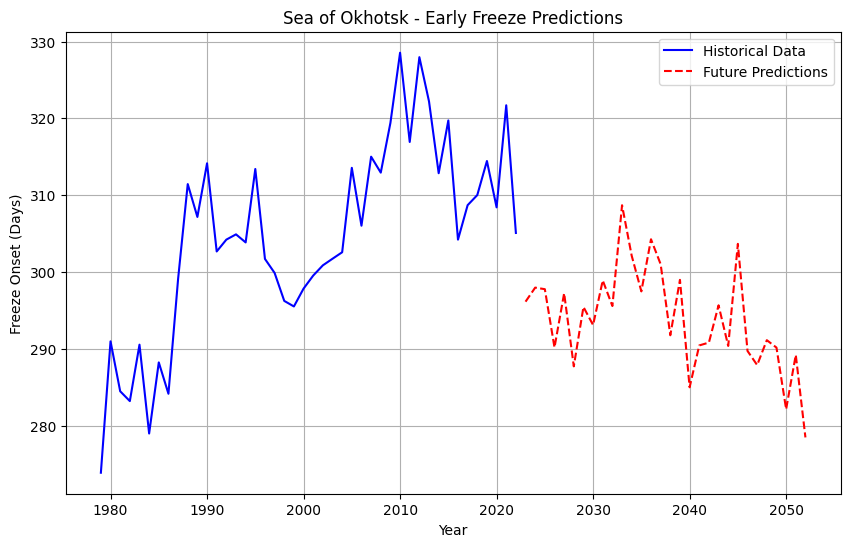

1/1 [==============================] - 0s 20ms/step


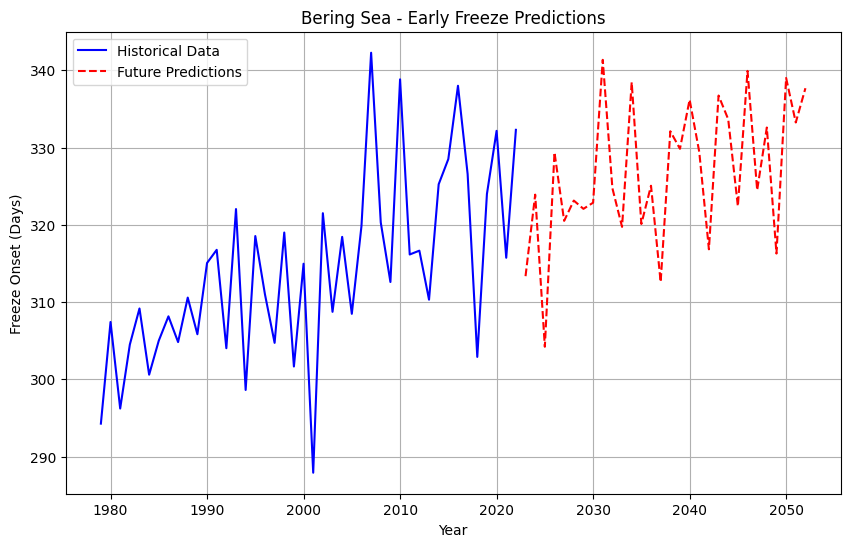

1/1 [==============================] - 0s 11ms/step


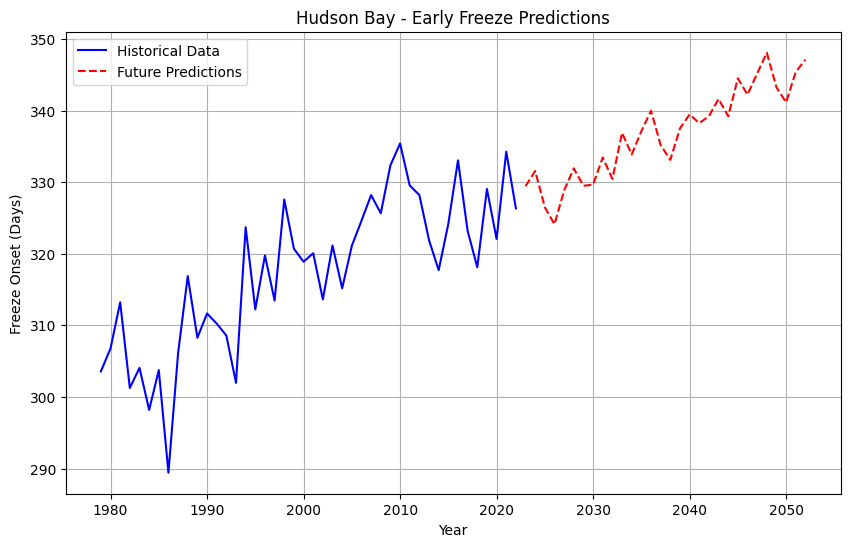

1/1 [==============================] - 0s 13ms/step


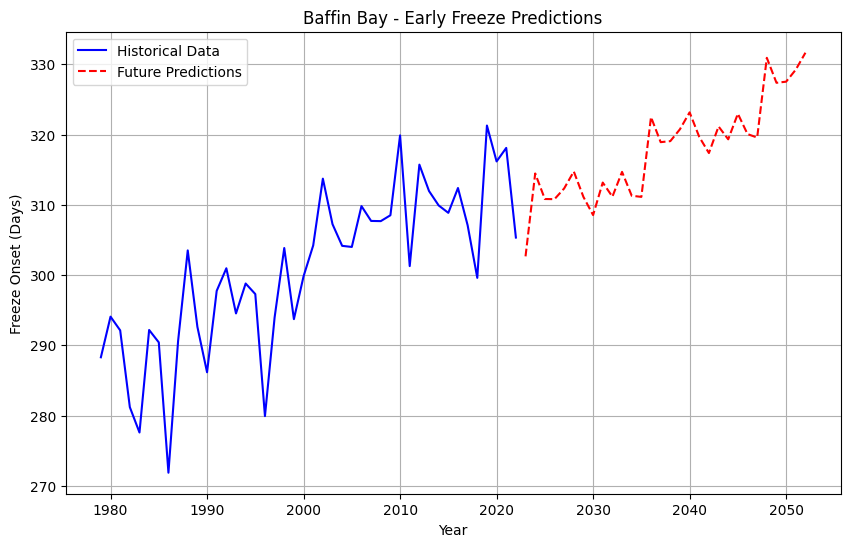

1/1 [==============================] - 0s 9ms/step


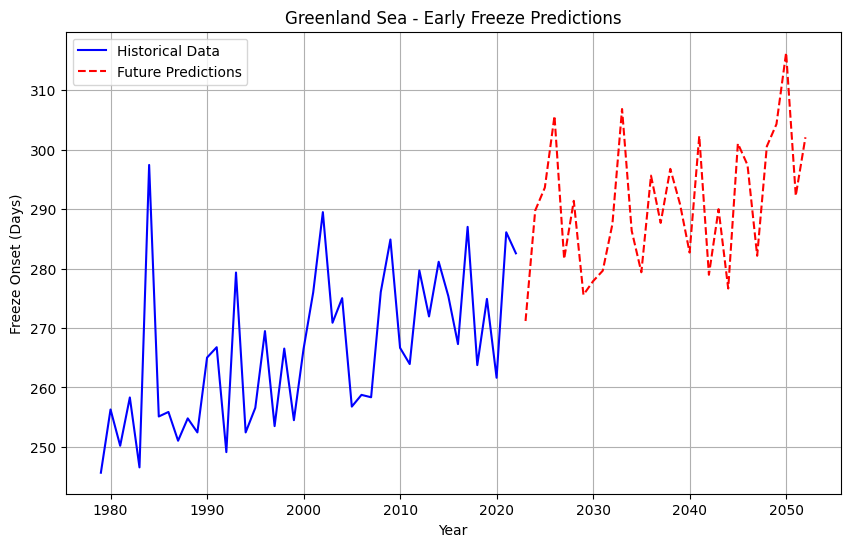

1/1 [==============================] - 0s 10ms/step


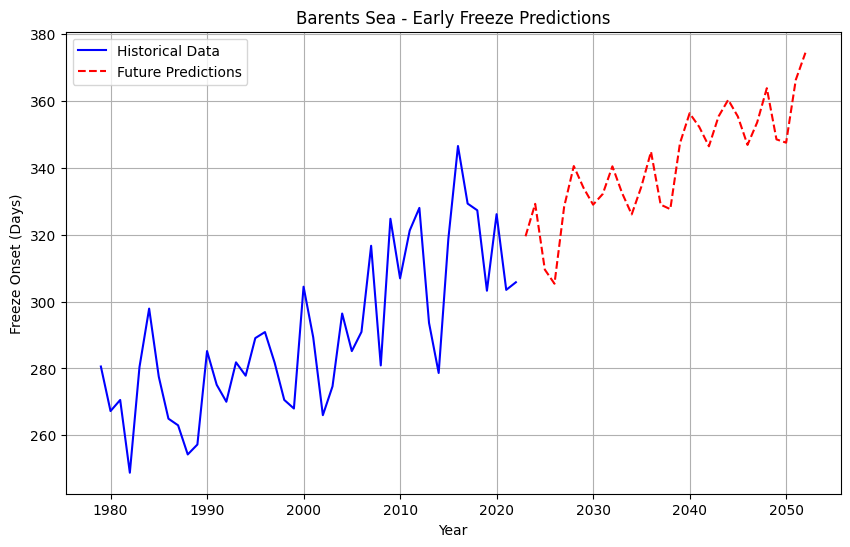

1/1 [==============================] - 0s 11ms/step


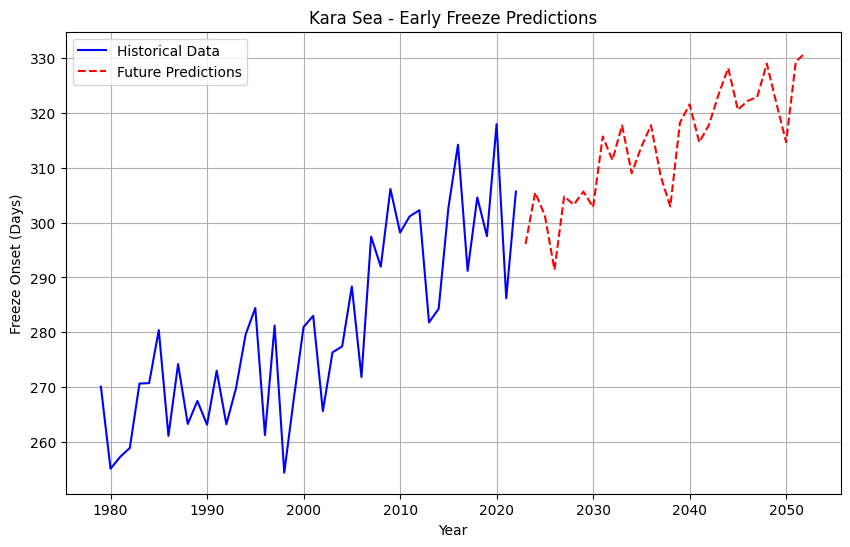

1/1 [==============================] - 0s 10ms/step


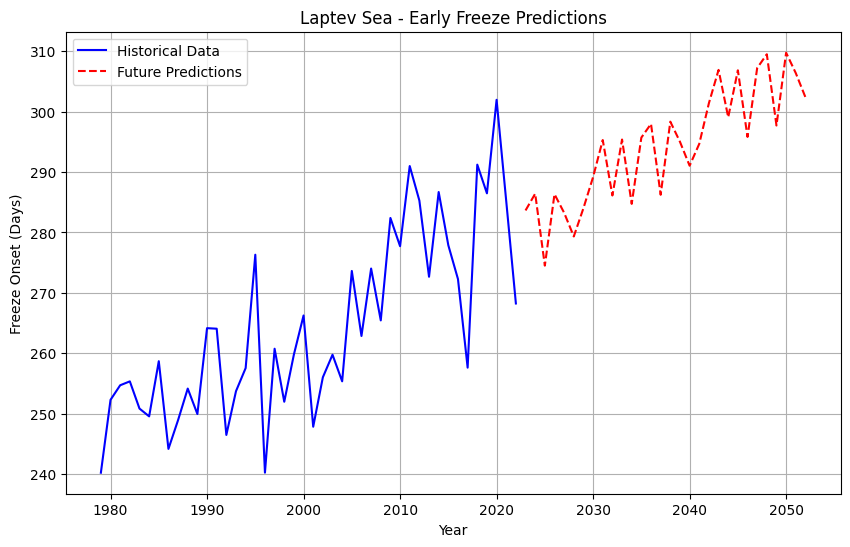

1/1 [==============================] - 0s 10ms/step


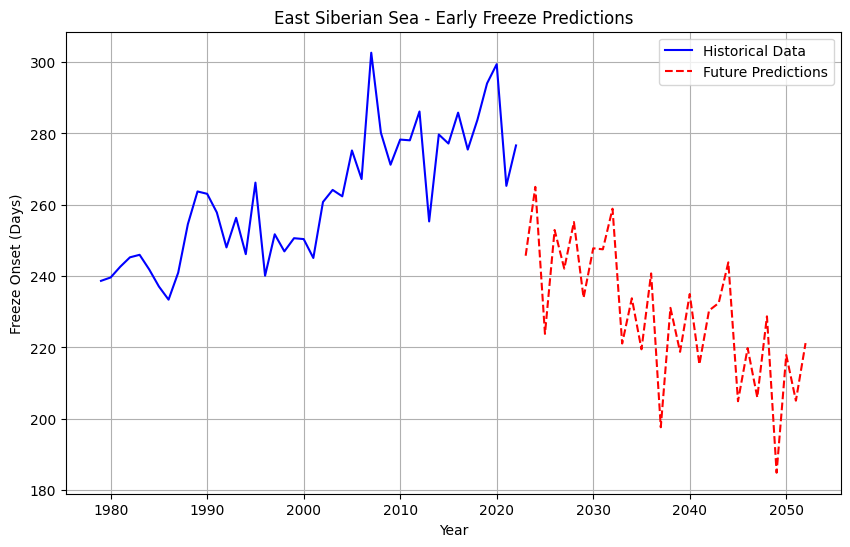

1/1 [==============================] - 0s 10ms/step


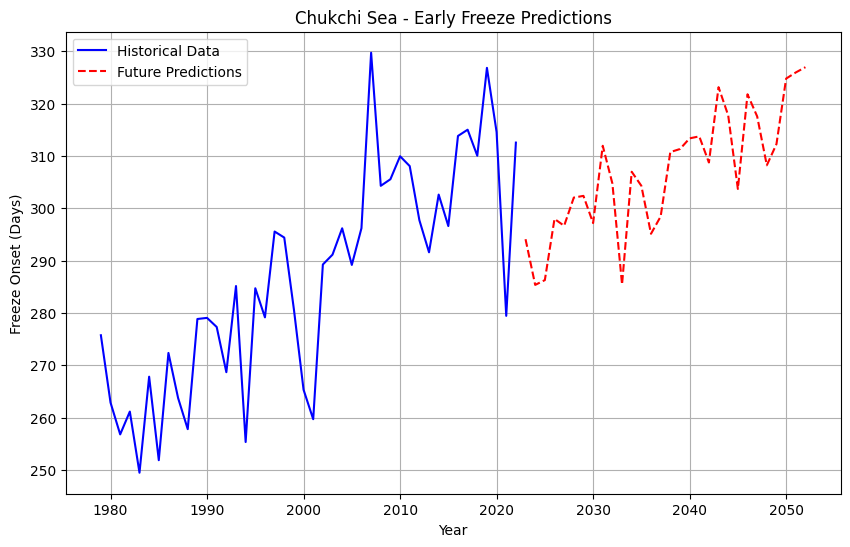

1/1 [==============================] - 0s 10ms/step


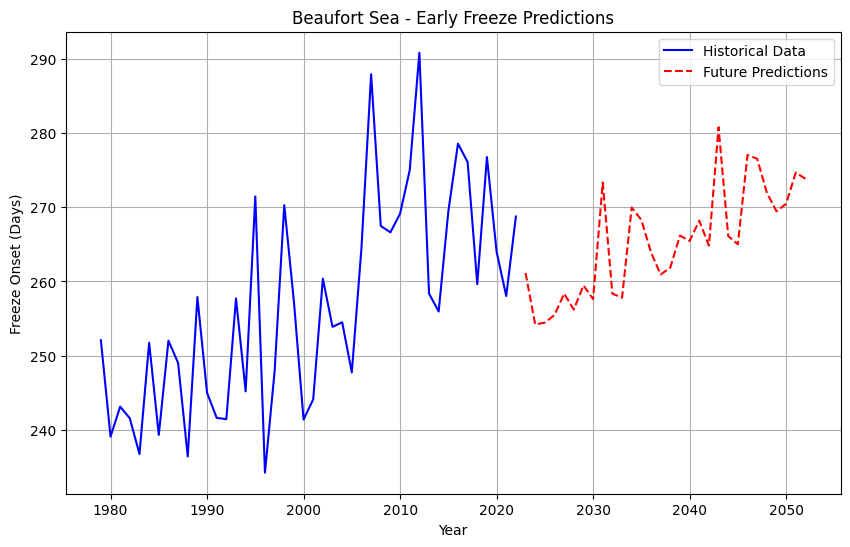

1/1 [==============================] - 0s 10ms/step


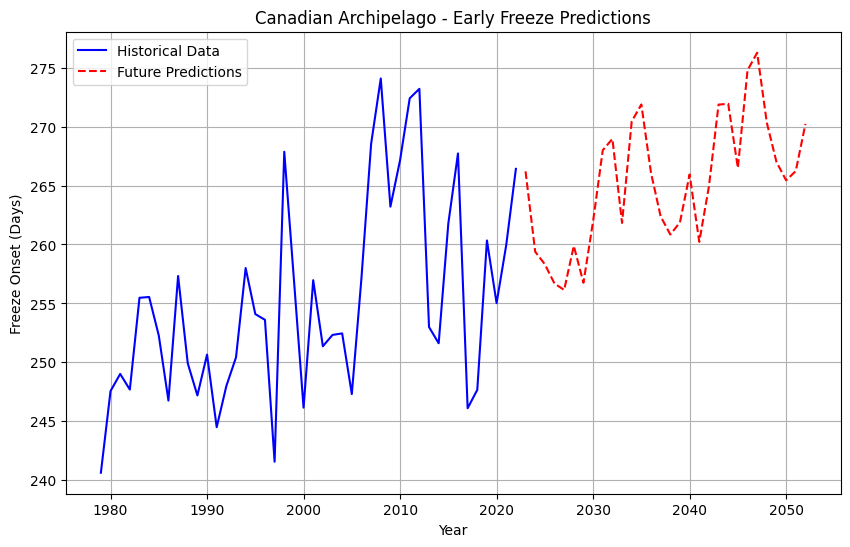

1/1 [==============================] - 0s 11ms/step


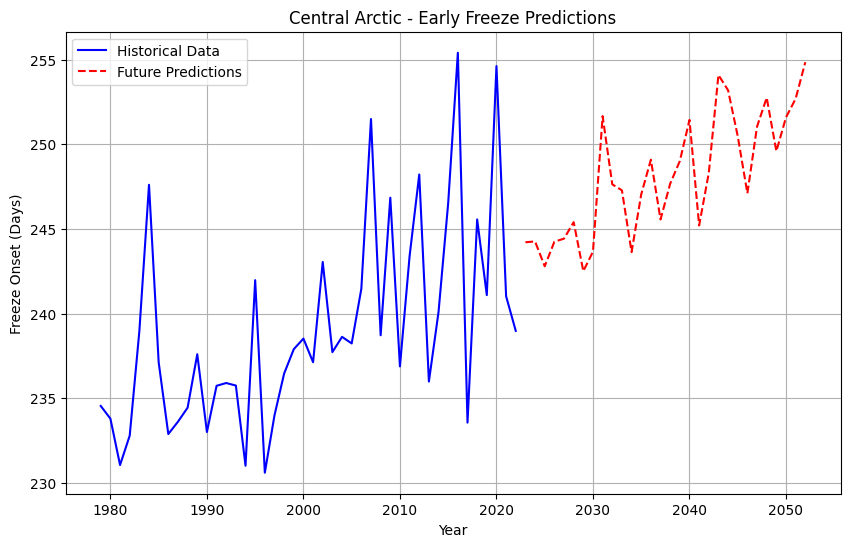

1/1 [==============================] - 0s 11ms/step


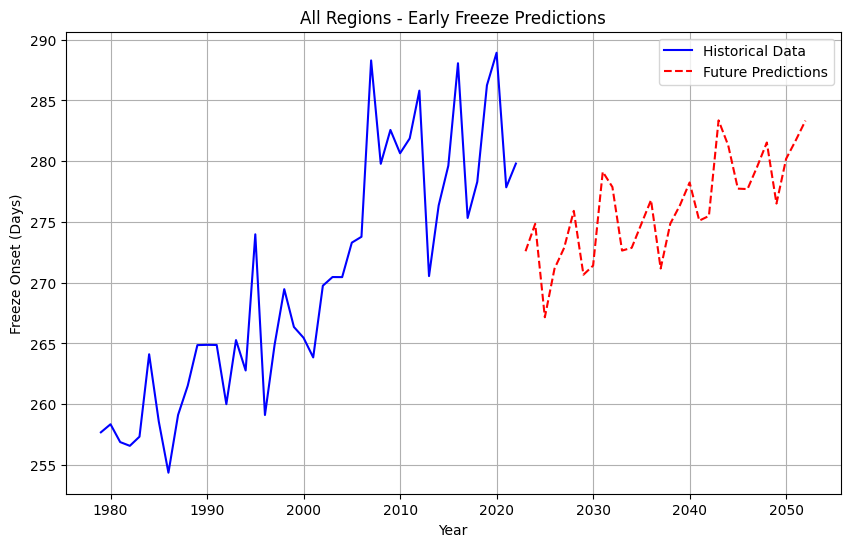

In [68]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Load and preprocess data
def load_and_preprocess(file_path, region_column):
    data = pd.read_excel(file_path)
    
    # Convert the region column to numeric, forcing errors to NaN, then drop NaNs
    data[region_column] = pd.to_numeric(data[region_column], errors='coerce')
    data = data.dropna(subset=[region_column])
    
    # Check if there is data left after cleaning
    if data.empty:
        print(f"No data available for {region_column}")
        return None, None
    
    target = data[region_column].values
    years = data['yyyy'].values
    return target, years

# Function to create sequences for LSTM model
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

# Function to fine-tune LSTM model
def fine_tune_lstm(X_lstm, y_lstm):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_lstm, y_lstm, epochs=50, batch_size=32, verbose=0)
    return model

# Function to apply SARIMA + LSTM + Random Forest hybrid model
def hybrid_model_with_future_predictions(file_path, region_column, forecast_horizon=30):
    target, years = load_and_preprocess(file_path, region_column)
    
    # Check if we have valid data
    if target is None or years is None:
        print(f"Skipping {region_column} as no data available.")
        return None, None, None, None
    
    # SARIMA model
    sarima_model = SARIMAX(target, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    sarima_results = sarima_model.fit(disp=False)

    # Get SARIMA predictions for historical and future periods
    sarima_predictions = sarima_results.predict(start=0, end=len(target)-1)
    sarima_future = sarima_results.forecast(steps=forecast_horizon)

    # Residuals for LSTM model
    residuals = target - sarima_predictions
    scaler = MinMaxScaler(feature_range=(0, 1))
    residuals_scaled = scaler.fit_transform(residuals.reshape(-1, 1))

    sequence_length = 30
    X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)
    X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

    # Train LSTM model
    lstm_model = fine_tune_lstm(X_lstm, y_lstm)

    # Prepare the last sequence for future predictions
    last_sequence = residuals_scaled[-sequence_length:]
    future_residuals = []

    # Generate future residuals using LSTM
    current_sequence = last_sequence.reshape(1, sequence_length, 1)
    for _ in range(forecast_horizon):
        next_residual = lstm_model.predict(current_sequence)
        future_residuals.append(next_residual[0, 0])
        current_sequence = np.roll(current_sequence, -1)
        current_sequence[0, -1, 0] = next_residual

    future_residuals = np.array(future_residuals).reshape(-1, 1)
    future_residuals = scaler.inverse_transform(future_residuals)

    # Step 3: Random Forest for final adjustments
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    historical_time = np.arange(len(target)).reshape(-1, 1)
    rf_model.fit(historical_time, target - sarima_predictions)

    # Future predictions
    future_years = np.arange(years[-1] + 1, years[-1] + forecast_horizon + 1)
    future_predictions = (sarima_future + future_residuals.flatten() +
                          rf_model.predict(np.arange(len(target), len(target) + forecast_horizon).reshape(-1, 1)))

    return years, target, future_years, future_predictions

# Function to plot the results for each region using matplotlib
def plot_region_predictions(file_path):
    df = pd.read_excel(file_path)
    regions = df.columns.drop('yyyy')  # Exclude the 'yyyy' column

    # Plot for each region in the dataset
    for region_name in regions:
        years, target, future_years, future_predictions = hybrid_model_with_future_predictions(file_path, region_name)
        
        if future_predictions is None:
            continue
        
        plt.figure(figsize=(10, 6))
        plt.plot(years, target, label="Historical Data", color="blue")
        plt.plot(future_years, future_predictions, label="Future Predictions", color="red", linestyle="--")
        
        plt.title(f"{region_name} - Early Freeze Predictions")
        plt.xlabel("Year")
        plt.ylabel("Freeze Onset (Days)")
        plt.legend()
        plt.grid(True)
        plt.show()

# Run the plotting function on all regions for DS3 (Early Freeze)
plot_region_predictions('DS3.xlsx')


1/1 [==============================] - 0s 13ms/step


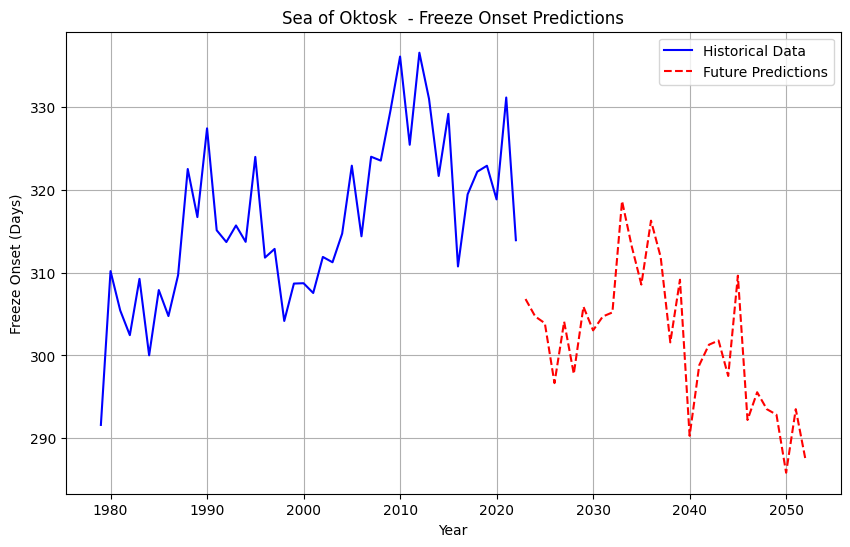

1/1 [==============================] - 0s 16ms/step


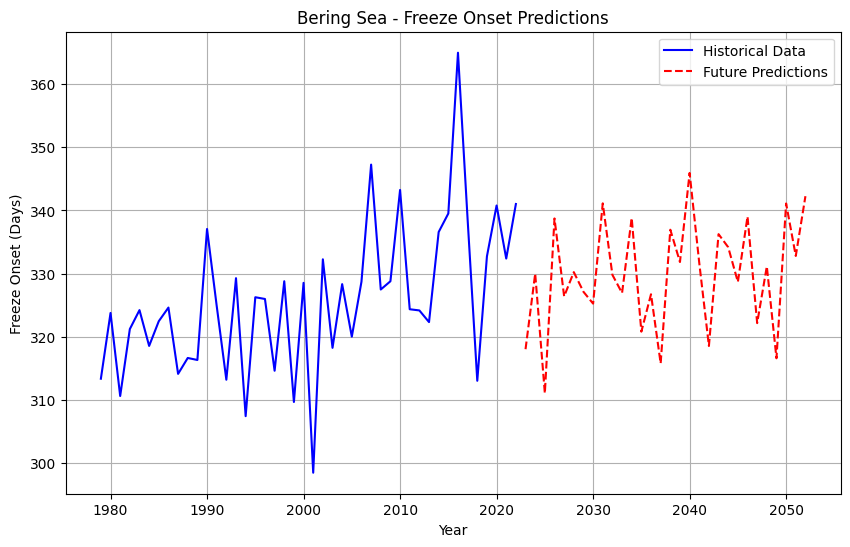

1/1 [==============================] - 0s 21ms/step


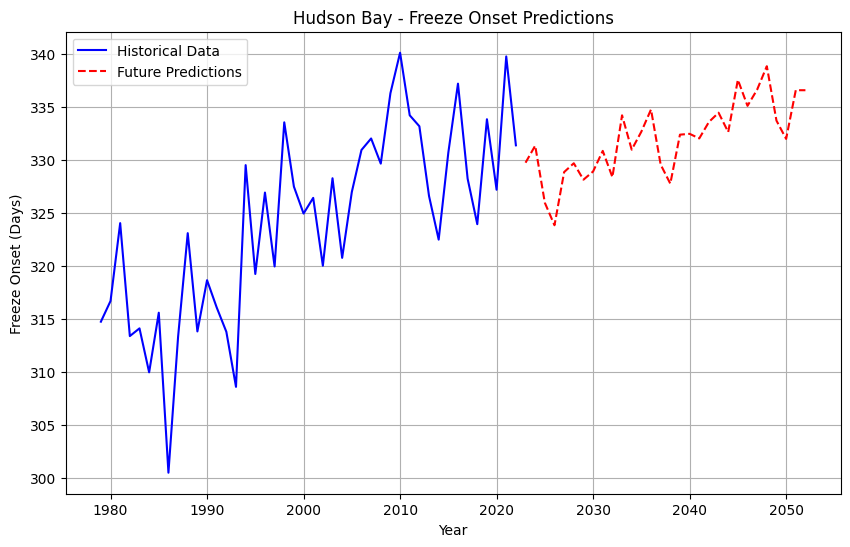

1/1 [==============================] - 0s 13ms/step


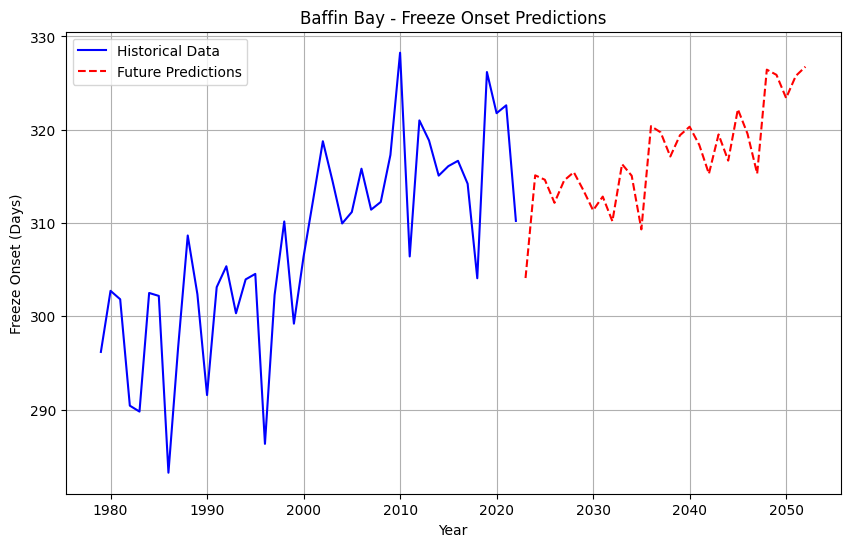

1/1 [==============================] - 0s 32ms/step


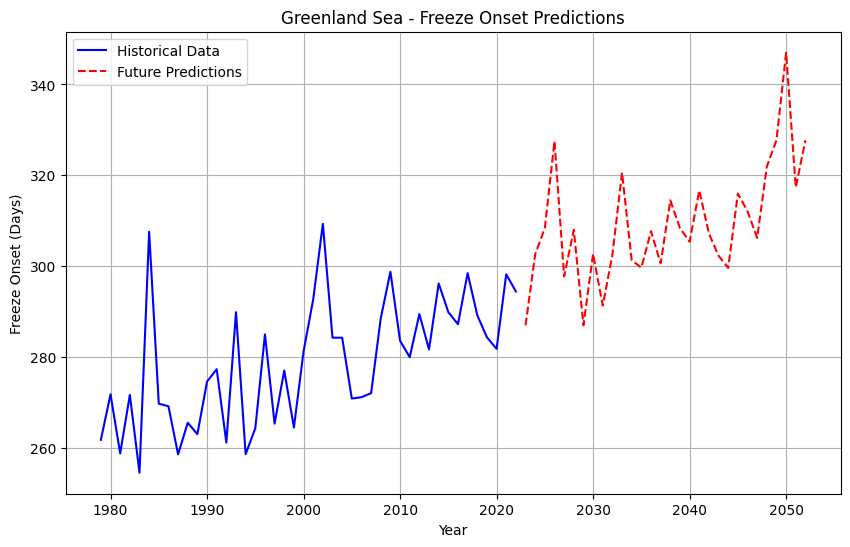

1/1 [==============================] - 0s 12ms/step


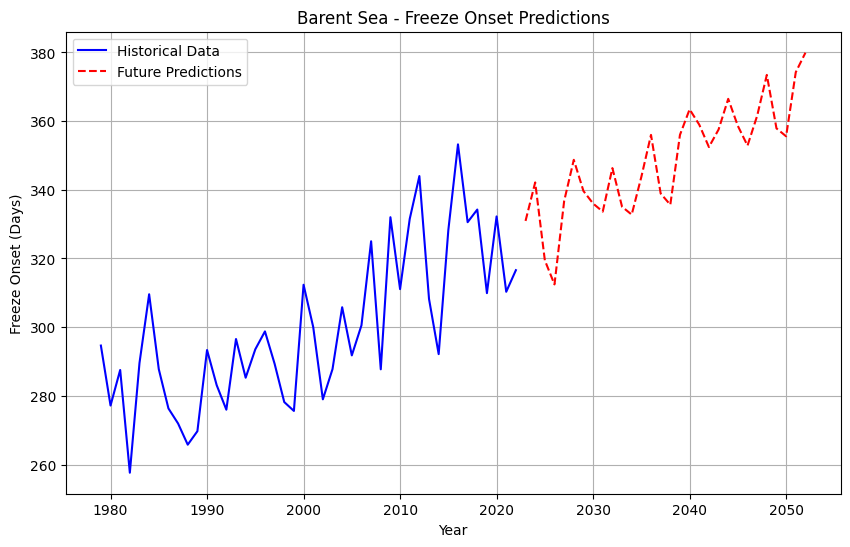

1/1 [==============================] - 0s 12ms/step


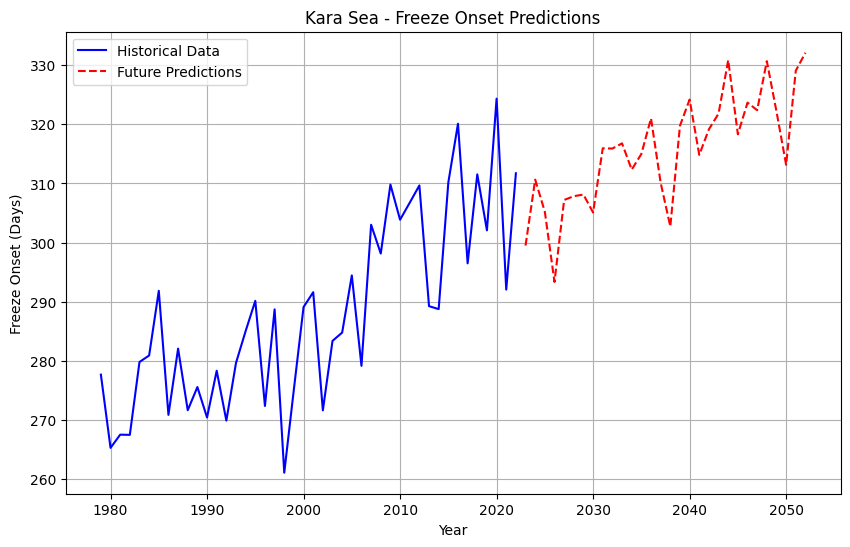

1/1 [==============================] - 0s 17ms/step


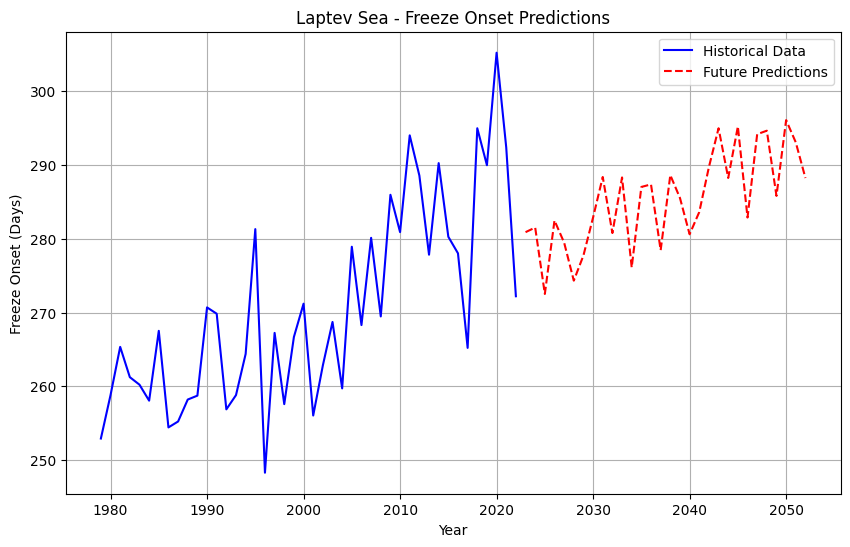

1/1 [==============================] - 0s 17ms/step


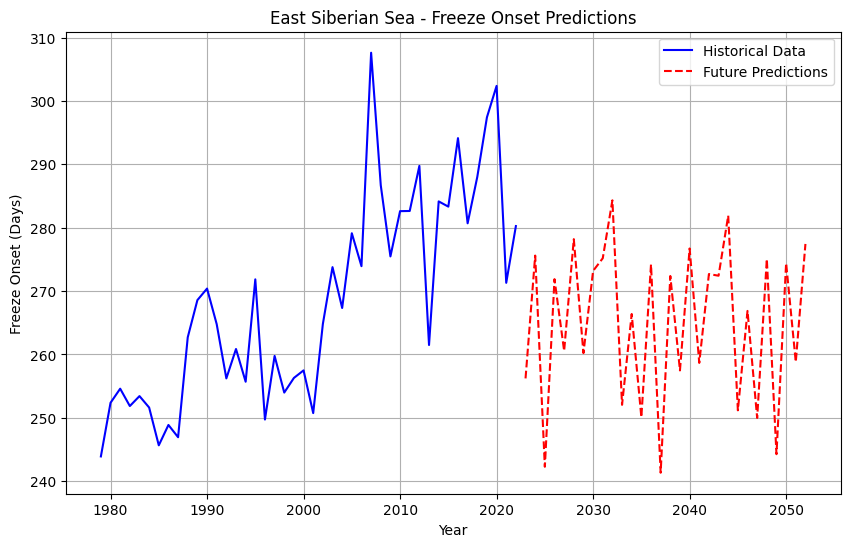

1/1 [==============================] - 0s 12ms/step


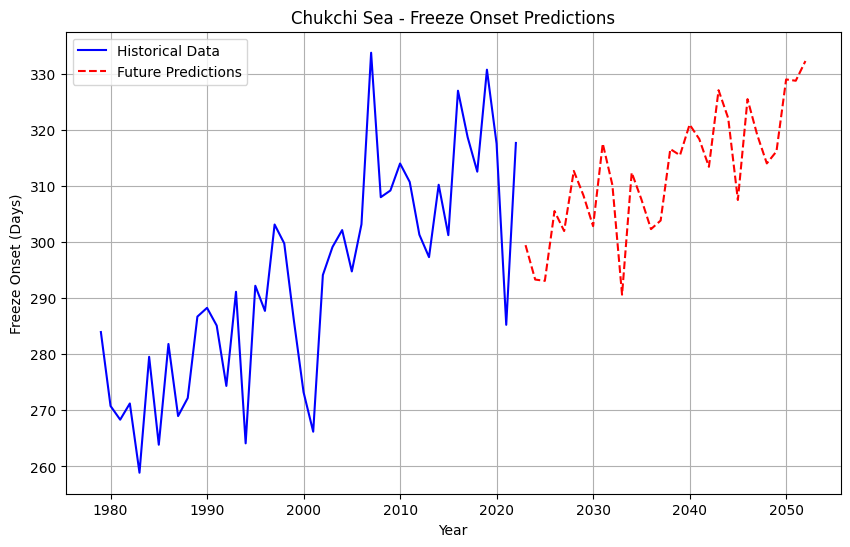

1/1 [==============================] - 0s 10ms/step


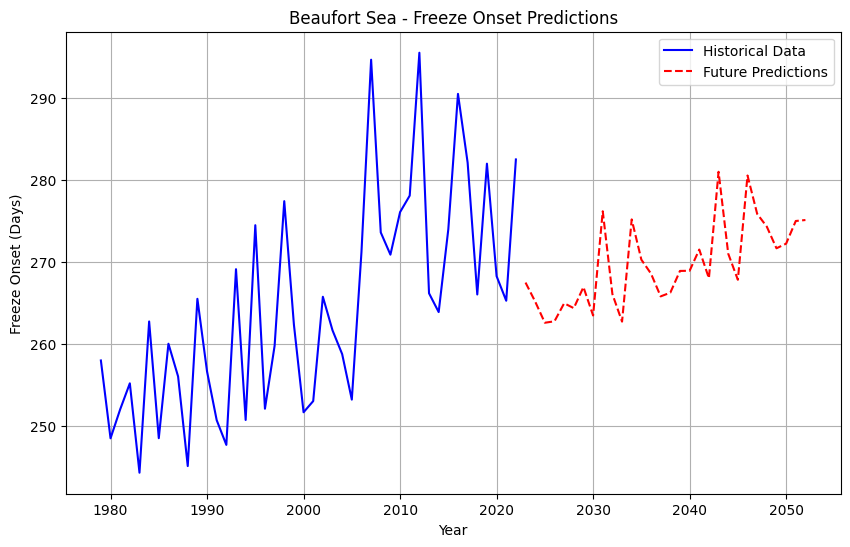

1/1 [==============================] - 0s 11ms/step


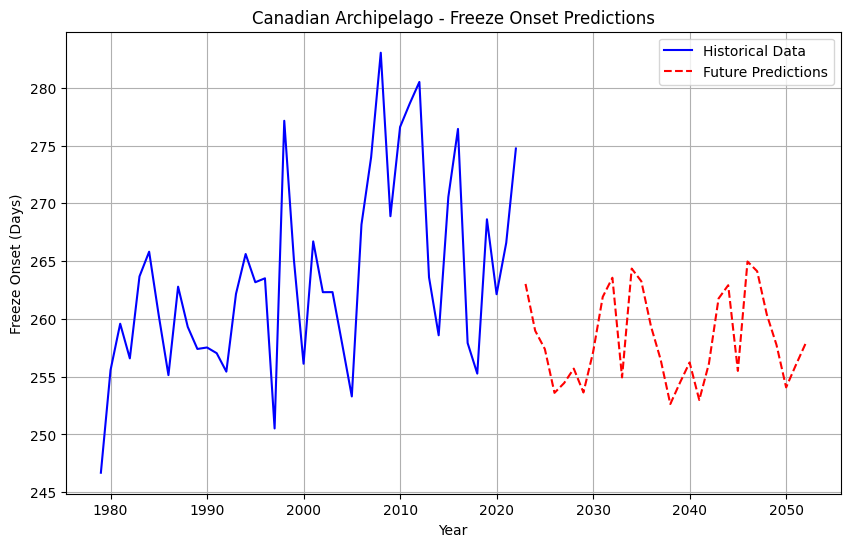

1/1 [==============================] - 0s 12ms/step


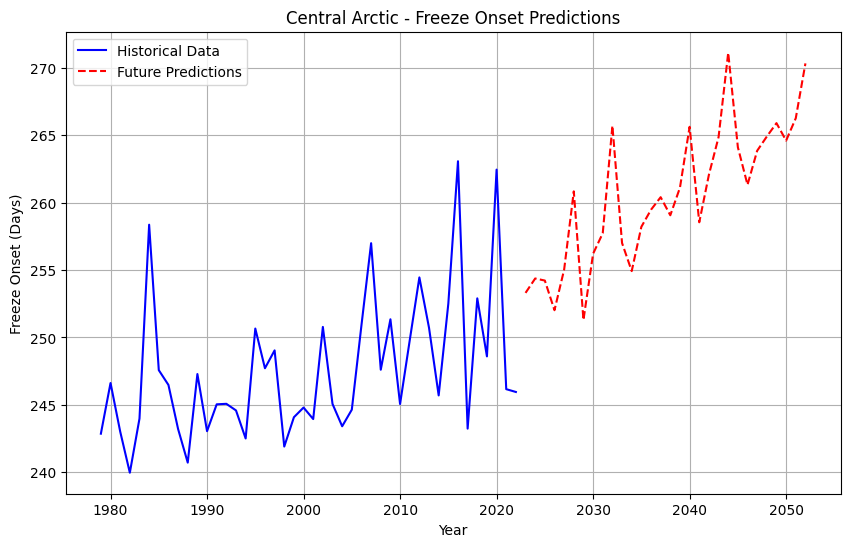

1/1 [==============================] - 0s 13ms/step


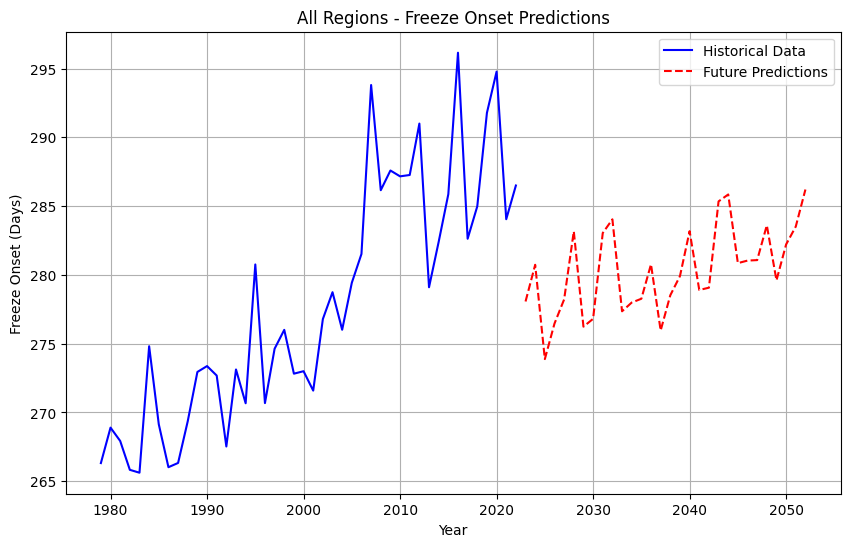

In [69]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Load and preprocess data
def load_and_preprocess(file_path, region_column):
    data = pd.read_excel(file_path)
    
    # Convert the region column to numeric, forcing errors to NaN, then drop NaNs
    data[region_column] = pd.to_numeric(data[region_column], errors='coerce')
    data = data.dropna(subset=[region_column])
    
    # Check if there is data left after cleaning
    if data.empty:
        print(f"No data available for {region_column}")
        return None, None
    
    target = data[region_column].values
    years = data['yyyy'].values
    return target, years

# Function to create sequences for LSTM model
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

# Function to fine-tune LSTM model
def fine_tune_lstm(X_lstm, y_lstm):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(X_lstm.shape[1], 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_lstm, y_lstm, epochs=50, batch_size=32, verbose=0)
    return model

# Function to apply SARIMA + LSTM + Random Forest hybrid model
def hybrid_model_with_future_predictions(file_path, region_column, forecast_horizon=30):
    target, years = load_and_preprocess(file_path, region_column)
    
    # Check if we have valid data
    if target is None or years is None:
        print(f"Skipping {region_column} as no data available.")
        return None, None, None, None
    
    # SARIMA model
    sarima_model = SARIMAX(target, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    sarima_results = sarima_model.fit(disp=False)

    # Get SARIMA predictions for historical and future periods
    sarima_predictions = sarima_results.predict(start=0, end=len(target)-1)
    sarima_future = sarima_results.forecast(steps=forecast_horizon)

    # Residuals for LSTM model
    residuals = target - sarima_predictions
    scaler = MinMaxScaler(feature_range=(0, 1))
    residuals_scaled = scaler.fit_transform(residuals.reshape(-1, 1))

    sequence_length = 30
    X_lstm, y_lstm = create_sequences(residuals_scaled, sequence_length)
    X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

    # Train LSTM model
    lstm_model = fine_tune_lstm(X_lstm, y_lstm)

    # Prepare the last sequence for future predictions
    last_sequence = residuals_scaled[-sequence_length:]
    future_residuals = []

    # Generate future residuals using LSTM
    current_sequence = last_sequence.reshape(1, sequence_length, 1)
    for _ in range(forecast_horizon):
        next_residual = lstm_model.predict(current_sequence)
        future_residuals.append(next_residual[0, 0])
        current_sequence = np.roll(current_sequence, -1)
        current_sequence[0, -1, 0] = next_residual

    future_residuals = np.array(future_residuals).reshape(-1, 1)
    future_residuals = scaler.inverse_transform(future_residuals)

    # Step 3: Random Forest for final adjustments
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    historical_time = np.arange(len(target)).reshape(-1, 1)
    rf_model.fit(historical_time, target - sarima_predictions)

    # Future predictions
    future_years = np.arange(years[-1] + 1, years[-1] + forecast_horizon + 1)
    future_predictions = (sarima_future + future_residuals.flatten() +
                          rf_model.predict(np.arange(len(target), len(target) + forecast_horizon).reshape(-1, 1)))

    return years, target, future_years, future_predictions

# Function to plot the results for each region using matplotlib
def plot_region_predictions(file_path):
    df = pd.read_excel(file_path)
    regions = df.columns.drop('yyyy')  # Exclude the 'yyyy' column

    # Plot for each region in the dataset
    for region_name in regions:
        years, target, future_years, future_predictions = hybrid_model_with_future_predictions(file_path, region_name)
        
        if future_predictions is None:
            continue
        
        plt.figure(figsize=(10, 6))
        plt.plot(years, target, label="Historical Data", color="blue")
        plt.plot(future_years, future_predictions, label="Future Predictions", color="red", linestyle="--")
        
        plt.title(f"{region_name} - Freeze Onset Predictions")
        plt.xlabel("Year")
        plt.ylabel("Freeze Onset (Days)")
        plt.legend()
        plt.grid(True)
        plt.show()

# Run the plotting function on all regions for DS4 (Freeze Onset)
plot_region_predictions('DS4.xlsx')


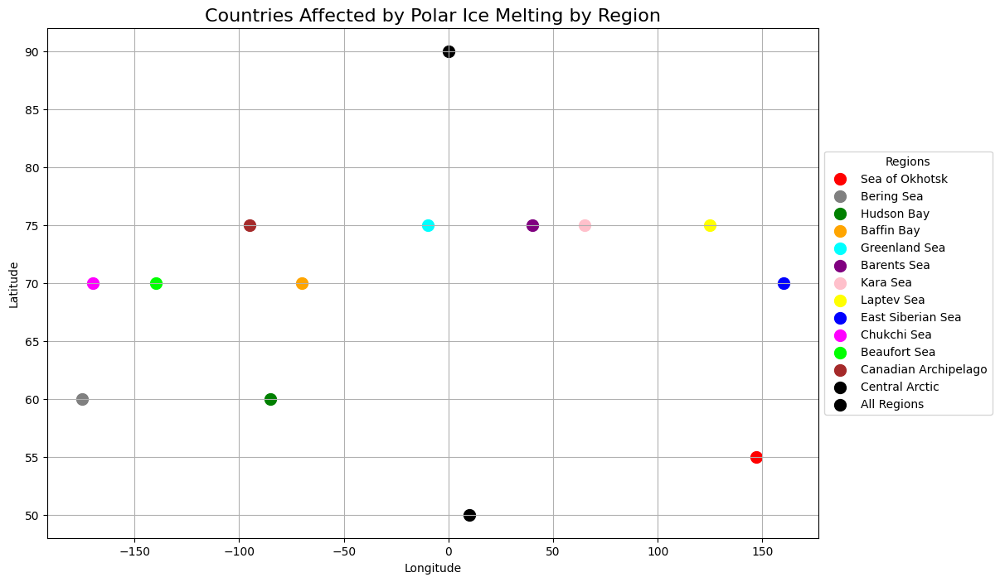

In [73]:
import matplotlib.pyplot as plt

# Manually define the latitudes and longitudes for each region
region_coords = {
    'Sea of Okhotsk': (55, 147),
    'Bering Sea': (60, -175),
    'Hudson Bay': (60, -85),
    'Baffin Bay': (70, -70),
    'Greenland Sea': (75, -10),
    'Barents Sea': (75, 40),
    'Kara Sea': (75, 65),
    'Laptev Sea': (75, 125),
    'East Siberian Sea': (70, 160),
    'Chukchi Sea': (70, -170),
    'Beaufort Sea': (70, -140),
    'Canadian Archipelago': (75, -95),
    'Central Arctic': (90, 0),  # The North Pole
    'All Regions': (50, 10)  # Placeholder for generalized points
}

# Define colors for each region
region_colors = {
    'Sea of Okhotsk': 'red',
    'Bering Sea': 'grey',
    'Hudson Bay': 'green',
    'Baffin Bay': 'orange',
    'Greenland Sea': 'cyan',
    'Barents Sea': 'purple',
    'Kara Sea': 'pink',
    'Laptev Sea': 'yellow',
    'East Siberian Sea': 'blue',
    'Chukchi Sea': 'magenta',
    'Beaufort Sea': 'lime',
    'Canadian Archipelago': 'brown',
    'Central Arctic': 'black',
    'All Regions': 'black'
}

# Plot the map using matplotlib
plt.figure(figsize=(12, 8))

# Iterate through the regions and plot them on the map
for region, (lat, lon) in region_coords.items():
    plt.scatter(lon, lat, color=region_colors[region], label=region, s=100)

# Customize the plot
plt.title("Countries Affected by Polar Ice Melting by Region", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), title="Regions")

# Display the plot
plt.grid(True)
plt.show()
